In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
plt.rcParams.update({'mathtext.default':'regular'})

### Read in csv files and clean data

In [2]:
mixnoncomp_standard_sharerandinsp_df = pd.read_csv('Percent Random Inspections, Mix non-compliant, Standard.csv')
mixnoncomp_standard_sharerandinsp_df.drop(['logit-normal-mu', 'Inspection-Strategy', 'Enforcement-Strategy',
                                  '#-Inspectors','%-Escalate','avg-violations-conscious', '%-Criminal-Offenders',
                                  '#-Inspections-per-Inspector', '%-Unintentional-Offenders',
                                  '%-Conscious-Offenders', 'avg-violations-unintentional',
                                  'radius-of-peers', 'length-of-run', 'logit-normal-sigma',
                                  '%-Deescalate', 'React-to-Inspections', '#-Inspectees',
                                  'React-to-Peer-Pressure', 'React-to-Enforcement',
                                  'avg-violations-criminal', '%-Compliant-Inspectees'], inplace=True, axis=1)
mixnoncomp_standard_sharerandinsp_df = mixnoncomp_standard_sharerandinsp_df.rename(columns={'[step]': 'step', '[run number]':'run','%-Random-Inspections':'sharerandominsp'})
mixnoncomp_standard_sharerandinsp_df['total-inspectees'] = mixnoncomp_standard_sharerandinsp_df['#-compliant-inspectees'] + mixnoncomp_standard_sharerandinsp_df['#-unintentional-violators'] + mixnoncomp_standard_sharerandinsp_df['#-conscious-violators'] + mixnoncomp_standard_sharerandinsp_df['#-criminal-violators'] 
mixnoncomp_standard_sharerandinsp_df['perc-compliant'] = mixnoncomp_standard_sharerandinsp_df['#-compliant-inspectees'] / mixnoncomp_standard_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_standard_sharerandinsp_df['perc-compliant'] = mixnoncomp_standard_sharerandinsp_df['perc-compliant'].fillna(0)
mixnoncomp_standard_sharerandinsp_df['perc-unintentional'] = mixnoncomp_standard_sharerandinsp_df['#-unintentional-violators'] / mixnoncomp_standard_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_standard_sharerandinsp_df['perc-unintentional'] = mixnoncomp_standard_sharerandinsp_df['perc-unintentional'].fillna(0)
mixnoncomp_standard_sharerandinsp_df['perc-conscious'] = mixnoncomp_standard_sharerandinsp_df['#-conscious-violators'] / mixnoncomp_standard_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_standard_sharerandinsp_df['perc-conscious'] = mixnoncomp_standard_sharerandinsp_df['perc-conscious'].fillna(0)
mixnoncomp_standard_sharerandinsp_df['perc-criminal'] = mixnoncomp_standard_sharerandinsp_df['#-criminal-violators'] / mixnoncomp_standard_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_standard_sharerandinsp_df['perc-criminal'] = mixnoncomp_standard_sharerandinsp_df['perc-criminal'].fillna(0)
mixnoncomp_standard_sharerandinsp_df['perc-noncompliant'] = (mixnoncomp_standard_sharerandinsp_df['perc-unintentional'] + mixnoncomp_standard_sharerandinsp_df['perc-conscious'] + mixnoncomp_standard_sharerandinsp_df['perc-criminal']) 
mixnoncomp_standard_sharerandinsp_df

,run,run_num,sharerandominsp,step,avg-compliance-rate,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,total-inspectees,perc-compliant,perc-unintentional,perc-conscious,perc-criminal,perc-noncompliant
0,1,1,10,0,0.000000,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,1,10,1,6.600660,3119,989,3635,133,7876,39.601320,12.557136,46.152869,1.688674,60.398680
2,1,1,10,2,8.066768,1972,288,5590,28,7878,25.031734,3.655750,70.957096,0.355420,74.968266
3,1,1,10,3,8.451807,1362,260,6207,49,7878,17.288652,3.300330,78.789033,0.621985,82.711348
4,1,1,10,4,8.712025,1097,293,6420,68,7878,13.924854,3.719218,81.492765,0.863163,86.075146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500495,500,50,100,996,6.323852,409,99,7332,38,7878,5.191673,1.256664,93.069307,0.482356,94.808327
500496,500,50,100,997,6.322851,411,94,7328,45,7878,5.217060,1.193196,93.018533,0.571211,94.782940
500497,500,50,100,998,6.321381,399,98,7341,40,7878,5.064737,1.243971,93.183549,0.507743,94.935263
500498,500,50,100,999,6.320199,415,93,7330,40,7878,5.267834,1.180503,93.043920,0.507743,94.732166


In [3]:
mixnoncomp_standard_sharerandinsp_df.drop(mixnoncomp_standard_sharerandinsp_df.index[mixnoncomp_standard_sharerandinsp_df['sharerandominsp'] == 100], inplace=True)
mixnoncomp_standard_sharerandinsp_df

,run,run_num,sharerandominsp,step,avg-compliance-rate,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,total-inspectees,perc-compliant,perc-unintentional,perc-conscious,perc-criminal,perc-noncompliant
0,1,1,10,0,0.000000,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,1,10,1,6.600660,3119,989,3635,133,7876,39.601320,12.557136,46.152869,1.688674,60.398680
2,1,1,10,2,8.066768,1972,288,5590,28,7878,25.031734,3.655750,70.957096,0.355420,74.968266
3,1,1,10,3,8.451807,1362,260,6207,49,7878,17.288652,3.300330,78.789033,0.621985,82.711348
4,1,1,10,4,8.712025,1097,293,6420,68,7878,13.924854,3.719218,81.492765,0.863163,86.075146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450445,455,50,90,996,17.638278,1394,104,6343,37,7878,17.694846,1.320132,80.515359,0.469662,82.305154
450446,455,50,90,997,17.638544,1401,98,6340,39,7878,17.783701,1.243971,80.477278,0.495050,82.216299
450447,455,50,90,998,17.639148,1404,100,6337,37,7878,17.821782,1.269358,80.439198,0.469662,82.178218
450448,455,50,90,999,17.639318,1404,102,6338,34,7878,17.821782,1.294745,80.451891,0.431582,82.178218


In [4]:
agg_summary_mixnoncomp_standard_avg = mixnoncomp_standard_sharerandinsp_df.groupby(['sharerandominsp'], as_index=False).mean()
agg_summary_mixnoncomp_standard_avg.drop(['run','step','total-inspectees'], inplace=True, axis=1)
agg_summary_mixnoncomp_standard_avg = agg_summary_mixnoncomp_standard_avg.rename(columns={'avg-compliance-rate': 'avg-compliance-rate-mean', 
                                                                                'perc-compliant':'perc-compliant-mean', 
                                                                                'perc-unintentional':'perc-unintentional-mean',
                                                                               'perc-conscious': 'perc-conscious-mean',
                                                                               'perc-criminal': 'perc-criminal-mean',
                                                                               'perc-noncompliant': 'perc-noncompliant-mean'})
agg_summary_mixnoncomp_standard_avg

,sharerandominsp,run_num,avg-compliance-rate-mean,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,perc-compliant-mean,perc-unintentional-mean,perc-conscious-mean,perc-criminal-mean,perc-noncompliant-mean
0,10,25.5,15.531696,1273.944116,313.632587,6211.244396,71.306414,16.170919,3.981123,78.842924,0.905134,83.729181
1,20,25.5,14.903323,1260.227972,290.612947,6251.109291,68.177303,15.996812,3.688921,79.348952,0.865414,83.903288
2,30,25.5,13.388814,1124.804096,265.602597,6414.592268,65.128611,14.277799,3.371450,81.424136,0.826715,85.622301
3,40,25.5,13.647553,1147.508012,240.031668,6422.739361,59.848511,14.565992,3.046864,81.527552,0.759692,85.334107
4,50,25.5,10.042235,805.262777,216.830729,6789.422517,58.611528,10.221676,2.752361,86.182072,0.743990,89.678424
5,60,25.5,12.392685,998.416563,190.754306,6627.824316,53.132468,12.673488,2.421358,84.130812,0.674442,87.226612
6,70,25.5,11.254854,888.312408,166.137542,6765.910629,49.766953,11.275873,2.108883,85.883623,0.631721,88.624227
7,80,25.5,10.658255,818.386553,141.987053,6863.502797,46.251269,10.388263,1.802327,87.122415,0.587094,89.511836
8,90,25.5,10.437061,783.184695,117.095604,6927.647293,42.200080,9.941426,1.486365,87.936638,0.535670,89.958674


In [5]:
agg_summary_mixnoncomp_standard_std = mixnoncomp_standard_sharerandinsp_df.groupby(['sharerandominsp'], as_index=False).std()
agg_summary_mixnoncomp_standard_std.drop(['run','step','total-inspectees'], inplace=True, axis=1)
agg_summary_mixnoncomp_standard_std = agg_summary_mixnoncomp_standard_std.rename(columns={'avg-compliance-rate': 'avg-compliance-rate-std', 
                                                                                'perc-compliant':'perc-compliant-std', 
                                                                                'perc-unintentional':'perc-unintentional-std',
                                                                               'perc-conscious': 'perc-conscious-std',
                                                                               'perc-criminal': 'perc-criminal-std',
                                                                               'perc-noncompliant': 'perc-noncompliant-std'})
agg_summary_mixnoncomp_standard_std

,sharerandominsp,run_num,avg-compliance-rate-std,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,perc-compliant-std,perc-unintentional-std,perc-conscious-std,perc-criminal-std,perc-noncompliant-std
0,10,14.431014,5.309979,546.994309,30.395581,572.034433,23.369477,6.943350,0.385899,7.261107,0.296643,7.413455
1,20,14.431014,6.038244,603.452079,30.298651,625.738014,21.981978,7.659998,0.384672,7.942801,0.279031,8.090709
2,30,14.431014,5.735871,575.615000,30.327040,602.974631,19.441352,7.306650,0.385035,7.653847,0.246782,7.779113
3,40,14.431014,4.861686,468.585988,30.405086,504.295181,17.556156,5.948077,0.386028,6.401240,0.222852,6.515328
4,50,14.431014,4.502431,417.527888,30.004331,467.854694,15.074431,5.299981,0.380945,5.938663,0.191351,6.002308
5,60,14.431014,5.192238,467.213039,30.042576,508.128419,13.240955,5.930652,0.381433,6.449894,0.168078,6.528449
6,70,14.431014,5.426400,473.904145,29.878684,516.975053,11.241747,6.015589,0.379356,6.562184,0.142701,6.626807
7,80,14.431014,5.724866,501.595982,29.955124,542.782935,9.092312,6.367095,0.380328,6.889783,0.115418,6.960209
8,90,14.431014,6.409713,535.026433,30.341865,572.259919,7.310808,6.791445,0.385239,7.263954,0.092806,7.356467


In [6]:
mixnoncomp_resp_sharerandinsp_df = pd.read_csv('Percent Random Inspections, Mix non-compliant, Responsive.csv')
mixnoncomp_resp_sharerandinsp_df.drop(['logit-normal-mu', 'Inspection-Strategy', 'Enforcement-Strategy',
                                  '#-Inspectors','%-Escalate','avg-violations-conscious', '%-Criminal-Offenders',
                                  '#-Inspections-per-Inspector', '%-Unintentional-Offenders',
                                  '%-Conscious-Offenders', 'avg-violations-unintentional',
                                  'radius-of-peers', 'length-of-run', 'logit-normal-sigma',
                                  '%-Deescalate', 'React-to-Inspections', '#-Inspectees',
                                  'React-to-Peer-Pressure', 'React-to-Enforcement',
                                  'avg-violations-criminal', '%-Compliant-Inspectees'], inplace=True, axis=1)
mixnoncomp_resp_sharerandinsp_df = mixnoncomp_resp_sharerandinsp_df.rename(columns={'[step]': 'step', '[run number]':'run','%-Random-Inspections':'sharerandominsp'})
mixnoncomp_resp_sharerandinsp_df['total-inspectees'] = mixnoncomp_resp_sharerandinsp_df['#-compliant-inspectees'] + mixnoncomp_resp_sharerandinsp_df['#-unintentional-violators'] + mixnoncomp_resp_sharerandinsp_df['#-conscious-violators'] + mixnoncomp_resp_sharerandinsp_df['#-criminal-violators'] 
mixnoncomp_resp_sharerandinsp_df['perc-compliant'] = mixnoncomp_resp_sharerandinsp_df['#-compliant-inspectees'] / mixnoncomp_resp_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_resp_sharerandinsp_df['perc-compliant'] = mixnoncomp_resp_sharerandinsp_df['perc-compliant'].fillna(0)
mixnoncomp_resp_sharerandinsp_df['perc-unintentional'] = mixnoncomp_resp_sharerandinsp_df['#-unintentional-violators'] / mixnoncomp_resp_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_resp_sharerandinsp_df['perc-unintentional'] = mixnoncomp_resp_sharerandinsp_df['perc-unintentional'].fillna(0)
mixnoncomp_resp_sharerandinsp_df['perc-conscious'] = mixnoncomp_resp_sharerandinsp_df['#-conscious-violators'] / mixnoncomp_resp_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_resp_sharerandinsp_df['perc-conscious'] = mixnoncomp_resp_sharerandinsp_df['perc-conscious'].fillna(0)
mixnoncomp_resp_sharerandinsp_df['perc-criminal'] = mixnoncomp_resp_sharerandinsp_df['#-criminal-violators'] / mixnoncomp_resp_sharerandinsp_df['total-inspectees'] * 100
mixnoncomp_resp_sharerandinsp_df['perc-criminal'] = mixnoncomp_resp_sharerandinsp_df['perc-criminal'].fillna(0)
mixnoncomp_resp_sharerandinsp_df['perc-noncompliant'] = (mixnoncomp_resp_sharerandinsp_df['perc-unintentional'] + mixnoncomp_resp_sharerandinsp_df['perc-conscious'] + mixnoncomp_resp_sharerandinsp_df['perc-criminal']) 
mixnoncomp_resp_sharerandinsp_df

,run,run_num,sharerandominsp,step,avg-compliance-rate,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,total-inspectees,perc-compliant,perc-unintentional,perc-conscious,perc-criminal,perc-noncompliant
0,1,1,10,0,0.000000,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,1,10,1,6.105611,3119,989,3635,133,7876,39.601320,12.557136,46.152869,1.688674,60.398680
2,1,1,10,2,9.259964,2902,314,4656,6,7878,36.836761,3.985783,59.101295,0.076161,63.163239
3,1,1,10,3,10.850893,2732,265,4871,10,7878,34.678853,3.363798,61.830414,0.126936,65.321147
4,1,1,10,4,11.844165,2732,280,4849,17,7878,34.678853,3.554202,61.551155,0.215791,65.321147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500495,500,50,100,996,89.405386,7878,0,0,0,7878,100.000000,0.000000,0.000000,0.000000,0.000000
500496,500,50,100,997,89.416020,7878,0,0,0,7878,100.000000,0.000000,0.000000,0.000000,0.000000
500497,500,50,100,998,89.426439,7878,0,0,0,7878,100.000000,0.000000,0.000000,0.000000,0.000000
500498,500,50,100,999,89.436818,7878,0,0,0,7878,100.000000,0.000000,0.000000,0.000000,0.000000


In [7]:
mixnoncomp_resp_sharerandinsp_df.drop(mixnoncomp_resp_sharerandinsp_df.index[mixnoncomp_resp_sharerandinsp_df['sharerandominsp'] == 100], inplace=True)
mixnoncomp_resp_sharerandinsp_df

,run,run_num,sharerandominsp,step,avg-compliance-rate,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,total-inspectees,perc-compliant,perc-unintentional,perc-conscious,perc-criminal,perc-noncompliant
0,1,1,10,0,0.000000,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,1,10,1,6.105611,3119,989,3635,133,7876,39.601320,12.557136,46.152869,1.688674,60.398680
2,1,1,10,2,9.259964,2902,314,4656,6,7878,36.836761,3.985783,59.101295,0.076161,63.163239
3,1,1,10,3,10.850893,2732,265,4871,10,7878,34.678853,3.363798,61.830414,0.126936,65.321147
4,1,1,10,4,11.844165,2732,280,4849,17,7878,34.678853,3.554202,61.551155,0.215791,65.321147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450445,455,50,90,996,95.652159,7842,26,10,0,7878,99.543031,0.330033,0.126936,0.000000,0.456969
450446,455,50,90,997,95.656012,7842,26,10,0,7878,99.543031,0.330033,0.126936,0.000000,0.456969
450447,455,50,90,998,95.659897,7842,26,10,0,7878,99.543031,0.330033,0.126936,0.000000,0.456969
450448,455,50,90,999,95.663586,7843,25,10,0,7878,99.555725,0.317339,0.126936,0.000000,0.444275


In [8]:
agg_summary_mixnoncomp_resp_avg = mixnoncomp_resp_sharerandinsp_df.groupby(['sharerandominsp'], as_index=False).mean()
agg_summary_mixnoncomp_resp_avg.drop(['run','step','total-inspectees'], inplace=True, axis=1)
agg_summary_mixnoncomp_resp_avg = agg_summary_mixnoncomp_resp_avg.rename(columns={'avg-compliance-rate': 'avg-compliance-rate-mean', 
                                                                                'perc-compliant':'perc-compliant-mean', 
                                                                                'perc-unintentional':'perc-unintentional-mean',
                                                                               'perc-conscious': 'perc-conscious-mean',
                                                                               'perc-criminal': 'perc-criminal-mean',
                                                                               'perc-noncompliant': 'perc-noncompliant-mean'})
agg_summary_mixnoncomp_resp_avg

,sharerandominsp,run_num,avg-compliance-rate-mean,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,perc-compliant-mean,perc-unintentional-mean,perc-conscious-mean,perc-criminal-mean,perc-noncompliant-mean
0,10,25.5,84.831609,7433.207672,178.758362,257.387652,0.773926,94.354006,2.269086,3.267183,0.009824,5.546094
1,20,25.5,84.157382,7385.818022,174.198641,309.293546,0.817363,93.752462,2.211207,3.926055,0.010376,6.147638
2,30,25.5,84.118682,7385.686833,163.210829,320.405455,0.824296,93.750797,2.071733,4.067106,0.010464,6.149302
3,40,25.5,83.344749,7366.668132,150.156064,352.464476,0.838741,93.509382,1.906021,4.474050,0.010647,6.390718
4,50,25.5,80.467413,7263.683596,135.098581,470.409191,0.936264,92.202139,1.714888,5.971189,0.011885,7.697961
5,60,25.5,83.015733,7370.115844,114.403796,384.769610,0.838322,93.553145,1.452197,4.884116,0.010642,6.346955
6,70,25.5,80.491463,7286.560100,95.130410,487.493766,0.943257,92.492524,1.207549,6.188054,0.011974,7.407576
7,80,25.5,81.154117,7310.008951,69.655624,489.558521,0.904356,92.790174,0.884182,6.214263,0.011480,7.109926
8,90,25.5,80.979180,7289.678541,41.932408,537.620180,0.896543,92.532107,0.532276,6.824336,0.011381,7.367993


In [9]:
agg_summary_mixnoncomp_resp_std = mixnoncomp_resp_sharerandinsp_df.groupby(['sharerandominsp'], as_index=False).std()
agg_summary_mixnoncomp_resp_std.drop(['run','step','total-inspectees'], inplace=True, axis=1)
agg_summary_mixnoncomp_resp_std = agg_summary_mixnoncomp_resp_std.rename(columns={'avg-compliance-rate': 'avg-compliance-rate-std', 
                                                                                'perc-compliant':'perc-compliant-std', 
                                                                                'perc-unintentional':'perc-unintentional-std',
                                                                               'perc-conscious': 'perc-conscious-std',
                                                                               'perc-criminal': 'perc-criminal-std',
                                                                               'perc-noncompliant': 'perc-noncompliant-std'})
agg_summary_mixnoncomp_resp_std

,sharerandominsp,run_num,avg-compliance-rate-std,#-compliant-inspectees,#-unintentional-violators,#-conscious-violators,#-criminal-violators,perc-compliant-std,perc-unintentional-std,perc-conscious-std,perc-criminal-std,perc-noncompliant-std
0,10,14.431014,17.460587,847.470769,51.143251,774.445617,4.576254,10.757378,0.649241,9.830545,0.058101,10.336783
1,20,14.431014,16.260516,945.971962,50.988463,875.787497,4.631722,12.007716,0.647277,11.116929,0.058805,11.637583
2,30,14.431014,15.632310,955.713994,48.580544,887.594093,4.657600,12.131374,0.616716,11.266801,0.059134,11.765146
3,40,14.431014,15.955249,1018.417718,46.469294,954.928769,4.674186,12.927312,0.589920,12.121515,0.059344,12.586185
4,50,14.431014,17.389554,1195.357848,43.760487,1140.958710,4.729716,15.173328,0.555540,14.482885,0.060049,14.892540
5,60,14.431014,15.620452,1032.600504,41.014984,975.137451,4.676584,13.107346,0.520695,12.378029,0.059375,12.770687
6,70,14.431014,16.326605,1151.331957,38.629092,1101.000609,4.736302,14.614478,0.490416,13.975678,0.060133,14.320713
7,80,14.431014,15.580793,1109.453244,36.756698,1061.114895,4.682800,14.082884,0.466655,13.469388,0.059454,13.775630
8,90,14.431014,15.174040,1100.221754,35.127646,1055.055766,4.636432,13.965708,0.445982,13.392471,0.058865,13.657705


In [10]:
avg_compliance_standard = pd.concat([agg_summary_mixnoncomp_standard_avg['sharerandominsp'],agg_summary_mixnoncomp_standard_avg['avg-compliance-rate-mean'], agg_summary_mixnoncomp_standard_std['avg-compliance-rate-std']], axis=1)
avg_compliance_standard.set_index('sharerandominsp', inplace=True)
avg_compliance_standard.round(decimals=3)

,avg-compliance-rate-mean,avg-compliance-rate-std
sharerandominsp,,
10,15.532,5.310
20,14.903,6.038
30,13.389,5.736
40,13.648,4.862
50,10.042,4.502
60,12.393,5.192
70,11.255,5.426
80,10.658,5.725
90,10.437,6.410


In [11]:
avg_compliance_standard = pd.concat([agg_summary_mixnoncomp_standard_avg['sharerandominsp'],agg_summary_mixnoncomp_standard_avg['perc-compliant-mean'], agg_summary_mixnoncomp_standard_std['perc-compliant-std']], axis=1)
avg_compliance_standard.set_index('sharerandominsp', inplace=True)
avg_compliance_standard.round(decimals=3)

,perc-compliant-mean,perc-compliant-std
sharerandominsp,,
10,16.171,6.943
20,15.997,7.660
30,14.278,7.307
40,14.566,5.948
50,10.222,5.300
60,12.673,5.931
70,11.276,6.016
80,10.388,6.367
90,9.941,6.791


In [12]:
avg_compliance_resp = pd.concat([agg_summary_mixnoncomp_resp_avg['sharerandominsp'],agg_summary_mixnoncomp_resp_avg['avg-compliance-rate-mean'], agg_summary_mixnoncomp_resp_std['avg-compliance-rate-std']], axis=1)
avg_compliance_resp.set_index('sharerandominsp', inplace=True)
avg_compliance_resp.round(decimals=3)

,avg-compliance-rate-mean,avg-compliance-rate-std
sharerandominsp,,
10,84.832,17.461
20,84.157,16.261
30,84.119,15.632
40,83.345,15.955
50,80.467,17.390
60,83.016,15.620
70,80.491,16.327
80,81.154,15.581
90,80.979,15.174


In [24]:
avg_compliance_resp = pd.concat([agg_summary_mixnoncomp_resp_avg['sharerandominsp'],agg_summary_mixnoncomp_resp_avg['perc-compliant-mean'], agg_summary_mixnoncomp_resp_std['perc-compliant-std']], axis=1)
avg_compliance_resp.set_index('sharerandominsp', inplace=True)
avg_compliance_resp.round(decimals=3)

,perc-compliant-mean,perc-compliant-std
sharerandominsp,,
10,94.354,10.757
20,93.752,12.008
30,93.751,12.131
40,93.509,12.927
50,92.202,15.173
60,93.553,13.107
70,92.493,14.614
80,92.790,14.083
90,92.532,13.966


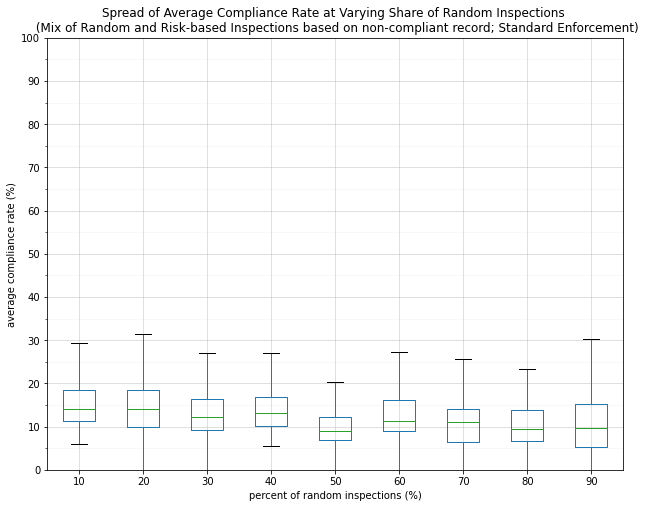

In [13]:
fig, ax = plt.subplots(figsize=(10,8))
mixnoncomp_standard_sharerandinsp_df.boxplot(column='avg-compliance-rate',by='sharerandominsp', ax=ax,showfliers=False)
plt.title('Spread of Average Compliance Rate at Varying Share of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Standard Enforcement)')
plt.ylabel('average compliance rate (%)')
plt.xlabel('percent of random inspections (%)')
plt.grid(True)
plt.ylim(0,100.01)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
fig.suptitle('')  # turns off automatical subtitles
plt.savefig('Percent Random Inspections Boxplot Avg Compliance Rate Standard.png', dpi=300, bbox_inches='tight')

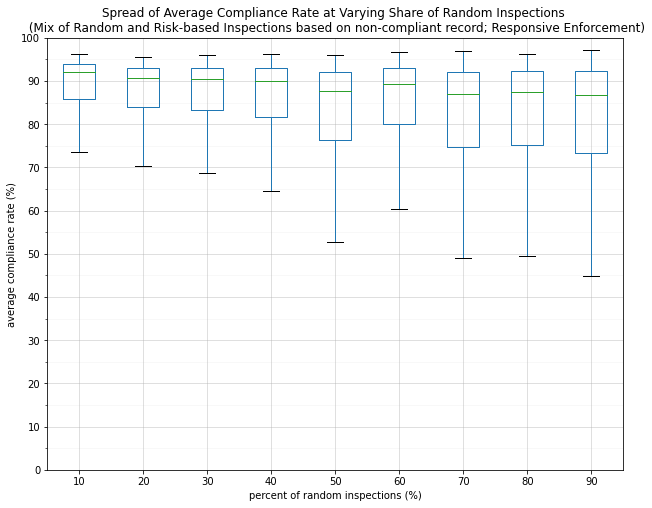

In [14]:
fig, ax = plt.subplots(figsize=(10,8))
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)
mixnoncomp_resp_sharerandinsp_df.boxplot(column='avg-compliance-rate',by='sharerandominsp', ax=ax,showfliers=False)
plt.title('Spread of Average Compliance Rate at Varying Share of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Responsive Enforcement)')
plt.ylabel('average compliance rate (%)')
plt.xlabel('percent of random inspections (%)')
plt.grid(True)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
fig.suptitle('')  # turns off automatical subtitles
plt.savefig('Percent Random Inspections Boxplot Avg Compliance Rate Responsive.png', dpi=300, bbox_inches='tight')

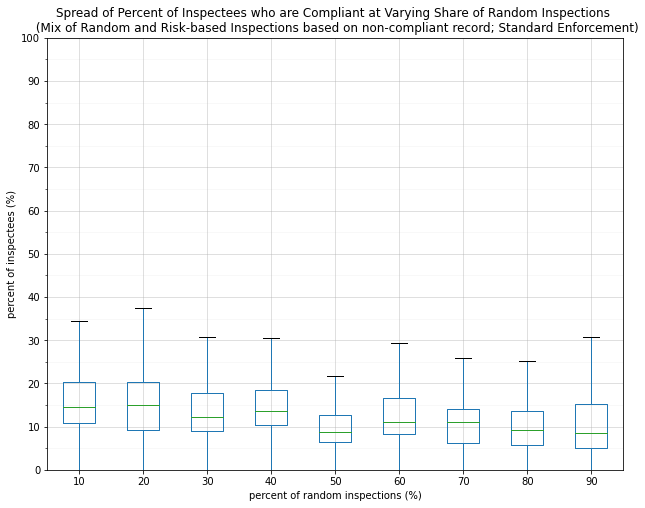

In [22]:
fig, ax = plt.subplots(figsize=(10,8))
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)
mixnoncomp_standard_sharerandinsp_df.boxplot(column='perc-compliant',by='sharerandominsp', ax=ax,showfliers=False)
plt.title('Spread of Percent of Inspectees who are Compliant at Varying Share of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Standard Enforcement)')
plt.ylabel('percent of inspectees (%)')
plt.xlabel('percent of random inspections (%)')
plt.grid(True)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
fig.suptitle('')  # turns off automatical subtitles
plt.savefig('Percent Random Inspections Boxplot Perc Compliant Standard.png', dpi=300, bbox_inches='tight')

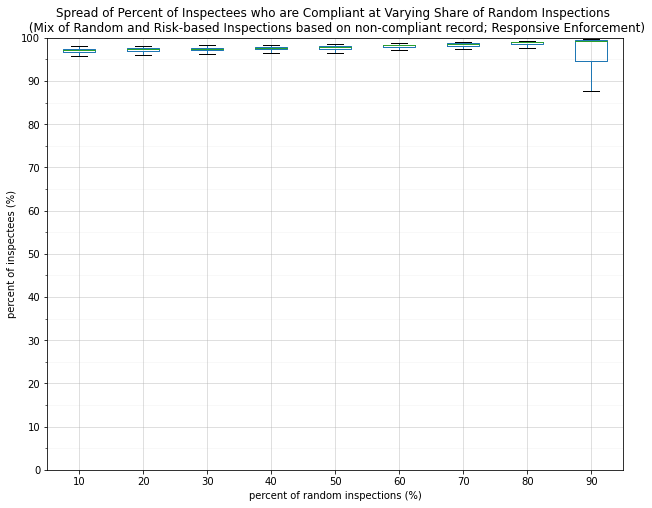

In [23]:
fig, ax = plt.subplots(figsize=(10,8))
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)
mixnoncomp_resp_sharerandinsp_df.boxplot(column='perc-compliant',by='sharerandominsp', ax=ax,showfliers=False)
plt.title('Spread of Percent of Inspectees who are Compliant at Varying Share of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Responsive Enforcement)')
plt.ylabel('percent of inspectees (%)')
plt.xlabel('percent of random inspections (%)')
plt.grid(True)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
fig.suptitle('')  # turns off automatical subtitles
plt.savefig('Percent Random Inspections Boxplot Perc Compliant Responsive.png', dpi=300, bbox_inches='tight')

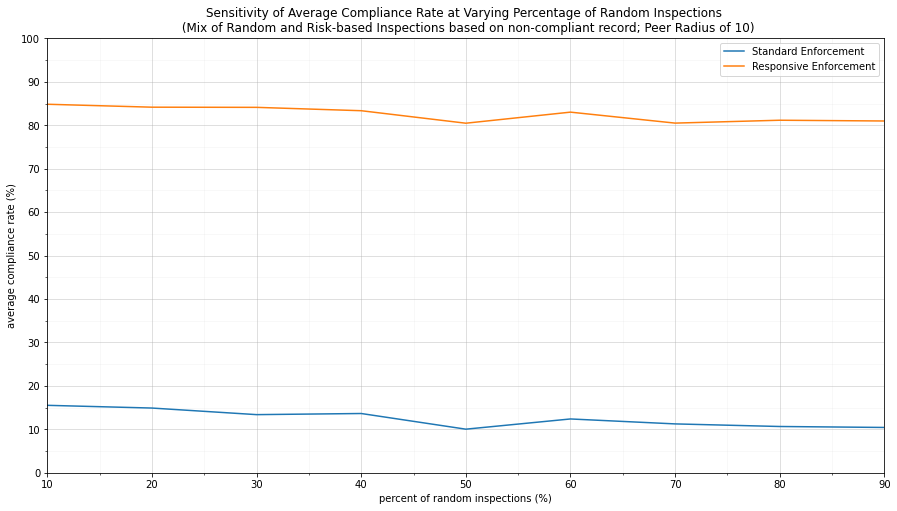

<Figure size 432x288 with 0 Axes>

In [18]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(10, 100.1, 10))
ax.set_xticks(np.arange(10, 100.1, 5), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['avg-compliance-rate-mean'], label="Standard Enforcement")
plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['avg-compliance-rate-mean'], label="Responsive Enforcement")

plt.title("Sensitivity of Average Compliance Rate at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10)")
plt.xlabel('percent of random inspections (%)')
plt.ylabel('average compliance rate (%)')
plt.xlim(10,90)
plt.ylim(0,100.1)
plt.grid(True)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections vs Avg Compliance Rate (Mix non-compliant, Both, Radius 10).png', dpi=300, bbox_inches='tight')

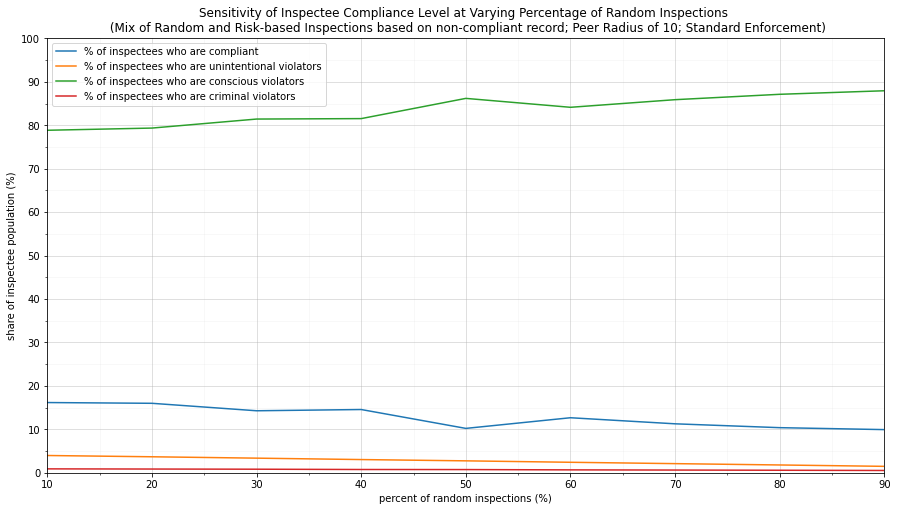

<Figure size 432x288 with 0 Axes>

In [78]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(10, 100.1, 10))
ax.set_xticks(np.arange(10, 100.1, 5), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['perc-compliant-mean'],label="% of inspectees who are compliant")
plt.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['perc-unintentional-mean'],label="% of inspectees who are unintentional violators")
plt.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['perc-conscious-mean'],label="% of inspectees who are conscious violators")
plt.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['perc-criminal-mean'],label="% of inspectees who are criminal violators")

plt.title("Sensitivity of Inspectee Compliance Level at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('percent of random inspections (%)')
plt.ylabel('share of inspectee population (%)')
plt.xlim(10,90)
plt.ylim(0,100.1)
plt.grid(True)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections vs Compliance Breakdown (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

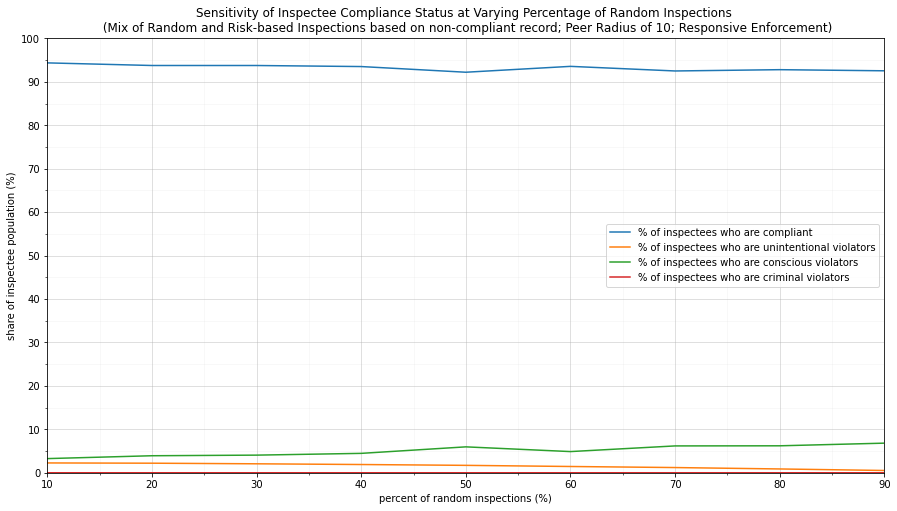

<Figure size 432x288 with 0 Axes>

In [77]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(10, 100.1, 10))
ax.set_xticks(np.arange(10, 100.1, 5), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-compliant-mean'],label="% of inspectees who are compliant")
plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-unintentional-mean'],label="% of inspectees who are unintentional violators")
plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-conscious-mean'],label="% of inspectees who are conscious violators")
plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-criminal-mean'],label="% of inspectees who are criminal violators")

plt.title("Sensitivity of Inspectee Compliance Status at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('percent of random inspections (%)')
plt.ylabel('share of inspectee population (%)')
plt.xlim(10,90)
plt.ylim(0,100.1)
plt.grid(True)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections vs Compliance Breakdown (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

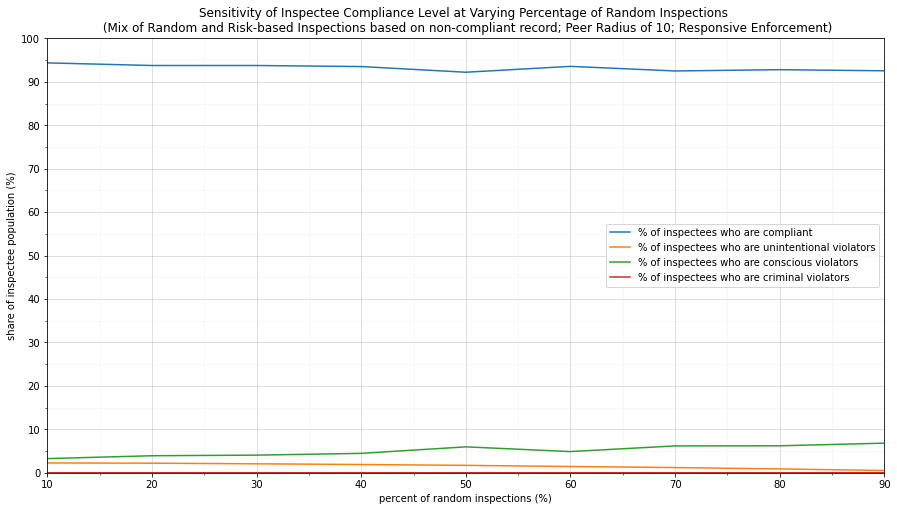

<Figure size 432x288 with 0 Axes>

In [79]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(10, 100.1, 10))
ax.set_xticks(np.arange(10, 100.1, 5), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-compliant-mean'],label="% of inspectees who are compliant")
plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-unintentional-mean'],label="% of inspectees who are unintentional violators")
plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-conscious-mean'],label="% of inspectees who are conscious violators")
plt.plot(agg_summary_mixnoncomp_resp_avg['sharerandominsp'], agg_summary_mixnoncomp_resp_avg['perc-criminal-mean'],label="% of inspectees who are criminal violators")

plt.title("Sensitivity of Inspectee Compliance Level at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('percent of random inspections (%)')
plt.ylabel('share of inspectee population (%)')
plt.xlim(10,90)
plt.ylim(0,100.1)
plt.grid(True)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections vs Compliance Breakdown (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

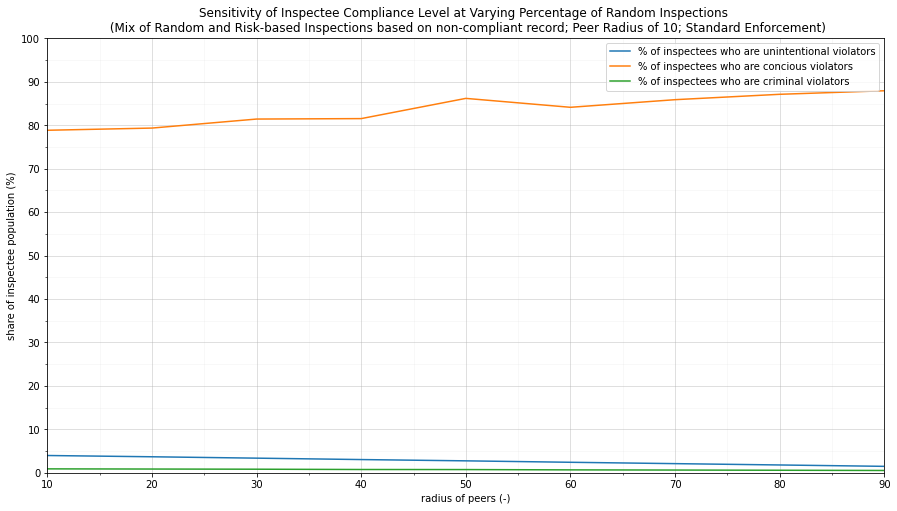

<Figure size 432x288 with 0 Axes>

In [75]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(10, 100.1, 10))
ax.set_xticks(np.arange(10, 100.1, 5), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

ax.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['perc-unintentional-mean'],label="% of inspectees who are unintentional violators")
ax.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['perc-conscious-mean'],label="% of inspectees who are concious violators")
ax.plot(agg_summary_mixnoncomp_standard_avg['sharerandominsp'], agg_summary_mixnoncomp_standard_avg['perc-criminal-mean'],label="% of inspectees who are criminal violators")

plt.title("Sensitivity of Inspectee Compliance Level at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('radius of peers (-)')
plt.ylabel('share of inspectee population (%)')

ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.xlim(10,90)
plt.ylim(0,100.1)
plt.grid(True)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections vs Compliance Breakdown (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

#### Plot average for each value of % random inspections

In [26]:
# Create new dataframes by compliant share value
for i, x in mixnoncomp_standard_sharerandinsp_df.groupby('sharerandominsp'):
    globals()['mixnoncomp_standard_sharerandinsp_' + str(i)] = x

for i, x in mixnoncomp_resp_sharerandinsp_df.groupby('sharerandominsp'):
    globals()['mixnoncomp_resp_sharerandinsp_' + str(i)] = x

In [27]:
mixnoncomp_standard_sharerandinsp_10_step = mixnoncomp_standard_sharerandinsp_10.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_20_step = mixnoncomp_standard_sharerandinsp_20.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_30_step = mixnoncomp_standard_sharerandinsp_30.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_40_step = mixnoncomp_standard_sharerandinsp_40.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_50_step = mixnoncomp_standard_sharerandinsp_50.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_60_step = mixnoncomp_standard_sharerandinsp_60.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_70_step = mixnoncomp_standard_sharerandinsp_70.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_80_step = mixnoncomp_standard_sharerandinsp_80.groupby(['step'], as_index=False).mean()
mixnoncomp_standard_sharerandinsp_90_step = mixnoncomp_standard_sharerandinsp_90.groupby(['step'], as_index=False).mean()

In [28]:
mixnoncomp_resp_sharerandinsp_10_step = mixnoncomp_resp_sharerandinsp_10.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_20_step = mixnoncomp_resp_sharerandinsp_20.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_30_step = mixnoncomp_resp_sharerandinsp_30.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_40_step = mixnoncomp_resp_sharerandinsp_40.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_50_step = mixnoncomp_resp_sharerandinsp_50.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_60_step = mixnoncomp_resp_sharerandinsp_60.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_70_step = mixnoncomp_resp_sharerandinsp_70.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_80_step = mixnoncomp_resp_sharerandinsp_80.groupby(['step'], as_index=False).mean()
mixnoncomp_resp_sharerandinsp_90_step = mixnoncomp_resp_sharerandinsp_90.groupby(['step'], as_index=False).mean()

### Standard Enforcement

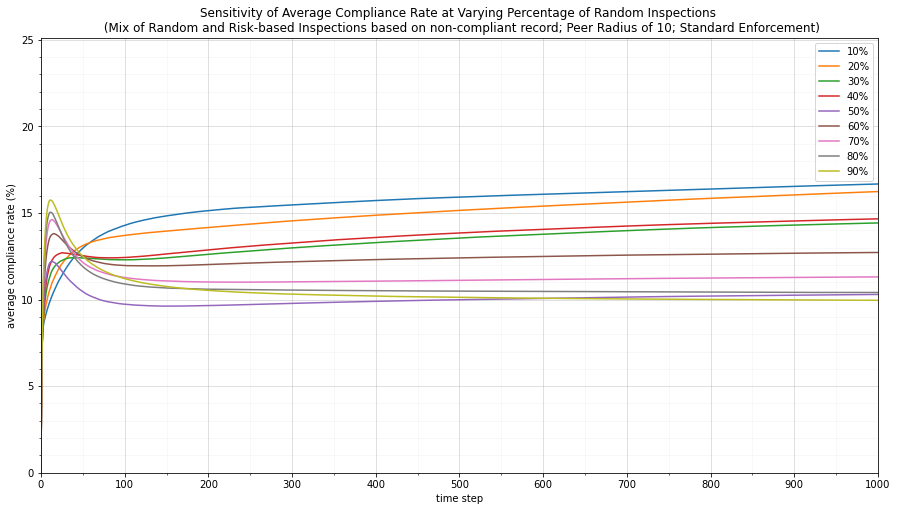

<Figure size 432x288 with 0 Axes>

In [120]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,25.1,5))
ax.set_yticks(np.arange(0,25.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_step['step'], mixnoncomp_standard_sharerandinsp_10_step['avg-compliance-rate'], label="10%")
plt.plot(mixnoncomp_standard_sharerandinsp_20_step['step'], mixnoncomp_standard_sharerandinsp_20_step['avg-compliance-rate'], label="20%")
plt.plot(mixnoncomp_standard_sharerandinsp_30_step['step'], mixnoncomp_standard_sharerandinsp_30_step['avg-compliance-rate'], label="30%")
plt.plot(mixnoncomp_standard_sharerandinsp_40_step['step'], mixnoncomp_standard_sharerandinsp_40_step['avg-compliance-rate'], label="40%")
plt.plot(mixnoncomp_standard_sharerandinsp_50_step['step'], mixnoncomp_standard_sharerandinsp_50_step['avg-compliance-rate'], label="50%")
plt.plot(mixnoncomp_standard_sharerandinsp_60_step['step'], mixnoncomp_standard_sharerandinsp_60_step['avg-compliance-rate'], label="60%")
plt.plot(mixnoncomp_standard_sharerandinsp_70_step['step'], mixnoncomp_standard_sharerandinsp_70_step['avg-compliance-rate'], label="70%")
plt.plot(mixnoncomp_standard_sharerandinsp_80_step['step'], mixnoncomp_standard_sharerandinsp_80_step['avg-compliance-rate'], label="80%")
plt.plot(mixnoncomp_standard_sharerandinsp_90_step['step'], mixnoncomp_standard_sharerandinsp_90_step['avg-compliance-rate'], label="90%")

plt.title("Sensitivity of Average Compliance Rate at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,25.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
#plt.legend(loc="center left", ncol = len(ax.lines),bbox_to_anchor=(.08, -.14) )
plt.show()
plt.savefig('Percent Random Inspections- Time vs Avg Compliance Rate (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

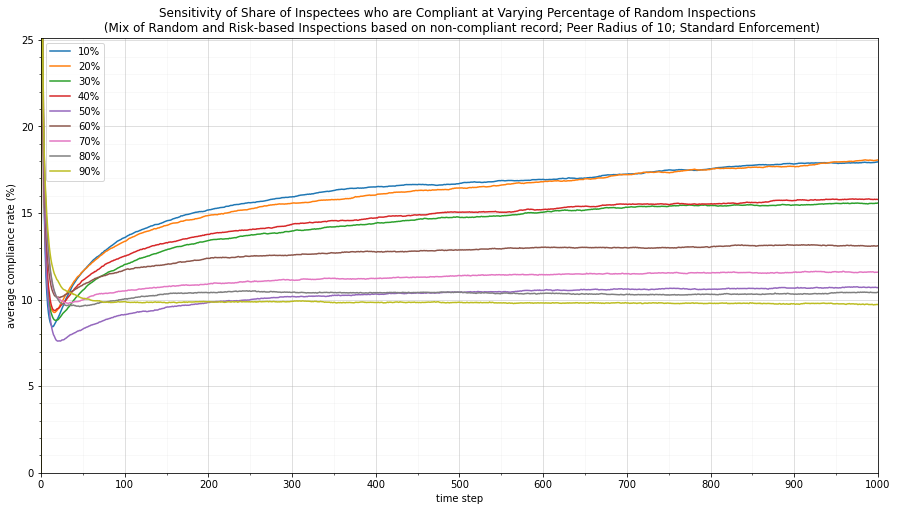

<Figure size 432x288 with 0 Axes>

In [121]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,25.1,5))
ax.set_yticks(np.arange(0,25.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_step['step'], mixnoncomp_standard_sharerandinsp_10_step['perc-compliant'], label="10%")
plt.plot(mixnoncomp_standard_sharerandinsp_20_step['step'], mixnoncomp_standard_sharerandinsp_20_step['perc-compliant'], label="20%")
plt.plot(mixnoncomp_standard_sharerandinsp_30_step['step'], mixnoncomp_standard_sharerandinsp_30_step['perc-compliant'], label="30%")
plt.plot(mixnoncomp_standard_sharerandinsp_40_step['step'], mixnoncomp_standard_sharerandinsp_40_step['perc-compliant'], label="40%")
plt.plot(mixnoncomp_standard_sharerandinsp_50_step['step'], mixnoncomp_standard_sharerandinsp_50_step['perc-compliant'], label="50%")
plt.plot(mixnoncomp_standard_sharerandinsp_60_step['step'], mixnoncomp_standard_sharerandinsp_60_step['perc-compliant'], label="60%")
plt.plot(mixnoncomp_standard_sharerandinsp_70_step['step'], mixnoncomp_standard_sharerandinsp_70_step['perc-compliant'], label="70%")
plt.plot(mixnoncomp_standard_sharerandinsp_80_step['step'], mixnoncomp_standard_sharerandinsp_80_step['perc-compliant'], label="80%")
plt.plot(mixnoncomp_standard_sharerandinsp_90_step['step'], mixnoncomp_standard_sharerandinsp_90_step['perc-compliant'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Compliant at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,25.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
#plt.legend(loc="center left", ncol = len(ax.lines),bbox_to_anchor=(.08, -.14) )
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Compliant (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

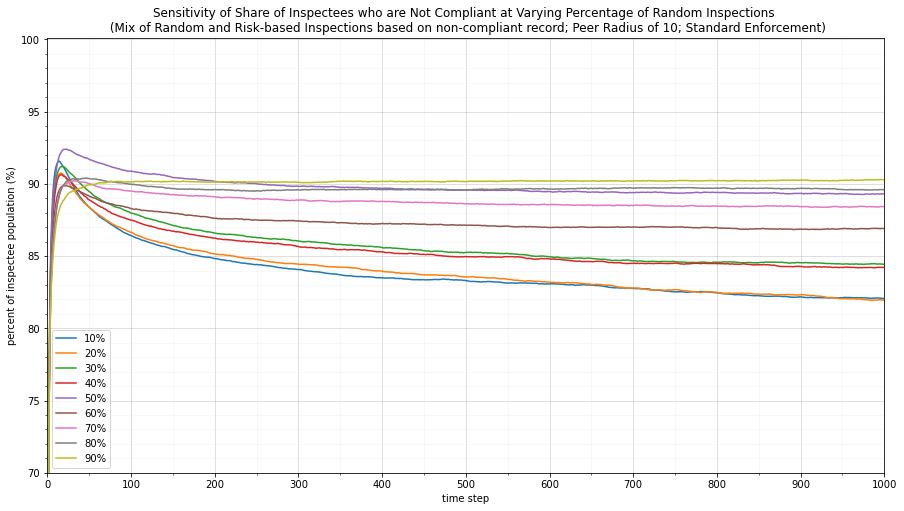

<Figure size 432x288 with 0 Axes>

In [32]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(70,100.1,5))
ax.set_yticks(np.arange(70,100.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_step['step'], mixnoncomp_standard_sharerandinsp_10_step['perc-noncompliant'], label="10%")
plt.plot(mixnoncomp_standard_sharerandinsp_20_step['step'], mixnoncomp_standard_sharerandinsp_20_step['perc-noncompliant'], label="20%")
plt.plot(mixnoncomp_standard_sharerandinsp_30_step['step'], mixnoncomp_standard_sharerandinsp_30_step['perc-noncompliant'], label="30%")
plt.plot(mixnoncomp_standard_sharerandinsp_40_step['step'], mixnoncomp_standard_sharerandinsp_40_step['perc-noncompliant'], label="40%")
plt.plot(mixnoncomp_standard_sharerandinsp_50_step['step'], mixnoncomp_standard_sharerandinsp_50_step['perc-noncompliant'], label="50%")
plt.plot(mixnoncomp_standard_sharerandinsp_60_step['step'], mixnoncomp_standard_sharerandinsp_60_step['perc-noncompliant'], label="60%")
plt.plot(mixnoncomp_standard_sharerandinsp_70_step['step'], mixnoncomp_standard_sharerandinsp_70_step['perc-noncompliant'], label="70%")
plt.plot(mixnoncomp_standard_sharerandinsp_80_step['step'], mixnoncomp_standard_sharerandinsp_80_step['perc-noncompliant'], label="80%")
plt.plot(mixnoncomp_standard_sharerandinsp_90_step['step'], mixnoncomp_standard_sharerandinsp_90_step['perc-noncompliant'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Not Compliant at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(70,100.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Not Compliant (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

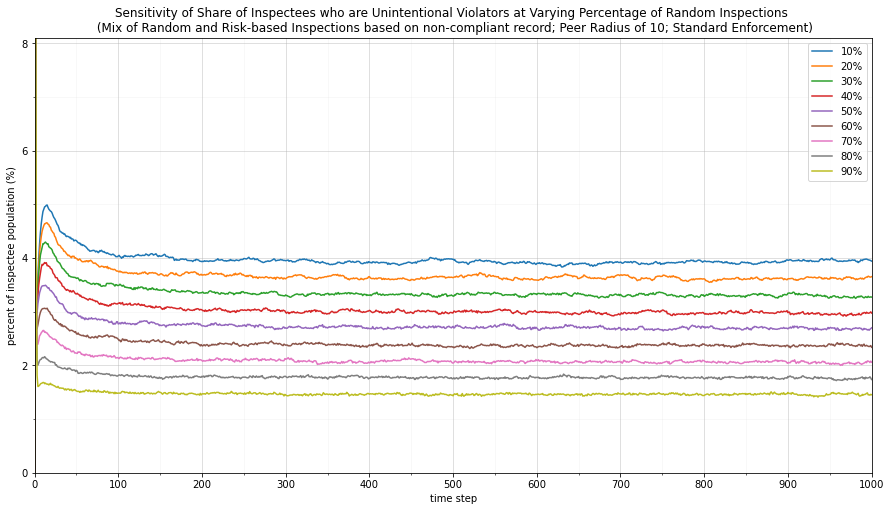

<Figure size 432x288 with 0 Axes>

In [33]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,8.1,2))
ax.set_yticks(np.arange(0,8.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_step['step'], mixnoncomp_standard_sharerandinsp_10_step['perc-unintentional'], label="10%")
plt.plot(mixnoncomp_standard_sharerandinsp_20_step['step'], mixnoncomp_standard_sharerandinsp_20_step['perc-unintentional'], label="20%")
plt.plot(mixnoncomp_standard_sharerandinsp_30_step['step'], mixnoncomp_standard_sharerandinsp_30_step['perc-unintentional'], label="30%")
plt.plot(mixnoncomp_standard_sharerandinsp_40_step['step'], mixnoncomp_standard_sharerandinsp_40_step['perc-unintentional'], label="40%")
plt.plot(mixnoncomp_standard_sharerandinsp_50_step['step'], mixnoncomp_standard_sharerandinsp_50_step['perc-unintentional'], label="50%")
plt.plot(mixnoncomp_standard_sharerandinsp_60_step['step'], mixnoncomp_standard_sharerandinsp_60_step['perc-unintentional'], label="60%")
plt.plot(mixnoncomp_standard_sharerandinsp_70_step['step'], mixnoncomp_standard_sharerandinsp_70_step['perc-unintentional'], label="70%")
plt.plot(mixnoncomp_standard_sharerandinsp_80_step['step'], mixnoncomp_standard_sharerandinsp_80_step['perc-unintentional'], label="80%")
plt.plot(mixnoncomp_standard_sharerandinsp_90_step['step'], mixnoncomp_standard_sharerandinsp_90_step['perc-unintentional'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Unintentional Violators at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(0,8.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Unintentional (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

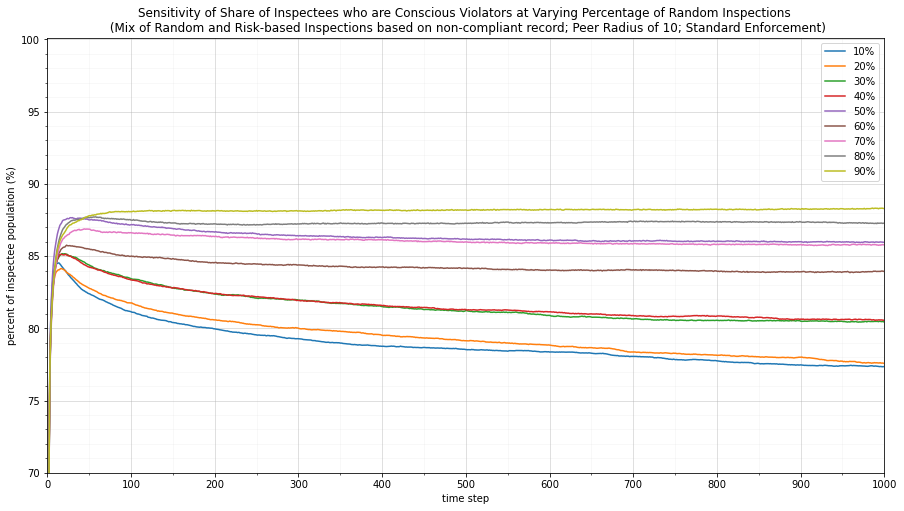

<Figure size 432x288 with 0 Axes>

In [35]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(70,100.1,5))
ax.set_yticks(np.arange(70,100.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_step['step'], mixnoncomp_standard_sharerandinsp_10_step['perc-conscious'], label="10%")
plt.plot(mixnoncomp_standard_sharerandinsp_20_step['step'], mixnoncomp_standard_sharerandinsp_20_step['perc-conscious'], label="20%")
plt.plot(mixnoncomp_standard_sharerandinsp_30_step['step'], mixnoncomp_standard_sharerandinsp_30_step['perc-conscious'], label="30%")
plt.plot(mixnoncomp_standard_sharerandinsp_40_step['step'], mixnoncomp_standard_sharerandinsp_40_step['perc-conscious'], label="40%")
plt.plot(mixnoncomp_standard_sharerandinsp_50_step['step'], mixnoncomp_standard_sharerandinsp_50_step['perc-conscious'], label="50%")
plt.plot(mixnoncomp_standard_sharerandinsp_60_step['step'], mixnoncomp_standard_sharerandinsp_60_step['perc-conscious'], label="60%")
plt.plot(mixnoncomp_standard_sharerandinsp_70_step['step'], mixnoncomp_standard_sharerandinsp_70_step['perc-conscious'], label="70%")
plt.plot(mixnoncomp_standard_sharerandinsp_80_step['step'], mixnoncomp_standard_sharerandinsp_80_step['perc-conscious'], label="80%")
plt.plot(mixnoncomp_standard_sharerandinsp_90_step['step'], mixnoncomp_standard_sharerandinsp_90_step['perc-conscious'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Conscious Violators at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(70,100.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Conscious (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

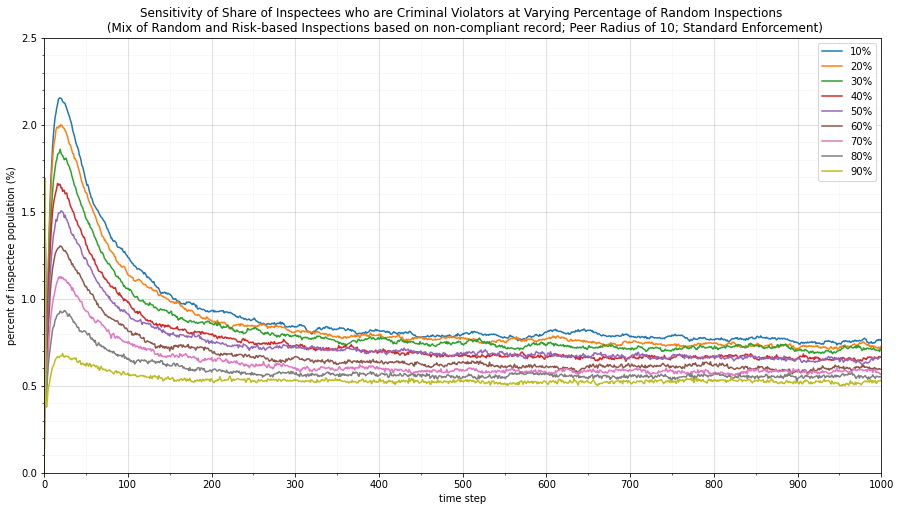

<Figure size 432x288 with 0 Axes>

In [36]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,2.6,.5))
ax.set_yticks(np.arange(0,2.6,.1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_step['step'], mixnoncomp_standard_sharerandinsp_10_step['perc-criminal'], label="10%")
plt.plot(mixnoncomp_standard_sharerandinsp_20_step['step'], mixnoncomp_standard_sharerandinsp_20_step['perc-criminal'], label="20%")
plt.plot(mixnoncomp_standard_sharerandinsp_30_step['step'], mixnoncomp_standard_sharerandinsp_30_step['perc-criminal'], label="30%")
plt.plot(mixnoncomp_standard_sharerandinsp_40_step['step'], mixnoncomp_standard_sharerandinsp_40_step['perc-criminal'], label="40%")
plt.plot(mixnoncomp_standard_sharerandinsp_50_step['step'], mixnoncomp_standard_sharerandinsp_50_step['perc-criminal'], label="50%")
plt.plot(mixnoncomp_standard_sharerandinsp_60_step['step'], mixnoncomp_standard_sharerandinsp_60_step['perc-criminal'], label="60%")
plt.plot(mixnoncomp_standard_sharerandinsp_70_step['step'], mixnoncomp_standard_sharerandinsp_70_step['perc-criminal'], label="70%")
plt.plot(mixnoncomp_standard_sharerandinsp_80_step['step'], mixnoncomp_standard_sharerandinsp_80_step['perc-criminal'], label="80%")
plt.plot(mixnoncomp_standard_sharerandinsp_90_step['step'], mixnoncomp_standard_sharerandinsp_90_step['perc-criminal'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Criminal Violators at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(0,2.5)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Criminal (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

### Responsive Enforcement

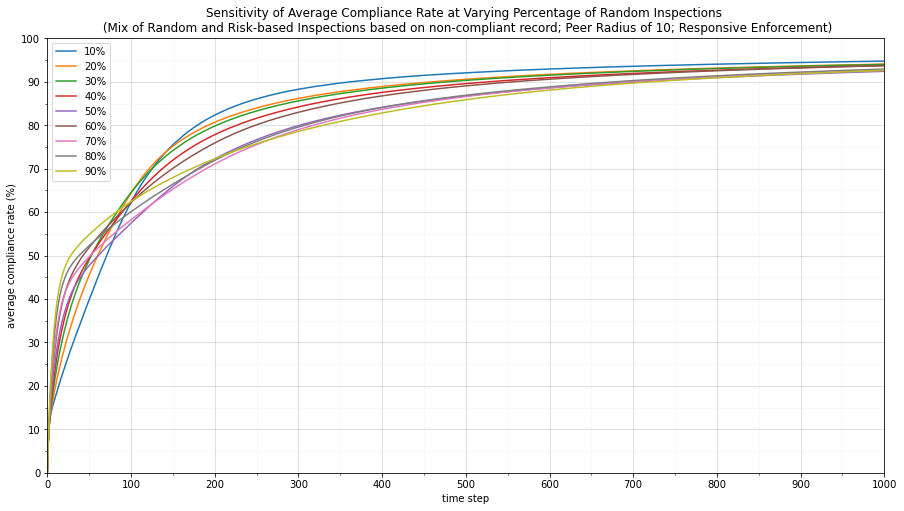

<Figure size 432x288 with 0 Axes>

In [42]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_step['step'], mixnoncomp_resp_sharerandinsp_10_step['avg-compliance-rate'], label="10%")
plt.plot(mixnoncomp_resp_sharerandinsp_20_step['step'], mixnoncomp_resp_sharerandinsp_20_step['avg-compliance-rate'], label="20%")
plt.plot(mixnoncomp_resp_sharerandinsp_30_step['step'], mixnoncomp_resp_sharerandinsp_30_step['avg-compliance-rate'], label="30%")
plt.plot(mixnoncomp_resp_sharerandinsp_40_step['step'], mixnoncomp_resp_sharerandinsp_40_step['avg-compliance-rate'], label="40%")
plt.plot(mixnoncomp_resp_sharerandinsp_50_step['step'], mixnoncomp_resp_sharerandinsp_50_step['avg-compliance-rate'], label="50%")
plt.plot(mixnoncomp_resp_sharerandinsp_60_step['step'], mixnoncomp_resp_sharerandinsp_60_step['avg-compliance-rate'], label="60%")
plt.plot(mixnoncomp_resp_sharerandinsp_70_step['step'], mixnoncomp_resp_sharerandinsp_70_step['avg-compliance-rate'], label="70%")
plt.plot(mixnoncomp_resp_sharerandinsp_80_step['step'], mixnoncomp_resp_sharerandinsp_80_step['avg-compliance-rate'], label="80%")
plt.plot(mixnoncomp_resp_sharerandinsp_90_step['step'], mixnoncomp_resp_sharerandinsp_90_step['avg-compliance-rate'], label="90%")

plt.title("Sensitivity of Average Compliance Rate at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
plt.show()
plt.savefig('Percent Random Inspections- Time vs Avg Compliance Rate (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

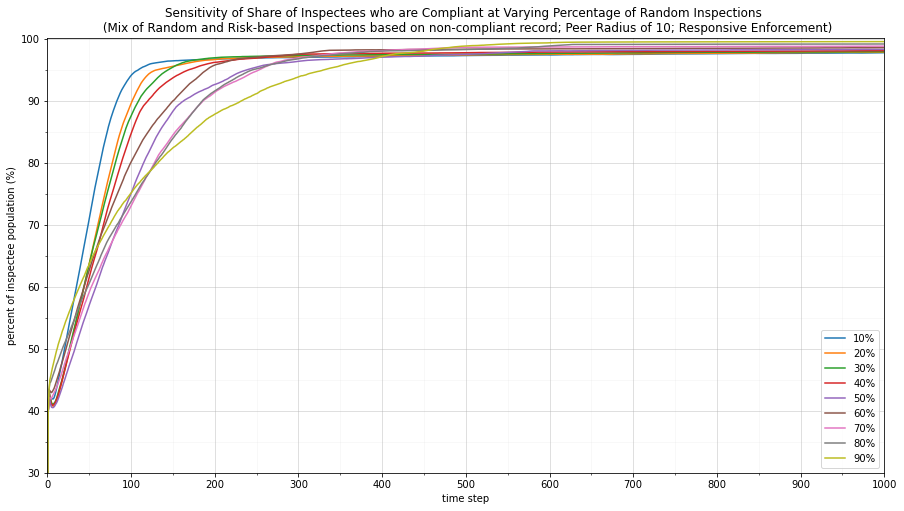

<Figure size 432x288 with 0 Axes>

In [43]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(30,100.1,10))
ax.set_yticks(np.arange(30,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_step['step'], mixnoncomp_resp_sharerandinsp_10_step['perc-compliant'], label="10%")
plt.plot(mixnoncomp_resp_sharerandinsp_20_step['step'], mixnoncomp_resp_sharerandinsp_20_step['perc-compliant'], label="20%")
plt.plot(mixnoncomp_resp_sharerandinsp_30_step['step'], mixnoncomp_resp_sharerandinsp_30_step['perc-compliant'], label="30%")
plt.plot(mixnoncomp_resp_sharerandinsp_40_step['step'], mixnoncomp_resp_sharerandinsp_40_step['perc-compliant'], label="40%")
plt.plot(mixnoncomp_resp_sharerandinsp_50_step['step'], mixnoncomp_resp_sharerandinsp_50_step['perc-compliant'], label="50%")
plt.plot(mixnoncomp_resp_sharerandinsp_60_step['step'], mixnoncomp_resp_sharerandinsp_60_step['perc-compliant'], label="60%")
plt.plot(mixnoncomp_resp_sharerandinsp_70_step['step'], mixnoncomp_resp_sharerandinsp_70_step['perc-compliant'], label="70%")
plt.plot(mixnoncomp_resp_sharerandinsp_80_step['step'], mixnoncomp_resp_sharerandinsp_80_step['perc-compliant'], label="80%")
plt.plot(mixnoncomp_resp_sharerandinsp_90_step['step'], mixnoncomp_resp_sharerandinsp_90_step['perc-compliant'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Compliant at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(30,100.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
#plt.legend(loc="center left", ncol = len(ax.lines),bbox_to_anchor=(.08, -.14) )
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Compliant (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

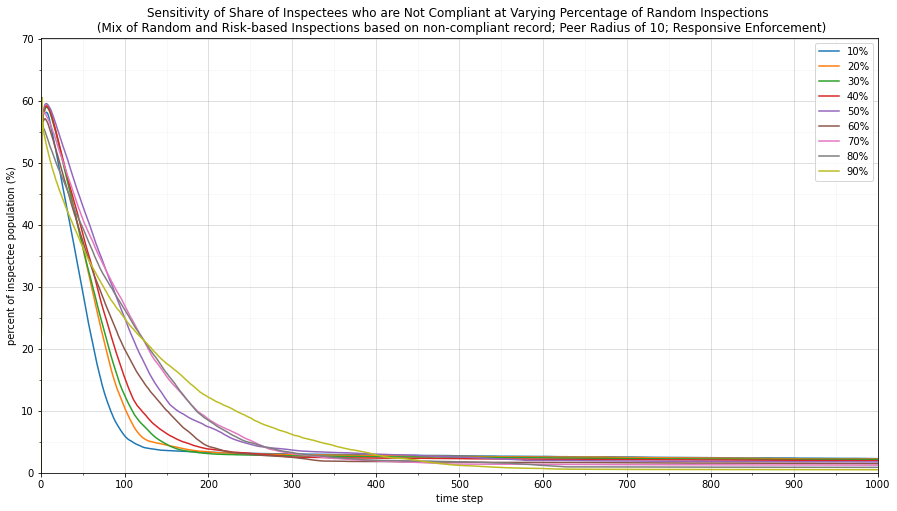

<Figure size 432x288 with 0 Axes>

In [48]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,70.1,10))
ax.set_yticks(np.arange(0,70.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_step['step'], mixnoncomp_resp_sharerandinsp_10_step['perc-noncompliant'], label="10%")
plt.plot(mixnoncomp_resp_sharerandinsp_20_step['step'], mixnoncomp_resp_sharerandinsp_20_step['perc-noncompliant'], label="20%")
plt.plot(mixnoncomp_resp_sharerandinsp_30_step['step'], mixnoncomp_resp_sharerandinsp_30_step['perc-noncompliant'], label="30%")
plt.plot(mixnoncomp_resp_sharerandinsp_40_step['step'], mixnoncomp_resp_sharerandinsp_40_step['perc-noncompliant'], label="40%")
plt.plot(mixnoncomp_resp_sharerandinsp_50_step['step'], mixnoncomp_resp_sharerandinsp_50_step['perc-noncompliant'], label="50%")
plt.plot(mixnoncomp_resp_sharerandinsp_60_step['step'], mixnoncomp_resp_sharerandinsp_60_step['perc-noncompliant'], label="60%")
plt.plot(mixnoncomp_resp_sharerandinsp_70_step['step'], mixnoncomp_resp_sharerandinsp_70_step['perc-noncompliant'], label="70%")
plt.plot(mixnoncomp_resp_sharerandinsp_80_step['step'], mixnoncomp_resp_sharerandinsp_80_step['perc-noncompliant'], label="80%")
plt.plot(mixnoncomp_resp_sharerandinsp_90_step['step'], mixnoncomp_resp_sharerandinsp_90_step['perc-noncompliant'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Not Compliant at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(0,70.1)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
#plt.legend(loc="center left", ncol = len(ax.lines),bbox_to_anchor=(.08, -.14) )
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Not Compliant (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

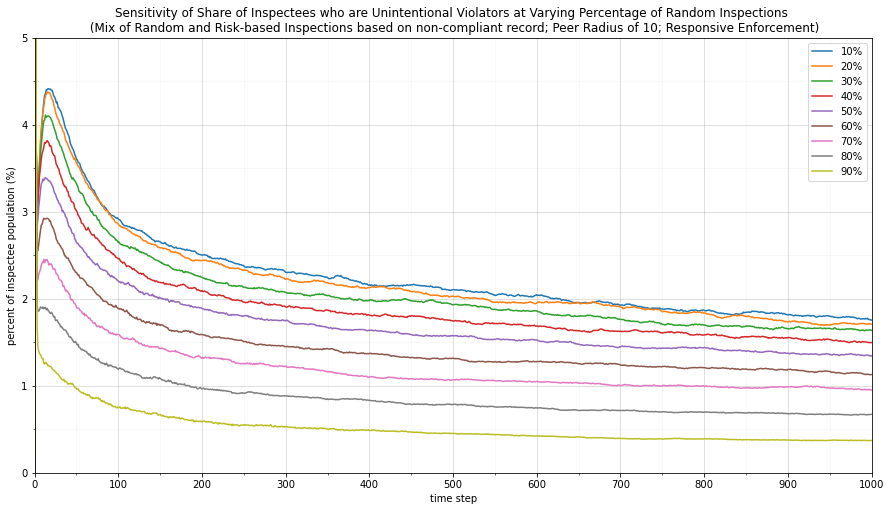

<Figure size 432x288 with 0 Axes>

In [49]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,5.01,1))
ax.set_yticks(np.arange(0,5.01,.5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_step['step'], mixnoncomp_resp_sharerandinsp_10_step['perc-unintentional'], label="10%")
plt.plot(mixnoncomp_resp_sharerandinsp_20_step['step'], mixnoncomp_resp_sharerandinsp_20_step['perc-unintentional'], label="20%")
plt.plot(mixnoncomp_resp_sharerandinsp_30_step['step'], mixnoncomp_resp_sharerandinsp_30_step['perc-unintentional'], label="30%")
plt.plot(mixnoncomp_resp_sharerandinsp_40_step['step'], mixnoncomp_resp_sharerandinsp_40_step['perc-unintentional'], label="40%")
plt.plot(mixnoncomp_resp_sharerandinsp_50_step['step'], mixnoncomp_resp_sharerandinsp_50_step['perc-unintentional'], label="50%")
plt.plot(mixnoncomp_resp_sharerandinsp_60_step['step'], mixnoncomp_resp_sharerandinsp_60_step['perc-unintentional'], label="60%")
plt.plot(mixnoncomp_resp_sharerandinsp_70_step['step'], mixnoncomp_resp_sharerandinsp_70_step['perc-unintentional'], label="70%")
plt.plot(mixnoncomp_resp_sharerandinsp_80_step['step'], mixnoncomp_resp_sharerandinsp_80_step['perc-unintentional'], label="80%")
plt.plot(mixnoncomp_resp_sharerandinsp_90_step['step'], mixnoncomp_resp_sharerandinsp_90_step['perc-unintentional'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Unintentional Violators at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(0,5)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
#plt.legend(loc="center left", ncol = len(ax.lines),bbox_to_anchor=(.08, -.14) )
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Unintentional (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

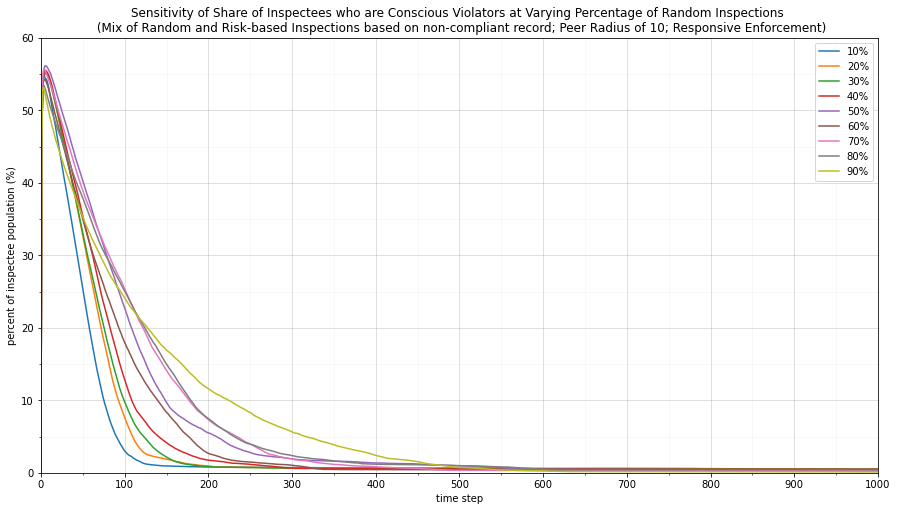

<Figure size 432x288 with 0 Axes>

In [50]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,60.01,10))
ax.set_yticks(np.arange(0,60.01,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_step['step'], mixnoncomp_resp_sharerandinsp_10_step['perc-conscious'], label="10%")
plt.plot(mixnoncomp_resp_sharerandinsp_20_step['step'], mixnoncomp_resp_sharerandinsp_20_step['perc-conscious'], label="20%")
plt.plot(mixnoncomp_resp_sharerandinsp_30_step['step'], mixnoncomp_resp_sharerandinsp_30_step['perc-conscious'], label="30%")
plt.plot(mixnoncomp_resp_sharerandinsp_40_step['step'], mixnoncomp_resp_sharerandinsp_40_step['perc-conscious'], label="40%")
plt.plot(mixnoncomp_resp_sharerandinsp_50_step['step'], mixnoncomp_resp_sharerandinsp_50_step['perc-conscious'], label="50%")
plt.plot(mixnoncomp_resp_sharerandinsp_60_step['step'], mixnoncomp_resp_sharerandinsp_60_step['perc-conscious'], label="60%")
plt.plot(mixnoncomp_resp_sharerandinsp_70_step['step'], mixnoncomp_resp_sharerandinsp_70_step['perc-conscious'], label="70%")
plt.plot(mixnoncomp_resp_sharerandinsp_80_step['step'], mixnoncomp_resp_sharerandinsp_80_step['perc-conscious'], label="80%")
plt.plot(mixnoncomp_resp_sharerandinsp_90_step['step'], mixnoncomp_resp_sharerandinsp_90_step['perc-conscious'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Conscious Violators at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(0,60.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
#plt.legend(loc="center left", ncol = len(ax.lines),bbox_to_anchor=(.08, -.14) )
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Conscious (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

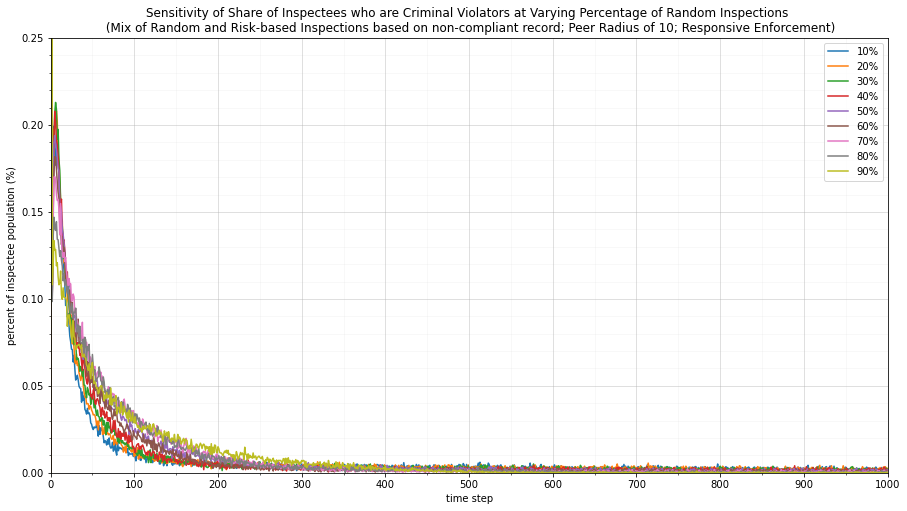

<Figure size 432x288 with 0 Axes>

In [62]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,.2501,.05))
ax.set_yticks(np.arange(0,.2501,.01), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_step['step'], mixnoncomp_resp_sharerandinsp_10_step['perc-criminal'], label="10%")
plt.plot(mixnoncomp_resp_sharerandinsp_20_step['step'], mixnoncomp_resp_sharerandinsp_20_step['perc-criminal'], label="20%")
plt.plot(mixnoncomp_resp_sharerandinsp_30_step['step'], mixnoncomp_resp_sharerandinsp_30_step['perc-criminal'], label="30%")
plt.plot(mixnoncomp_resp_sharerandinsp_40_step['step'], mixnoncomp_resp_sharerandinsp_40_step['perc-criminal'], label="40%")
plt.plot(mixnoncomp_resp_sharerandinsp_50_step['step'], mixnoncomp_resp_sharerandinsp_50_step['perc-criminal'], label="50%")
plt.plot(mixnoncomp_resp_sharerandinsp_60_step['step'], mixnoncomp_resp_sharerandinsp_60_step['perc-criminal'], label="60%")
plt.plot(mixnoncomp_resp_sharerandinsp_70_step['step'], mixnoncomp_resp_sharerandinsp_70_step['perc-criminal'], label="70%")
plt.plot(mixnoncomp_resp_sharerandinsp_80_step['step'], mixnoncomp_resp_sharerandinsp_80_step['perc-criminal'], label="80%")
plt.plot(mixnoncomp_resp_sharerandinsp_90_step['step'], mixnoncomp_resp_sharerandinsp_90_step['perc-criminal'], label="90%")

plt.title("Sensitivity of Share of Inspectees who are Criminal Violators at Varying Percentage of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectee population (%)')
plt.xlim(0,1000)
plt.ylim(0,.2501)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.grid(True)
plt.legend()
#plt.legend(loc="center left", ncol = len(ax.lines),bbox_to_anchor=(.08, -.14) )
plt.show()
plt.savefig('Percent Random Inspections- Time vs Perc Criminal (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

## Group data by run and plot results by run

In [72]:
# Create new dataframes by run_num
for i, x in mixnoncomp_standard_sharerandinsp_10.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_10_' + str(i)] = x
    
for i, x in mixnoncomp_standard_sharerandinsp_20.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_20_' + str(i)] = x

for i, x in mixnoncomp_standard_sharerandinsp_30.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_30_' + str(i)] = x

for i, x in mixnoncomp_standard_sharerandinsp_40.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_40_' + str(i)] = x

for i, x in mixnoncomp_standard_sharerandinsp_50.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_50_' + str(i)] = x
    
for i, x in mixnoncomp_standard_sharerandinsp_60.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_60_' + str(i)] = x

for i, x in mixnoncomp_standard_sharerandinsp_70.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_70_' + str(i)] = x

for i, x in mixnoncomp_standard_sharerandinsp_80.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_80_' + str(i)] = x
    
for i, x in mixnoncomp_standard_sharerandinsp_90.groupby('run_num'):
    globals()['mixnoncomp_standard_sharerandinsp_90_' + str(i)] = x

In [95]:
# Create new dataframes by run_num
for i, x in mixnoncomp_resp_sharerandinsp_10.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_10_' + str(i)] = x
    
for i, x in mixnoncomp_resp_sharerandinsp_20.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_20_' + str(i)] = x

for i, x in mixnoncomp_resp_sharerandinsp_30.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_30_' + str(i)] = x

for i, x in mixnoncomp_resp_sharerandinsp_40.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_40_' + str(i)] = x

for i, x in mixnoncomp_resp_sharerandinsp_50.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_50_' + str(i)] = x
    
for i, x in mixnoncomp_resp_sharerandinsp_60.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_60_' + str(i)] = x

for i, x in mixnoncomp_resp_sharerandinsp_70.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_70_' + str(i)] = x

for i, x in mixnoncomp_resp_sharerandinsp_80.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_80_' + str(i)] = x
    
for i, x in mixnoncomp_resp_sharerandinsp_90.groupby('run_num'):
    globals()['mixnoncomp_resp_sharerandinsp_90_' + str(i)] = x

### Standard enforcement

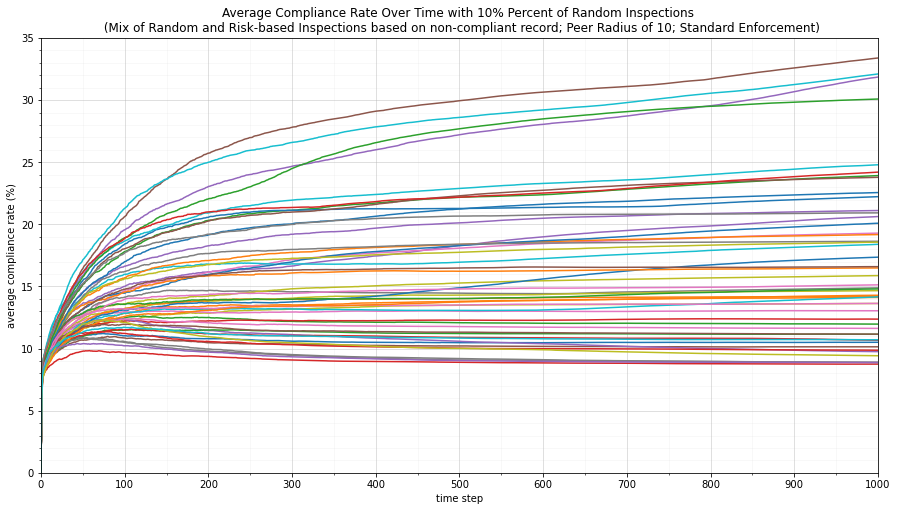

<Figure size 432x288 with 0 Axes>

In [63]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_1['step'],mixnoncomp_standard_sharerandinsp_10_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_2['step'],mixnoncomp_standard_sharerandinsp_10_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_3['step'],mixnoncomp_standard_sharerandinsp_10_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_4['step'],mixnoncomp_standard_sharerandinsp_10_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_5['step'],mixnoncomp_standard_sharerandinsp_10_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_6['step'],mixnoncomp_standard_sharerandinsp_10_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_7['step'],mixnoncomp_standard_sharerandinsp_10_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_8['step'],mixnoncomp_standard_sharerandinsp_10_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_9['step'],mixnoncomp_standard_sharerandinsp_10_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_10['step'],mixnoncomp_standard_sharerandinsp_10_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_11['step'],mixnoncomp_standard_sharerandinsp_10_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_12['step'],mixnoncomp_standard_sharerandinsp_10_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_13['step'],mixnoncomp_standard_sharerandinsp_10_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_14['step'],mixnoncomp_standard_sharerandinsp_10_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_15['step'],mixnoncomp_standard_sharerandinsp_10_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_16['step'],mixnoncomp_standard_sharerandinsp_10_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_17['step'],mixnoncomp_standard_sharerandinsp_10_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_18['step'],mixnoncomp_standard_sharerandinsp_10_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_19['step'],mixnoncomp_standard_sharerandinsp_10_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_20['step'],mixnoncomp_standard_sharerandinsp_10_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_21['step'],mixnoncomp_standard_sharerandinsp_10_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_22['step'],mixnoncomp_standard_sharerandinsp_10_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_23['step'],mixnoncomp_standard_sharerandinsp_10_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_24['step'],mixnoncomp_standard_sharerandinsp_10_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_25['step'],mixnoncomp_standard_sharerandinsp_10_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_26['step'],mixnoncomp_standard_sharerandinsp_10_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_27['step'],mixnoncomp_standard_sharerandinsp_10_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_28['step'],mixnoncomp_standard_sharerandinsp_10_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_29['step'],mixnoncomp_standard_sharerandinsp_10_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_30['step'],mixnoncomp_standard_sharerandinsp_10_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_31['step'],mixnoncomp_standard_sharerandinsp_10_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_32['step'],mixnoncomp_standard_sharerandinsp_10_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_33['step'],mixnoncomp_standard_sharerandinsp_10_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_34['step'],mixnoncomp_standard_sharerandinsp_10_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_35['step'],mixnoncomp_standard_sharerandinsp_10_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_36['step'],mixnoncomp_standard_sharerandinsp_10_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_37['step'],mixnoncomp_standard_sharerandinsp_10_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_38['step'],mixnoncomp_standard_sharerandinsp_10_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_39['step'],mixnoncomp_standard_sharerandinsp_10_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_40['step'],mixnoncomp_standard_sharerandinsp_10_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_41['step'],mixnoncomp_standard_sharerandinsp_10_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_42['step'],mixnoncomp_standard_sharerandinsp_10_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_43['step'],mixnoncomp_standard_sharerandinsp_10_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_44['step'],mixnoncomp_standard_sharerandinsp_10_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_45['step'],mixnoncomp_standard_sharerandinsp_10_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_46['step'],mixnoncomp_standard_sharerandinsp_10_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_47['step'],mixnoncomp_standard_sharerandinsp_10_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_48['step'],mixnoncomp_standard_sharerandinsp_10_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_49['step'],mixnoncomp_standard_sharerandinsp_10_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_50['step'],mixnoncomp_standard_sharerandinsp_10_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 10% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections10- Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

In [ ]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_20_1['step'],mixnoncomp_standard_sharerandinsp_20_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_2['step'],mixnoncomp_standard_sharerandinsp_20_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_3['step'],mixnoncomp_standard_sharerandinsp_20_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_4['step'],mixnoncomp_standard_sharerandinsp_20_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_5['step'],mixnoncomp_standard_sharerandinsp_20_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_6['step'],mixnoncomp_standard_sharerandinsp_20_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_7['step'],mixnoncomp_standard_sharerandinsp_20_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_8['step'],mixnoncomp_standard_sharerandinsp_20_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_9['step'],mixnoncomp_standard_sharerandinsp_20_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_10['step'],mixnoncomp_standard_sharerandinsp_20_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_11['step'],mixnoncomp_standard_sharerandinsp_20_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_12['step'],mixnoncomp_standard_sharerandinsp_20_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_13['step'],mixnoncomp_standard_sharerandinsp_20_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_14['step'],mixnoncomp_standard_sharerandinsp_20_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_15['step'],mixnoncomp_standard_sharerandinsp_20_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_16['step'],mixnoncomp_standard_sharerandinsp_20_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_17['step'],mixnoncomp_standard_sharerandinsp_20_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_18['step'],mixnoncomp_standard_sharerandinsp_20_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_19['step'],mixnoncomp_standard_sharerandinsp_20_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_20['step'],mixnoncomp_standard_sharerandinsp_20_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_21['step'],mixnoncomp_standard_sharerandinsp_20_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_22['step'],mixnoncomp_standard_sharerandinsp_20_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_23['step'],mixnoncomp_standard_sharerandinsp_20_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_24['step'],mixnoncomp_standard_sharerandinsp_20_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_25['step'],mixnoncomp_standard_sharerandinsp_20_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_26['step'],mixnoncomp_standard_sharerandinsp_20_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_27['step'],mixnoncomp_standard_sharerandinsp_20_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_28['step'],mixnoncomp_standard_sharerandinsp_20_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_29['step'],mixnoncomp_standard_sharerandinsp_20_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_30['step'],mixnoncomp_standard_sharerandinsp_20_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_31['step'],mixnoncomp_standard_sharerandinsp_20_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_32['step'],mixnoncomp_standard_sharerandinsp_20_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_33['step'],mixnoncomp_standard_sharerandinsp_20_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_34['step'],mixnoncomp_standard_sharerandinsp_20_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_35['step'],mixnoncomp_standard_sharerandinsp_20_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_36['step'],mixnoncomp_standard_sharerandinsp_20_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_37['step'],mixnoncomp_standard_sharerandinsp_20_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_38['step'],mixnoncomp_standard_sharerandinsp_20_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_39['step'],mixnoncomp_standard_sharerandinsp_20_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_40['step'],mixnoncomp_standard_sharerandinsp_20_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_41['step'],mixnoncomp_standard_sharerandinsp_20_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_42['step'],mixnoncomp_standard_sharerandinsp_20_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_43['step'],mixnoncomp_standard_sharerandinsp_20_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_44['step'],mixnoncomp_standard_sharerandinsp_20_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_45['step'],mixnoncomp_standard_sharerandinsp_20_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_46['step'],mixnoncomp_standard_sharerandinsp_20_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_47['step'],mixnoncomp_standard_sharerandinsp_20_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_48['step'],mixnoncomp_standard_sharerandinsp_20_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_49['step'],mixnoncomp_standard_sharerandinsp_20_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_50['step'],mixnoncomp_standard_sharerandinsp_20_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 20% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections20_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

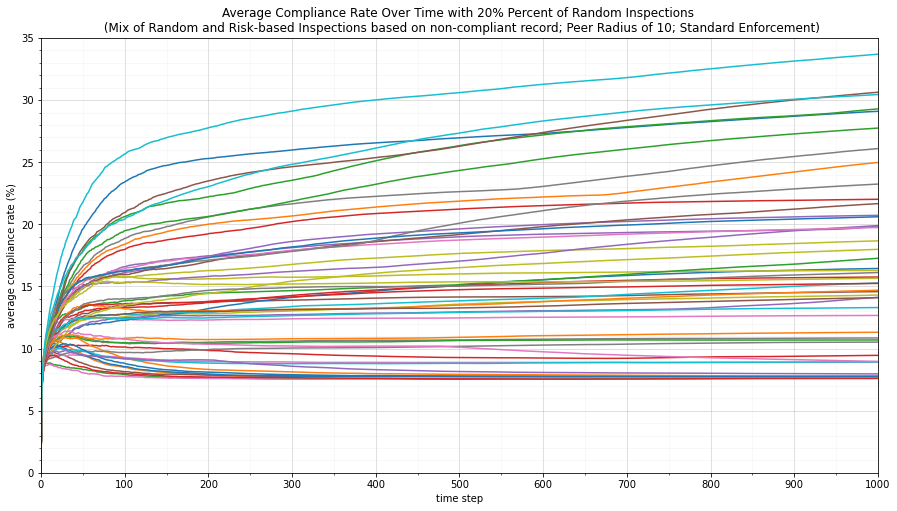

<Figure size 432x288 with 0 Axes>

In [64]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_20_1['step'],mixnoncomp_standard_sharerandinsp_20_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_2['step'],mixnoncomp_standard_sharerandinsp_20_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_3['step'],mixnoncomp_standard_sharerandinsp_20_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_4['step'],mixnoncomp_standard_sharerandinsp_20_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_5['step'],mixnoncomp_standard_sharerandinsp_20_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_6['step'],mixnoncomp_standard_sharerandinsp_20_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_7['step'],mixnoncomp_standard_sharerandinsp_20_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_8['step'],mixnoncomp_standard_sharerandinsp_20_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_9['step'],mixnoncomp_standard_sharerandinsp_20_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_10['step'],mixnoncomp_standard_sharerandinsp_20_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_11['step'],mixnoncomp_standard_sharerandinsp_20_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_12['step'],mixnoncomp_standard_sharerandinsp_20_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_13['step'],mixnoncomp_standard_sharerandinsp_20_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_14['step'],mixnoncomp_standard_sharerandinsp_20_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_15['step'],mixnoncomp_standard_sharerandinsp_20_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_16['step'],mixnoncomp_standard_sharerandinsp_20_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_17['step'],mixnoncomp_standard_sharerandinsp_20_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_18['step'],mixnoncomp_standard_sharerandinsp_20_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_19['step'],mixnoncomp_standard_sharerandinsp_20_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_20['step'],mixnoncomp_standard_sharerandinsp_20_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_21['step'],mixnoncomp_standard_sharerandinsp_20_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_22['step'],mixnoncomp_standard_sharerandinsp_20_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_23['step'],mixnoncomp_standard_sharerandinsp_20_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_24['step'],mixnoncomp_standard_sharerandinsp_20_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_25['step'],mixnoncomp_standard_sharerandinsp_20_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_26['step'],mixnoncomp_standard_sharerandinsp_20_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_27['step'],mixnoncomp_standard_sharerandinsp_20_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_28['step'],mixnoncomp_standard_sharerandinsp_20_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_29['step'],mixnoncomp_standard_sharerandinsp_20_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_30['step'],mixnoncomp_standard_sharerandinsp_20_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_31['step'],mixnoncomp_standard_sharerandinsp_20_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_32['step'],mixnoncomp_standard_sharerandinsp_20_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_33['step'],mixnoncomp_standard_sharerandinsp_20_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_34['step'],mixnoncomp_standard_sharerandinsp_20_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_35['step'],mixnoncomp_standard_sharerandinsp_20_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_36['step'],mixnoncomp_standard_sharerandinsp_20_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_37['step'],mixnoncomp_standard_sharerandinsp_20_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_38['step'],mixnoncomp_standard_sharerandinsp_20_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_39['step'],mixnoncomp_standard_sharerandinsp_20_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_40['step'],mixnoncomp_standard_sharerandinsp_20_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_41['step'],mixnoncomp_standard_sharerandinsp_20_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_42['step'],mixnoncomp_standard_sharerandinsp_20_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_43['step'],mixnoncomp_standard_sharerandinsp_20_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_44['step'],mixnoncomp_standard_sharerandinsp_20_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_45['step'],mixnoncomp_standard_sharerandinsp_20_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_46['step'],mixnoncomp_standard_sharerandinsp_20_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_47['step'],mixnoncomp_standard_sharerandinsp_20_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_48['step'],mixnoncomp_standard_sharerandinsp_20_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_49['step'],mixnoncomp_standard_sharerandinsp_20_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_50['step'],mixnoncomp_standard_sharerandinsp_20_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 20% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections20_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

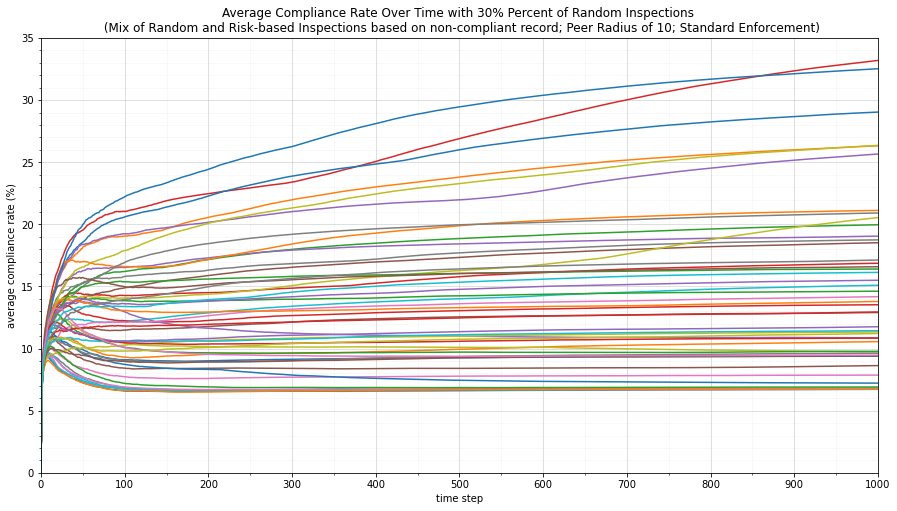

<Figure size 432x288 with 0 Axes>

In [65]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_30_1['step'],mixnoncomp_standard_sharerandinsp_30_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_2['step'],mixnoncomp_standard_sharerandinsp_30_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_3['step'],mixnoncomp_standard_sharerandinsp_30_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_4['step'],mixnoncomp_standard_sharerandinsp_30_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_5['step'],mixnoncomp_standard_sharerandinsp_30_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_6['step'],mixnoncomp_standard_sharerandinsp_30_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_7['step'],mixnoncomp_standard_sharerandinsp_30_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_8['step'],mixnoncomp_standard_sharerandinsp_30_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_9['step'],mixnoncomp_standard_sharerandinsp_30_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_10['step'],mixnoncomp_standard_sharerandinsp_30_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_11['step'],mixnoncomp_standard_sharerandinsp_30_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_12['step'],mixnoncomp_standard_sharerandinsp_30_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_13['step'],mixnoncomp_standard_sharerandinsp_30_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_14['step'],mixnoncomp_standard_sharerandinsp_30_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_15['step'],mixnoncomp_standard_sharerandinsp_30_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_16['step'],mixnoncomp_standard_sharerandinsp_30_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_17['step'],mixnoncomp_standard_sharerandinsp_30_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_18['step'],mixnoncomp_standard_sharerandinsp_30_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_19['step'],mixnoncomp_standard_sharerandinsp_30_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_20['step'],mixnoncomp_standard_sharerandinsp_30_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_21['step'],mixnoncomp_standard_sharerandinsp_30_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_22['step'],mixnoncomp_standard_sharerandinsp_30_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_23['step'],mixnoncomp_standard_sharerandinsp_30_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_24['step'],mixnoncomp_standard_sharerandinsp_30_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_25['step'],mixnoncomp_standard_sharerandinsp_30_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_26['step'],mixnoncomp_standard_sharerandinsp_30_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_27['step'],mixnoncomp_standard_sharerandinsp_30_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_28['step'],mixnoncomp_standard_sharerandinsp_30_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_29['step'],mixnoncomp_standard_sharerandinsp_30_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_30['step'],mixnoncomp_standard_sharerandinsp_30_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_31['step'],mixnoncomp_standard_sharerandinsp_30_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_32['step'],mixnoncomp_standard_sharerandinsp_30_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_33['step'],mixnoncomp_standard_sharerandinsp_30_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_34['step'],mixnoncomp_standard_sharerandinsp_30_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_35['step'],mixnoncomp_standard_sharerandinsp_30_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_36['step'],mixnoncomp_standard_sharerandinsp_30_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_37['step'],mixnoncomp_standard_sharerandinsp_30_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_38['step'],mixnoncomp_standard_sharerandinsp_30_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_39['step'],mixnoncomp_standard_sharerandinsp_30_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_40['step'],mixnoncomp_standard_sharerandinsp_30_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_41['step'],mixnoncomp_standard_sharerandinsp_30_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_42['step'],mixnoncomp_standard_sharerandinsp_30_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_43['step'],mixnoncomp_standard_sharerandinsp_30_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_44['step'],mixnoncomp_standard_sharerandinsp_30_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_45['step'],mixnoncomp_standard_sharerandinsp_30_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_46['step'],mixnoncomp_standard_sharerandinsp_30_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_47['step'],mixnoncomp_standard_sharerandinsp_30_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_48['step'],mixnoncomp_standard_sharerandinsp_30_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_49['step'],mixnoncomp_standard_sharerandinsp_30_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_50['step'],mixnoncomp_standard_sharerandinsp_30_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 30% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections30_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

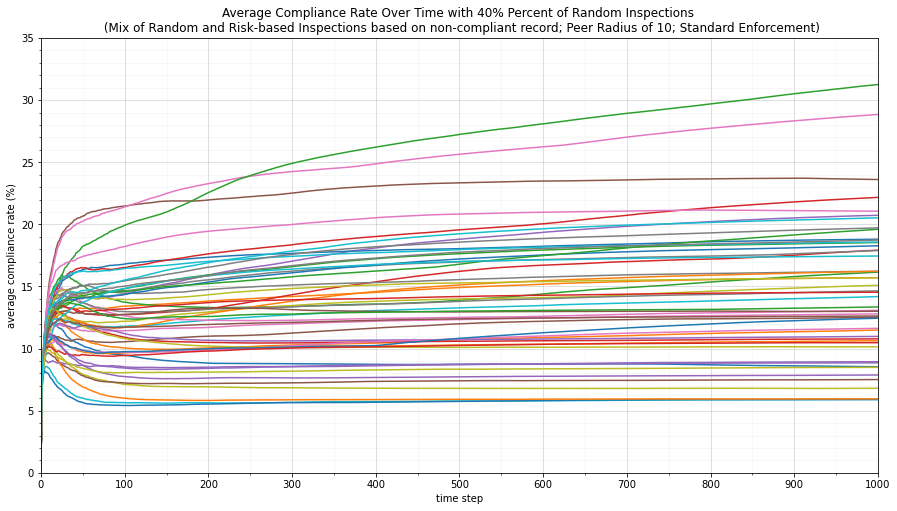

<Figure size 432x288 with 0 Axes>

In [66]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_40_1['step'],mixnoncomp_standard_sharerandinsp_40_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_2['step'],mixnoncomp_standard_sharerandinsp_40_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_3['step'],mixnoncomp_standard_sharerandinsp_40_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_4['step'],mixnoncomp_standard_sharerandinsp_40_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_5['step'],mixnoncomp_standard_sharerandinsp_40_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_6['step'],mixnoncomp_standard_sharerandinsp_40_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_7['step'],mixnoncomp_standard_sharerandinsp_40_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_8['step'],mixnoncomp_standard_sharerandinsp_40_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_9['step'],mixnoncomp_standard_sharerandinsp_40_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_10['step'],mixnoncomp_standard_sharerandinsp_40_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_11['step'],mixnoncomp_standard_sharerandinsp_40_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_12['step'],mixnoncomp_standard_sharerandinsp_40_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_13['step'],mixnoncomp_standard_sharerandinsp_40_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_14['step'],mixnoncomp_standard_sharerandinsp_40_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_15['step'],mixnoncomp_standard_sharerandinsp_40_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_16['step'],mixnoncomp_standard_sharerandinsp_40_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_17['step'],mixnoncomp_standard_sharerandinsp_40_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_18['step'],mixnoncomp_standard_sharerandinsp_40_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_19['step'],mixnoncomp_standard_sharerandinsp_40_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_20['step'],mixnoncomp_standard_sharerandinsp_40_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_21['step'],mixnoncomp_standard_sharerandinsp_40_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_22['step'],mixnoncomp_standard_sharerandinsp_40_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_23['step'],mixnoncomp_standard_sharerandinsp_40_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_24['step'],mixnoncomp_standard_sharerandinsp_40_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_25['step'],mixnoncomp_standard_sharerandinsp_40_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_26['step'],mixnoncomp_standard_sharerandinsp_40_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_27['step'],mixnoncomp_standard_sharerandinsp_40_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_28['step'],mixnoncomp_standard_sharerandinsp_40_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_29['step'],mixnoncomp_standard_sharerandinsp_40_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_30['step'],mixnoncomp_standard_sharerandinsp_40_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_31['step'],mixnoncomp_standard_sharerandinsp_40_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_32['step'],mixnoncomp_standard_sharerandinsp_40_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_33['step'],mixnoncomp_standard_sharerandinsp_40_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_34['step'],mixnoncomp_standard_sharerandinsp_40_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_35['step'],mixnoncomp_standard_sharerandinsp_40_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_36['step'],mixnoncomp_standard_sharerandinsp_40_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_37['step'],mixnoncomp_standard_sharerandinsp_40_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_38['step'],mixnoncomp_standard_sharerandinsp_40_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_39['step'],mixnoncomp_standard_sharerandinsp_40_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_40['step'],mixnoncomp_standard_sharerandinsp_40_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_41['step'],mixnoncomp_standard_sharerandinsp_40_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_42['step'],mixnoncomp_standard_sharerandinsp_40_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_43['step'],mixnoncomp_standard_sharerandinsp_40_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_44['step'],mixnoncomp_standard_sharerandinsp_40_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_45['step'],mixnoncomp_standard_sharerandinsp_40_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_46['step'],mixnoncomp_standard_sharerandinsp_40_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_47['step'],mixnoncomp_standard_sharerandinsp_40_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_48['step'],mixnoncomp_standard_sharerandinsp_40_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_49['step'],mixnoncomp_standard_sharerandinsp_40_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_50['step'],mixnoncomp_standard_sharerandinsp_40_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 40% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections40_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

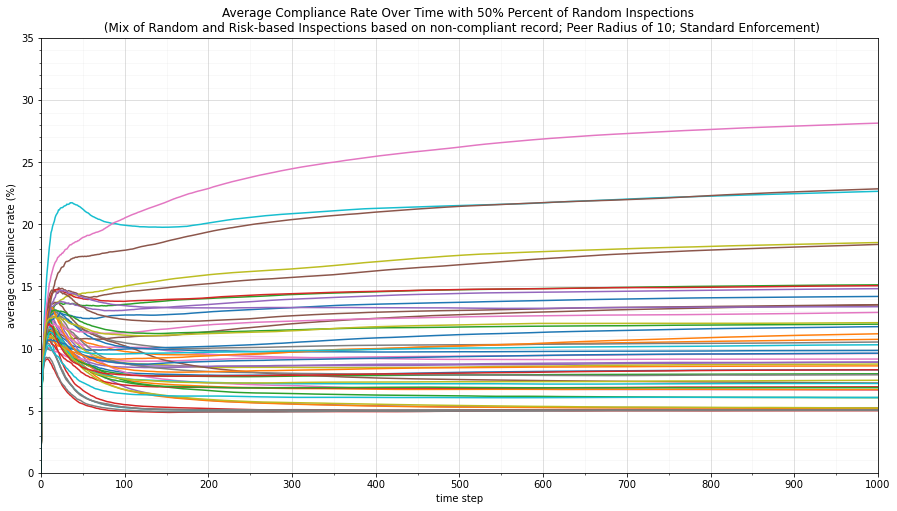

<Figure size 432x288 with 0 Axes>

In [67]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_50_1['step'],mixnoncomp_standard_sharerandinsp_50_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_2['step'],mixnoncomp_standard_sharerandinsp_50_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_3['step'],mixnoncomp_standard_sharerandinsp_50_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_4['step'],mixnoncomp_standard_sharerandinsp_50_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_5['step'],mixnoncomp_standard_sharerandinsp_50_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_6['step'],mixnoncomp_standard_sharerandinsp_50_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_7['step'],mixnoncomp_standard_sharerandinsp_50_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_8['step'],mixnoncomp_standard_sharerandinsp_50_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_9['step'],mixnoncomp_standard_sharerandinsp_50_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_10['step'],mixnoncomp_standard_sharerandinsp_50_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_11['step'],mixnoncomp_standard_sharerandinsp_50_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_12['step'],mixnoncomp_standard_sharerandinsp_50_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_13['step'],mixnoncomp_standard_sharerandinsp_50_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_14['step'],mixnoncomp_standard_sharerandinsp_50_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_15['step'],mixnoncomp_standard_sharerandinsp_50_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_16['step'],mixnoncomp_standard_sharerandinsp_50_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_17['step'],mixnoncomp_standard_sharerandinsp_50_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_18['step'],mixnoncomp_standard_sharerandinsp_50_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_19['step'],mixnoncomp_standard_sharerandinsp_50_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_20['step'],mixnoncomp_standard_sharerandinsp_50_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_21['step'],mixnoncomp_standard_sharerandinsp_50_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_22['step'],mixnoncomp_standard_sharerandinsp_50_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_23['step'],mixnoncomp_standard_sharerandinsp_50_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_24['step'],mixnoncomp_standard_sharerandinsp_50_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_25['step'],mixnoncomp_standard_sharerandinsp_50_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_26['step'],mixnoncomp_standard_sharerandinsp_50_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_27['step'],mixnoncomp_standard_sharerandinsp_50_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_28['step'],mixnoncomp_standard_sharerandinsp_50_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_29['step'],mixnoncomp_standard_sharerandinsp_50_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_30['step'],mixnoncomp_standard_sharerandinsp_50_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_31['step'],mixnoncomp_standard_sharerandinsp_50_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_32['step'],mixnoncomp_standard_sharerandinsp_50_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_33['step'],mixnoncomp_standard_sharerandinsp_50_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_34['step'],mixnoncomp_standard_sharerandinsp_50_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_35['step'],mixnoncomp_standard_sharerandinsp_50_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_36['step'],mixnoncomp_standard_sharerandinsp_50_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_37['step'],mixnoncomp_standard_sharerandinsp_50_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_38['step'],mixnoncomp_standard_sharerandinsp_50_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_39['step'],mixnoncomp_standard_sharerandinsp_50_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_40['step'],mixnoncomp_standard_sharerandinsp_50_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_41['step'],mixnoncomp_standard_sharerandinsp_50_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_42['step'],mixnoncomp_standard_sharerandinsp_50_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_43['step'],mixnoncomp_standard_sharerandinsp_50_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_44['step'],mixnoncomp_standard_sharerandinsp_50_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_45['step'],mixnoncomp_standard_sharerandinsp_50_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_46['step'],mixnoncomp_standard_sharerandinsp_50_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_47['step'],mixnoncomp_standard_sharerandinsp_50_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_48['step'],mixnoncomp_standard_sharerandinsp_50_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_49['step'],mixnoncomp_standard_sharerandinsp_50_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_50['step'],mixnoncomp_standard_sharerandinsp_50_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 50% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections50_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

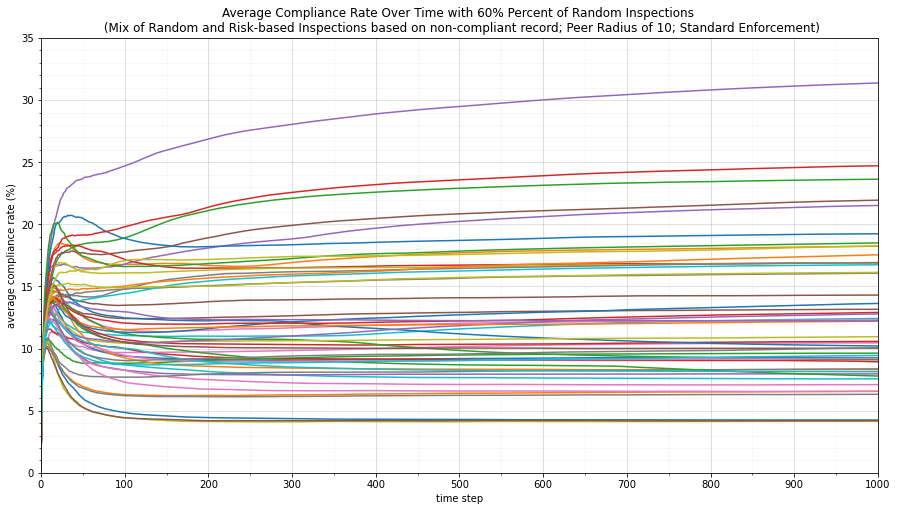

<Figure size 432x288 with 0 Axes>

In [69]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_60_1['step'],mixnoncomp_standard_sharerandinsp_60_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_2['step'],mixnoncomp_standard_sharerandinsp_60_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_3['step'],mixnoncomp_standard_sharerandinsp_60_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_4['step'],mixnoncomp_standard_sharerandinsp_60_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_5['step'],mixnoncomp_standard_sharerandinsp_60_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_6['step'],mixnoncomp_standard_sharerandinsp_60_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_7['step'],mixnoncomp_standard_sharerandinsp_60_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_8['step'],mixnoncomp_standard_sharerandinsp_60_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_9['step'],mixnoncomp_standard_sharerandinsp_60_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_10['step'],mixnoncomp_standard_sharerandinsp_60_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_11['step'],mixnoncomp_standard_sharerandinsp_60_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_12['step'],mixnoncomp_standard_sharerandinsp_60_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_13['step'],mixnoncomp_standard_sharerandinsp_60_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_14['step'],mixnoncomp_standard_sharerandinsp_60_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_15['step'],mixnoncomp_standard_sharerandinsp_60_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_16['step'],mixnoncomp_standard_sharerandinsp_60_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_17['step'],mixnoncomp_standard_sharerandinsp_60_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_18['step'],mixnoncomp_standard_sharerandinsp_60_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_19['step'],mixnoncomp_standard_sharerandinsp_60_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_20['step'],mixnoncomp_standard_sharerandinsp_60_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_21['step'],mixnoncomp_standard_sharerandinsp_60_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_22['step'],mixnoncomp_standard_sharerandinsp_60_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_23['step'],mixnoncomp_standard_sharerandinsp_60_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_24['step'],mixnoncomp_standard_sharerandinsp_60_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_25['step'],mixnoncomp_standard_sharerandinsp_60_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_26['step'],mixnoncomp_standard_sharerandinsp_60_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_27['step'],mixnoncomp_standard_sharerandinsp_60_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_28['step'],mixnoncomp_standard_sharerandinsp_60_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_29['step'],mixnoncomp_standard_sharerandinsp_60_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_30['step'],mixnoncomp_standard_sharerandinsp_60_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_31['step'],mixnoncomp_standard_sharerandinsp_60_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_32['step'],mixnoncomp_standard_sharerandinsp_60_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_33['step'],mixnoncomp_standard_sharerandinsp_60_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_34['step'],mixnoncomp_standard_sharerandinsp_60_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_35['step'],mixnoncomp_standard_sharerandinsp_60_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_36['step'],mixnoncomp_standard_sharerandinsp_60_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_37['step'],mixnoncomp_standard_sharerandinsp_60_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_38['step'],mixnoncomp_standard_sharerandinsp_60_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_39['step'],mixnoncomp_standard_sharerandinsp_60_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_40['step'],mixnoncomp_standard_sharerandinsp_60_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_41['step'],mixnoncomp_standard_sharerandinsp_60_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_42['step'],mixnoncomp_standard_sharerandinsp_60_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_43['step'],mixnoncomp_standard_sharerandinsp_60_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_44['step'],mixnoncomp_standard_sharerandinsp_60_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_45['step'],mixnoncomp_standard_sharerandinsp_60_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_46['step'],mixnoncomp_standard_sharerandinsp_60_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_47['step'],mixnoncomp_standard_sharerandinsp_60_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_48['step'],mixnoncomp_standard_sharerandinsp_60_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_49['step'],mixnoncomp_standard_sharerandinsp_60_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_50['step'],mixnoncomp_standard_sharerandinsp_60_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 60% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections60_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

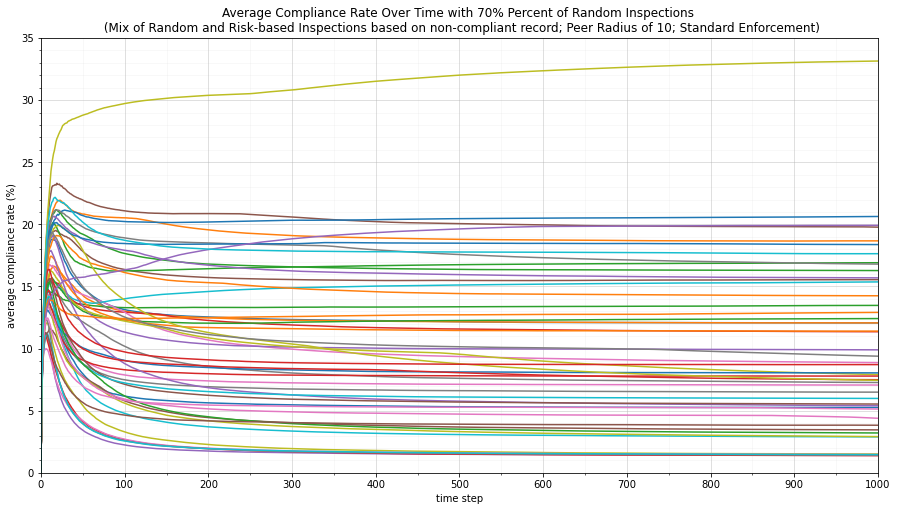

<Figure size 432x288 with 0 Axes>

In [70]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_70_1['step'],mixnoncomp_standard_sharerandinsp_70_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_2['step'],mixnoncomp_standard_sharerandinsp_70_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_3['step'],mixnoncomp_standard_sharerandinsp_70_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_4['step'],mixnoncomp_standard_sharerandinsp_70_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_5['step'],mixnoncomp_standard_sharerandinsp_70_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_6['step'],mixnoncomp_standard_sharerandinsp_70_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_7['step'],mixnoncomp_standard_sharerandinsp_70_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_8['step'],mixnoncomp_standard_sharerandinsp_70_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_9['step'],mixnoncomp_standard_sharerandinsp_70_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_10['step'],mixnoncomp_standard_sharerandinsp_70_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_11['step'],mixnoncomp_standard_sharerandinsp_70_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_12['step'],mixnoncomp_standard_sharerandinsp_70_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_13['step'],mixnoncomp_standard_sharerandinsp_70_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_14['step'],mixnoncomp_standard_sharerandinsp_70_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_15['step'],mixnoncomp_standard_sharerandinsp_70_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_16['step'],mixnoncomp_standard_sharerandinsp_70_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_17['step'],mixnoncomp_standard_sharerandinsp_70_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_18['step'],mixnoncomp_standard_sharerandinsp_70_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_19['step'],mixnoncomp_standard_sharerandinsp_70_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_20['step'],mixnoncomp_standard_sharerandinsp_70_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_21['step'],mixnoncomp_standard_sharerandinsp_70_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_22['step'],mixnoncomp_standard_sharerandinsp_70_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_23['step'],mixnoncomp_standard_sharerandinsp_70_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_24['step'],mixnoncomp_standard_sharerandinsp_70_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_25['step'],mixnoncomp_standard_sharerandinsp_70_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_26['step'],mixnoncomp_standard_sharerandinsp_70_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_27['step'],mixnoncomp_standard_sharerandinsp_70_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_28['step'],mixnoncomp_standard_sharerandinsp_70_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_29['step'],mixnoncomp_standard_sharerandinsp_70_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_30['step'],mixnoncomp_standard_sharerandinsp_70_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_31['step'],mixnoncomp_standard_sharerandinsp_70_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_32['step'],mixnoncomp_standard_sharerandinsp_70_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_33['step'],mixnoncomp_standard_sharerandinsp_70_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_34['step'],mixnoncomp_standard_sharerandinsp_70_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_35['step'],mixnoncomp_standard_sharerandinsp_70_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_36['step'],mixnoncomp_standard_sharerandinsp_70_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_37['step'],mixnoncomp_standard_sharerandinsp_70_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_38['step'],mixnoncomp_standard_sharerandinsp_70_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_39['step'],mixnoncomp_standard_sharerandinsp_70_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_40['step'],mixnoncomp_standard_sharerandinsp_70_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_41['step'],mixnoncomp_standard_sharerandinsp_70_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_42['step'],mixnoncomp_standard_sharerandinsp_70_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_43['step'],mixnoncomp_standard_sharerandinsp_70_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_44['step'],mixnoncomp_standard_sharerandinsp_70_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_45['step'],mixnoncomp_standard_sharerandinsp_70_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_46['step'],mixnoncomp_standard_sharerandinsp_70_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_47['step'],mixnoncomp_standard_sharerandinsp_70_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_48['step'],mixnoncomp_standard_sharerandinsp_70_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_49['step'],mixnoncomp_standard_sharerandinsp_70_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_50['step'],mixnoncomp_standard_sharerandinsp_70_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 70% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections70_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

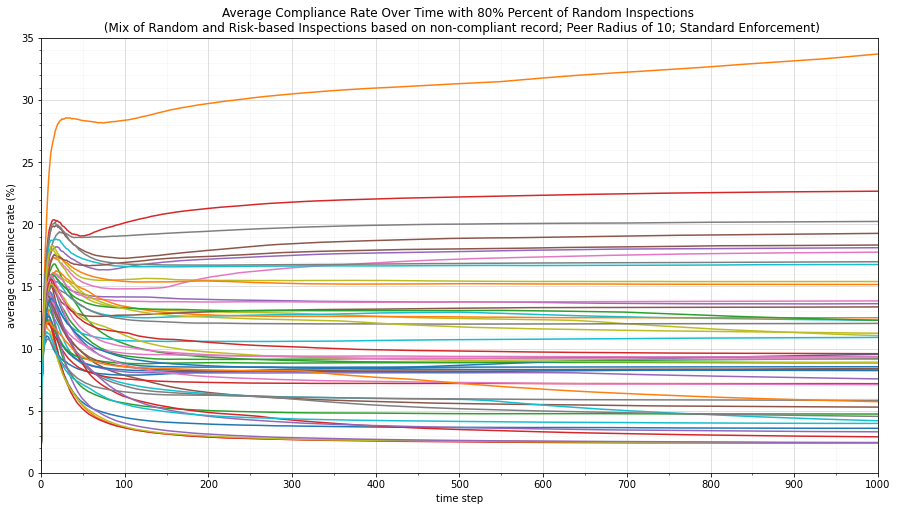

<Figure size 432x288 with 0 Axes>

In [73]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_80_1['step'],mixnoncomp_standard_sharerandinsp_80_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_2['step'],mixnoncomp_standard_sharerandinsp_80_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_3['step'],mixnoncomp_standard_sharerandinsp_80_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_4['step'],mixnoncomp_standard_sharerandinsp_80_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_5['step'],mixnoncomp_standard_sharerandinsp_80_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_6['step'],mixnoncomp_standard_sharerandinsp_80_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_7['step'],mixnoncomp_standard_sharerandinsp_80_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_8['step'],mixnoncomp_standard_sharerandinsp_80_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_9['step'],mixnoncomp_standard_sharerandinsp_80_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_10['step'],mixnoncomp_standard_sharerandinsp_80_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_11['step'],mixnoncomp_standard_sharerandinsp_80_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_12['step'],mixnoncomp_standard_sharerandinsp_80_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_13['step'],mixnoncomp_standard_sharerandinsp_80_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_14['step'],mixnoncomp_standard_sharerandinsp_80_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_15['step'],mixnoncomp_standard_sharerandinsp_80_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_16['step'],mixnoncomp_standard_sharerandinsp_80_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_17['step'],mixnoncomp_standard_sharerandinsp_80_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_18['step'],mixnoncomp_standard_sharerandinsp_80_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_19['step'],mixnoncomp_standard_sharerandinsp_80_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_20['step'],mixnoncomp_standard_sharerandinsp_80_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_21['step'],mixnoncomp_standard_sharerandinsp_80_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_22['step'],mixnoncomp_standard_sharerandinsp_80_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_23['step'],mixnoncomp_standard_sharerandinsp_80_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_24['step'],mixnoncomp_standard_sharerandinsp_80_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_25['step'],mixnoncomp_standard_sharerandinsp_80_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_26['step'],mixnoncomp_standard_sharerandinsp_80_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_27['step'],mixnoncomp_standard_sharerandinsp_80_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_28['step'],mixnoncomp_standard_sharerandinsp_80_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_29['step'],mixnoncomp_standard_sharerandinsp_80_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_30['step'],mixnoncomp_standard_sharerandinsp_80_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_31['step'],mixnoncomp_standard_sharerandinsp_80_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_32['step'],mixnoncomp_standard_sharerandinsp_80_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_33['step'],mixnoncomp_standard_sharerandinsp_80_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_34['step'],mixnoncomp_standard_sharerandinsp_80_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_35['step'],mixnoncomp_standard_sharerandinsp_80_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_36['step'],mixnoncomp_standard_sharerandinsp_80_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_37['step'],mixnoncomp_standard_sharerandinsp_80_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_38['step'],mixnoncomp_standard_sharerandinsp_80_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_39['step'],mixnoncomp_standard_sharerandinsp_80_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_40['step'],mixnoncomp_standard_sharerandinsp_80_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_41['step'],mixnoncomp_standard_sharerandinsp_80_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_42['step'],mixnoncomp_standard_sharerandinsp_80_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_43['step'],mixnoncomp_standard_sharerandinsp_80_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_44['step'],mixnoncomp_standard_sharerandinsp_80_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_45['step'],mixnoncomp_standard_sharerandinsp_80_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_46['step'],mixnoncomp_standard_sharerandinsp_80_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_47['step'],mixnoncomp_standard_sharerandinsp_80_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_48['step'],mixnoncomp_standard_sharerandinsp_80_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_49['step'],mixnoncomp_standard_sharerandinsp_80_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_50['step'],mixnoncomp_standard_sharerandinsp_80_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 80% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections80_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

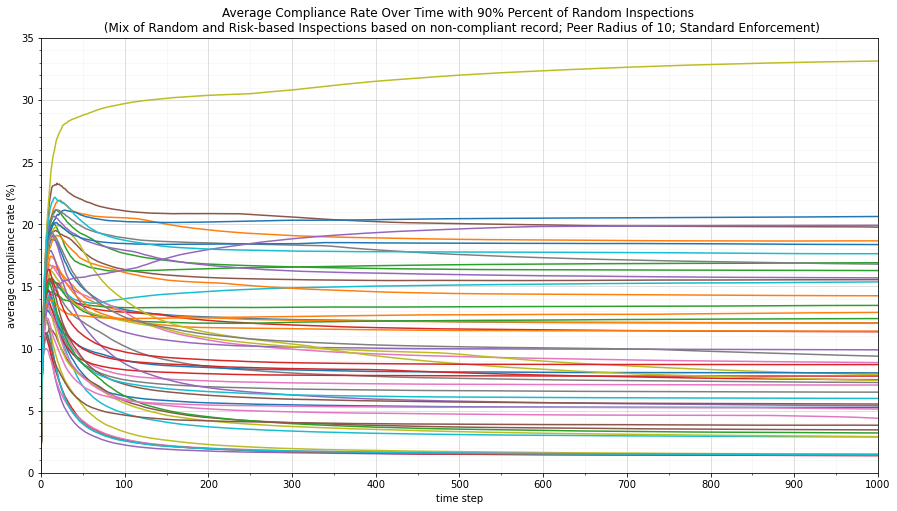

<Figure size 432x288 with 0 Axes>

In [74]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,35.1,5))
ax.set_yticks(np.arange(0,35.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_90_1['step'],mixnoncomp_standard_sharerandinsp_90_1['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_2['step'],mixnoncomp_standard_sharerandinsp_90_2['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_3['step'],mixnoncomp_standard_sharerandinsp_90_3['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_4['step'],mixnoncomp_standard_sharerandinsp_90_4['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_5['step'],mixnoncomp_standard_sharerandinsp_90_5['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_6['step'],mixnoncomp_standard_sharerandinsp_90_6['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_7['step'],mixnoncomp_standard_sharerandinsp_90_7['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_8['step'],mixnoncomp_standard_sharerandinsp_90_8['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_9['step'],mixnoncomp_standard_sharerandinsp_90_9['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_10['step'],mixnoncomp_standard_sharerandinsp_90_10['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_11['step'],mixnoncomp_standard_sharerandinsp_90_11['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_12['step'],mixnoncomp_standard_sharerandinsp_90_12['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_13['step'],mixnoncomp_standard_sharerandinsp_90_13['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_14['step'],mixnoncomp_standard_sharerandinsp_90_14['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_15['step'],mixnoncomp_standard_sharerandinsp_90_15['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_16['step'],mixnoncomp_standard_sharerandinsp_90_16['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_17['step'],mixnoncomp_standard_sharerandinsp_90_17['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_18['step'],mixnoncomp_standard_sharerandinsp_90_18['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_19['step'],mixnoncomp_standard_sharerandinsp_90_19['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_20['step'],mixnoncomp_standard_sharerandinsp_90_20['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_21['step'],mixnoncomp_standard_sharerandinsp_90_21['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_22['step'],mixnoncomp_standard_sharerandinsp_90_22['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_23['step'],mixnoncomp_standard_sharerandinsp_90_23['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_24['step'],mixnoncomp_standard_sharerandinsp_90_24['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_25['step'],mixnoncomp_standard_sharerandinsp_90_25['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_26['step'],mixnoncomp_standard_sharerandinsp_90_26['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_27['step'],mixnoncomp_standard_sharerandinsp_90_27['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_28['step'],mixnoncomp_standard_sharerandinsp_90_28['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_29['step'],mixnoncomp_standard_sharerandinsp_90_29['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_30['step'],mixnoncomp_standard_sharerandinsp_90_30['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_31['step'],mixnoncomp_standard_sharerandinsp_90_31['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_32['step'],mixnoncomp_standard_sharerandinsp_90_32['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_33['step'],mixnoncomp_standard_sharerandinsp_90_33['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_34['step'],mixnoncomp_standard_sharerandinsp_90_34['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_35['step'],mixnoncomp_standard_sharerandinsp_90_35['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_36['step'],mixnoncomp_standard_sharerandinsp_90_36['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_37['step'],mixnoncomp_standard_sharerandinsp_90_37['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_38['step'],mixnoncomp_standard_sharerandinsp_90_38['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_39['step'],mixnoncomp_standard_sharerandinsp_90_39['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_40['step'],mixnoncomp_standard_sharerandinsp_90_40['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_41['step'],mixnoncomp_standard_sharerandinsp_90_41['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_42['step'],mixnoncomp_standard_sharerandinsp_90_42['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_43['step'],mixnoncomp_standard_sharerandinsp_90_43['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_44['step'],mixnoncomp_standard_sharerandinsp_90_44['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_45['step'],mixnoncomp_standard_sharerandinsp_90_45['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_46['step'],mixnoncomp_standard_sharerandinsp_90_46['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_47['step'],mixnoncomp_standard_sharerandinsp_90_47['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_48['step'],mixnoncomp_standard_sharerandinsp_90_48['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_49['step'],mixnoncomp_standard_sharerandinsp_90_49['avg-compliance-rate'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_50['step'],mixnoncomp_standard_sharerandinsp_90_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 90% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,35.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections90_ Time vs Avg Compliance All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

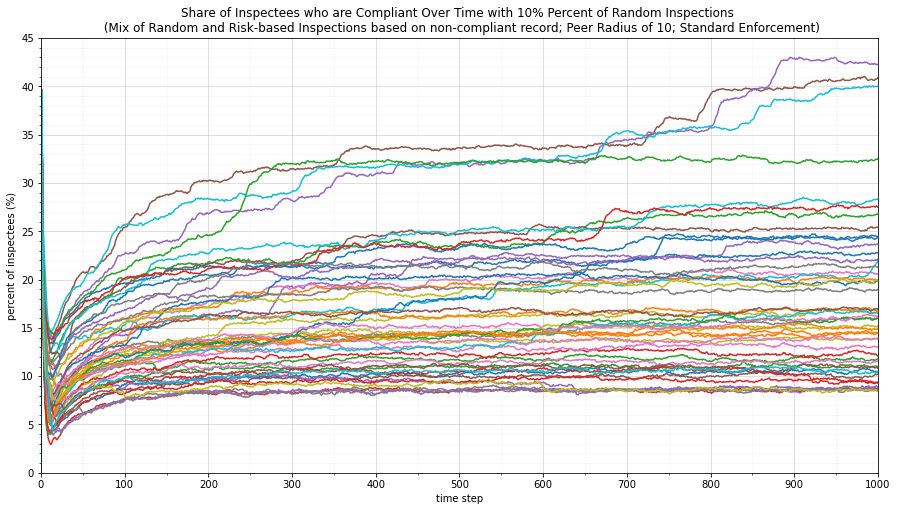

<Figure size 432x288 with 0 Axes>

In [82]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_10_1['step'],mixnoncomp_standard_sharerandinsp_10_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_2['step'],mixnoncomp_standard_sharerandinsp_10_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_3['step'],mixnoncomp_standard_sharerandinsp_10_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_4['step'],mixnoncomp_standard_sharerandinsp_10_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_5['step'],mixnoncomp_standard_sharerandinsp_10_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_6['step'],mixnoncomp_standard_sharerandinsp_10_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_7['step'],mixnoncomp_standard_sharerandinsp_10_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_8['step'],mixnoncomp_standard_sharerandinsp_10_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_9['step'],mixnoncomp_standard_sharerandinsp_10_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_10['step'],mixnoncomp_standard_sharerandinsp_10_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_11['step'],mixnoncomp_standard_sharerandinsp_10_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_12['step'],mixnoncomp_standard_sharerandinsp_10_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_13['step'],mixnoncomp_standard_sharerandinsp_10_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_14['step'],mixnoncomp_standard_sharerandinsp_10_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_15['step'],mixnoncomp_standard_sharerandinsp_10_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_16['step'],mixnoncomp_standard_sharerandinsp_10_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_17['step'],mixnoncomp_standard_sharerandinsp_10_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_18['step'],mixnoncomp_standard_sharerandinsp_10_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_19['step'],mixnoncomp_standard_sharerandinsp_10_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_20['step'],mixnoncomp_standard_sharerandinsp_10_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_21['step'],mixnoncomp_standard_sharerandinsp_10_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_22['step'],mixnoncomp_standard_sharerandinsp_10_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_23['step'],mixnoncomp_standard_sharerandinsp_10_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_24['step'],mixnoncomp_standard_sharerandinsp_10_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_25['step'],mixnoncomp_standard_sharerandinsp_10_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_26['step'],mixnoncomp_standard_sharerandinsp_10_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_27['step'],mixnoncomp_standard_sharerandinsp_10_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_28['step'],mixnoncomp_standard_sharerandinsp_10_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_29['step'],mixnoncomp_standard_sharerandinsp_10_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_30['step'],mixnoncomp_standard_sharerandinsp_10_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_31['step'],mixnoncomp_standard_sharerandinsp_10_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_32['step'],mixnoncomp_standard_sharerandinsp_10_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_33['step'],mixnoncomp_standard_sharerandinsp_10_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_34['step'],mixnoncomp_standard_sharerandinsp_10_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_35['step'],mixnoncomp_standard_sharerandinsp_10_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_36['step'],mixnoncomp_standard_sharerandinsp_10_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_37['step'],mixnoncomp_standard_sharerandinsp_10_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_38['step'],mixnoncomp_standard_sharerandinsp_10_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_39['step'],mixnoncomp_standard_sharerandinsp_10_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_40['step'],mixnoncomp_standard_sharerandinsp_10_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_41['step'],mixnoncomp_standard_sharerandinsp_10_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_42['step'],mixnoncomp_standard_sharerandinsp_10_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_43['step'],mixnoncomp_standard_sharerandinsp_10_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_44['step'],mixnoncomp_standard_sharerandinsp_10_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_45['step'],mixnoncomp_standard_sharerandinsp_10_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_46['step'],mixnoncomp_standard_sharerandinsp_10_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_47['step'],mixnoncomp_standard_sharerandinsp_10_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_48['step'],mixnoncomp_standard_sharerandinsp_10_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_49['step'],mixnoncomp_standard_sharerandinsp_10_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_10_50['step'],mixnoncomp_standard_sharerandinsp_10_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 10% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections10- Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

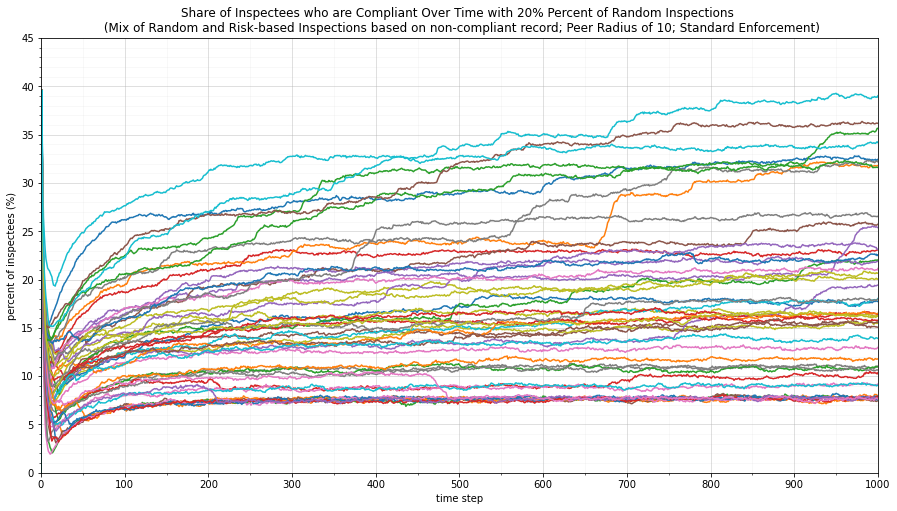

<Figure size 432x288 with 0 Axes>

In [83]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_20_1['step'],mixnoncomp_standard_sharerandinsp_20_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_2['step'],mixnoncomp_standard_sharerandinsp_20_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_3['step'],mixnoncomp_standard_sharerandinsp_20_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_4['step'],mixnoncomp_standard_sharerandinsp_20_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_5['step'],mixnoncomp_standard_sharerandinsp_20_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_6['step'],mixnoncomp_standard_sharerandinsp_20_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_7['step'],mixnoncomp_standard_sharerandinsp_20_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_8['step'],mixnoncomp_standard_sharerandinsp_20_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_9['step'],mixnoncomp_standard_sharerandinsp_20_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_10['step'],mixnoncomp_standard_sharerandinsp_20_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_11['step'],mixnoncomp_standard_sharerandinsp_20_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_12['step'],mixnoncomp_standard_sharerandinsp_20_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_13['step'],mixnoncomp_standard_sharerandinsp_20_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_14['step'],mixnoncomp_standard_sharerandinsp_20_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_15['step'],mixnoncomp_standard_sharerandinsp_20_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_16['step'],mixnoncomp_standard_sharerandinsp_20_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_17['step'],mixnoncomp_standard_sharerandinsp_20_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_18['step'],mixnoncomp_standard_sharerandinsp_20_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_19['step'],mixnoncomp_standard_sharerandinsp_20_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_20['step'],mixnoncomp_standard_sharerandinsp_20_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_21['step'],mixnoncomp_standard_sharerandinsp_20_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_22['step'],mixnoncomp_standard_sharerandinsp_20_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_23['step'],mixnoncomp_standard_sharerandinsp_20_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_24['step'],mixnoncomp_standard_sharerandinsp_20_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_25['step'],mixnoncomp_standard_sharerandinsp_20_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_26['step'],mixnoncomp_standard_sharerandinsp_20_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_27['step'],mixnoncomp_standard_sharerandinsp_20_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_28['step'],mixnoncomp_standard_sharerandinsp_20_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_29['step'],mixnoncomp_standard_sharerandinsp_20_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_30['step'],mixnoncomp_standard_sharerandinsp_20_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_31['step'],mixnoncomp_standard_sharerandinsp_20_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_32['step'],mixnoncomp_standard_sharerandinsp_20_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_33['step'],mixnoncomp_standard_sharerandinsp_20_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_34['step'],mixnoncomp_standard_sharerandinsp_20_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_35['step'],mixnoncomp_standard_sharerandinsp_20_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_36['step'],mixnoncomp_standard_sharerandinsp_20_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_37['step'],mixnoncomp_standard_sharerandinsp_20_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_38['step'],mixnoncomp_standard_sharerandinsp_20_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_39['step'],mixnoncomp_standard_sharerandinsp_20_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_40['step'],mixnoncomp_standard_sharerandinsp_20_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_41['step'],mixnoncomp_standard_sharerandinsp_20_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_42['step'],mixnoncomp_standard_sharerandinsp_20_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_43['step'],mixnoncomp_standard_sharerandinsp_20_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_44['step'],mixnoncomp_standard_sharerandinsp_20_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_45['step'],mixnoncomp_standard_sharerandinsp_20_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_46['step'],mixnoncomp_standard_sharerandinsp_20_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_47['step'],mixnoncomp_standard_sharerandinsp_20_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_48['step'],mixnoncomp_standard_sharerandinsp_20_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_49['step'],mixnoncomp_standard_sharerandinsp_20_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_20_50['step'],mixnoncomp_standard_sharerandinsp_20_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 20% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections20_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

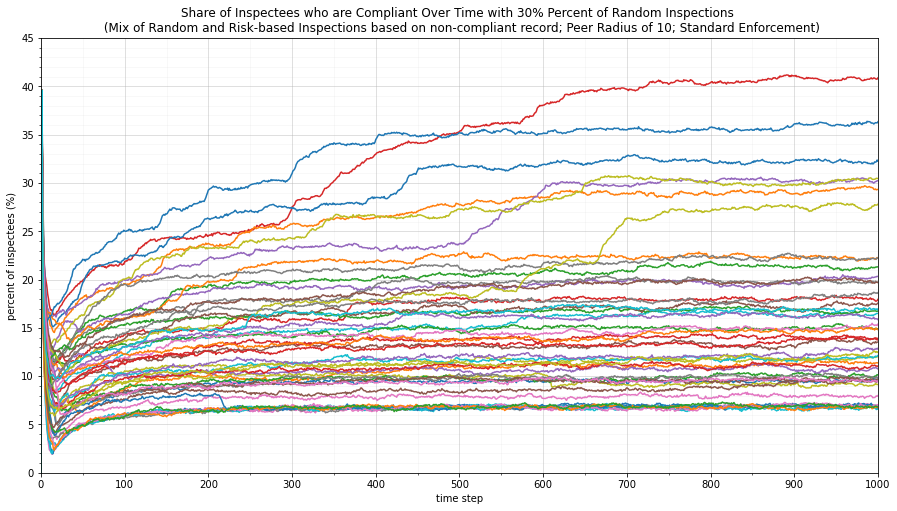

<Figure size 432x288 with 0 Axes>

In [85]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_30_1['step'],mixnoncomp_standard_sharerandinsp_30_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_2['step'],mixnoncomp_standard_sharerandinsp_30_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_3['step'],mixnoncomp_standard_sharerandinsp_30_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_4['step'],mixnoncomp_standard_sharerandinsp_30_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_5['step'],mixnoncomp_standard_sharerandinsp_30_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_6['step'],mixnoncomp_standard_sharerandinsp_30_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_7['step'],mixnoncomp_standard_sharerandinsp_30_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_8['step'],mixnoncomp_standard_sharerandinsp_30_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_9['step'],mixnoncomp_standard_sharerandinsp_30_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_10['step'],mixnoncomp_standard_sharerandinsp_30_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_11['step'],mixnoncomp_standard_sharerandinsp_30_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_12['step'],mixnoncomp_standard_sharerandinsp_30_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_13['step'],mixnoncomp_standard_sharerandinsp_30_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_14['step'],mixnoncomp_standard_sharerandinsp_30_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_15['step'],mixnoncomp_standard_sharerandinsp_30_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_16['step'],mixnoncomp_standard_sharerandinsp_30_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_17['step'],mixnoncomp_standard_sharerandinsp_30_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_18['step'],mixnoncomp_standard_sharerandinsp_30_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_19['step'],mixnoncomp_standard_sharerandinsp_30_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_20['step'],mixnoncomp_standard_sharerandinsp_30_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_21['step'],mixnoncomp_standard_sharerandinsp_30_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_22['step'],mixnoncomp_standard_sharerandinsp_30_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_23['step'],mixnoncomp_standard_sharerandinsp_30_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_24['step'],mixnoncomp_standard_sharerandinsp_30_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_25['step'],mixnoncomp_standard_sharerandinsp_30_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_26['step'],mixnoncomp_standard_sharerandinsp_30_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_27['step'],mixnoncomp_standard_sharerandinsp_30_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_28['step'],mixnoncomp_standard_sharerandinsp_30_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_29['step'],mixnoncomp_standard_sharerandinsp_30_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_30['step'],mixnoncomp_standard_sharerandinsp_30_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_31['step'],mixnoncomp_standard_sharerandinsp_30_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_32['step'],mixnoncomp_standard_sharerandinsp_30_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_33['step'],mixnoncomp_standard_sharerandinsp_30_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_34['step'],mixnoncomp_standard_sharerandinsp_30_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_35['step'],mixnoncomp_standard_sharerandinsp_30_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_36['step'],mixnoncomp_standard_sharerandinsp_30_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_37['step'],mixnoncomp_standard_sharerandinsp_30_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_38['step'],mixnoncomp_standard_sharerandinsp_30_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_39['step'],mixnoncomp_standard_sharerandinsp_30_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_40['step'],mixnoncomp_standard_sharerandinsp_30_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_41['step'],mixnoncomp_standard_sharerandinsp_30_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_42['step'],mixnoncomp_standard_sharerandinsp_30_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_43['step'],mixnoncomp_standard_sharerandinsp_30_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_44['step'],mixnoncomp_standard_sharerandinsp_30_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_45['step'],mixnoncomp_standard_sharerandinsp_30_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_46['step'],mixnoncomp_standard_sharerandinsp_30_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_47['step'],mixnoncomp_standard_sharerandinsp_30_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_48['step'],mixnoncomp_standard_sharerandinsp_30_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_49['step'],mixnoncomp_standard_sharerandinsp_30_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_30_50['step'],mixnoncomp_standard_sharerandinsp_30_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 30% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections30_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

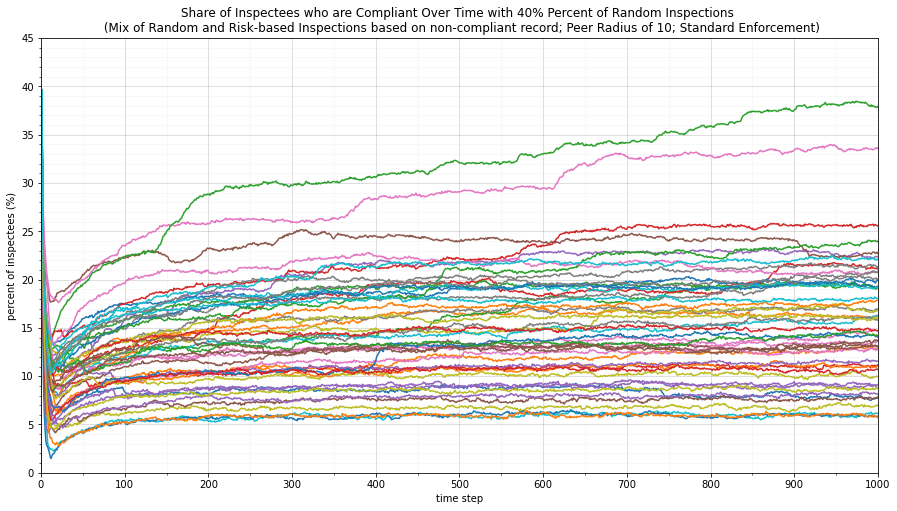

<Figure size 432x288 with 0 Axes>

In [87]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_40_1['step'],mixnoncomp_standard_sharerandinsp_40_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_2['step'],mixnoncomp_standard_sharerandinsp_40_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_3['step'],mixnoncomp_standard_sharerandinsp_40_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_4['step'],mixnoncomp_standard_sharerandinsp_40_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_5['step'],mixnoncomp_standard_sharerandinsp_40_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_6['step'],mixnoncomp_standard_sharerandinsp_40_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_7['step'],mixnoncomp_standard_sharerandinsp_40_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_8['step'],mixnoncomp_standard_sharerandinsp_40_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_9['step'],mixnoncomp_standard_sharerandinsp_40_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_10['step'],mixnoncomp_standard_sharerandinsp_40_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_11['step'],mixnoncomp_standard_sharerandinsp_40_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_12['step'],mixnoncomp_standard_sharerandinsp_40_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_13['step'],mixnoncomp_standard_sharerandinsp_40_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_14['step'],mixnoncomp_standard_sharerandinsp_40_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_15['step'],mixnoncomp_standard_sharerandinsp_40_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_16['step'],mixnoncomp_standard_sharerandinsp_40_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_17['step'],mixnoncomp_standard_sharerandinsp_40_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_18['step'],mixnoncomp_standard_sharerandinsp_40_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_19['step'],mixnoncomp_standard_sharerandinsp_40_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_20['step'],mixnoncomp_standard_sharerandinsp_40_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_21['step'],mixnoncomp_standard_sharerandinsp_40_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_22['step'],mixnoncomp_standard_sharerandinsp_40_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_23['step'],mixnoncomp_standard_sharerandinsp_40_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_24['step'],mixnoncomp_standard_sharerandinsp_40_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_25['step'],mixnoncomp_standard_sharerandinsp_40_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_26['step'],mixnoncomp_standard_sharerandinsp_40_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_27['step'],mixnoncomp_standard_sharerandinsp_40_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_28['step'],mixnoncomp_standard_sharerandinsp_40_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_29['step'],mixnoncomp_standard_sharerandinsp_40_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_30['step'],mixnoncomp_standard_sharerandinsp_40_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_31['step'],mixnoncomp_standard_sharerandinsp_40_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_32['step'],mixnoncomp_standard_sharerandinsp_40_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_33['step'],mixnoncomp_standard_sharerandinsp_40_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_34['step'],mixnoncomp_standard_sharerandinsp_40_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_35['step'],mixnoncomp_standard_sharerandinsp_40_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_36['step'],mixnoncomp_standard_sharerandinsp_40_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_37['step'],mixnoncomp_standard_sharerandinsp_40_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_38['step'],mixnoncomp_standard_sharerandinsp_40_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_39['step'],mixnoncomp_standard_sharerandinsp_40_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_40['step'],mixnoncomp_standard_sharerandinsp_40_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_41['step'],mixnoncomp_standard_sharerandinsp_40_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_42['step'],mixnoncomp_standard_sharerandinsp_40_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_43['step'],mixnoncomp_standard_sharerandinsp_40_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_44['step'],mixnoncomp_standard_sharerandinsp_40_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_45['step'],mixnoncomp_standard_sharerandinsp_40_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_46['step'],mixnoncomp_standard_sharerandinsp_40_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_47['step'],mixnoncomp_standard_sharerandinsp_40_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_48['step'],mixnoncomp_standard_sharerandinsp_40_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_49['step'],mixnoncomp_standard_sharerandinsp_40_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_40_50['step'],mixnoncomp_standard_sharerandinsp_40_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 40% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections40_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

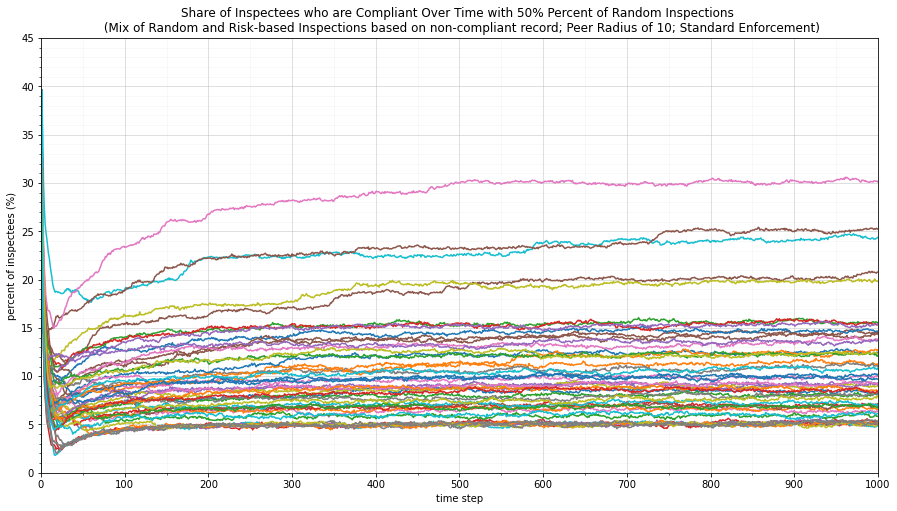

<Figure size 432x288 with 0 Axes>

In [89]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_50_1['step'],mixnoncomp_standard_sharerandinsp_50_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_2['step'],mixnoncomp_standard_sharerandinsp_50_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_3['step'],mixnoncomp_standard_sharerandinsp_50_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_4['step'],mixnoncomp_standard_sharerandinsp_50_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_5['step'],mixnoncomp_standard_sharerandinsp_50_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_6['step'],mixnoncomp_standard_sharerandinsp_50_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_7['step'],mixnoncomp_standard_sharerandinsp_50_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_8['step'],mixnoncomp_standard_sharerandinsp_50_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_9['step'],mixnoncomp_standard_sharerandinsp_50_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_10['step'],mixnoncomp_standard_sharerandinsp_50_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_11['step'],mixnoncomp_standard_sharerandinsp_50_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_12['step'],mixnoncomp_standard_sharerandinsp_50_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_13['step'],mixnoncomp_standard_sharerandinsp_50_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_14['step'],mixnoncomp_standard_sharerandinsp_50_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_15['step'],mixnoncomp_standard_sharerandinsp_50_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_16['step'],mixnoncomp_standard_sharerandinsp_50_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_17['step'],mixnoncomp_standard_sharerandinsp_50_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_18['step'],mixnoncomp_standard_sharerandinsp_50_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_19['step'],mixnoncomp_standard_sharerandinsp_50_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_20['step'],mixnoncomp_standard_sharerandinsp_50_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_21['step'],mixnoncomp_standard_sharerandinsp_50_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_22['step'],mixnoncomp_standard_sharerandinsp_50_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_23['step'],mixnoncomp_standard_sharerandinsp_50_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_24['step'],mixnoncomp_standard_sharerandinsp_50_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_25['step'],mixnoncomp_standard_sharerandinsp_50_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_26['step'],mixnoncomp_standard_sharerandinsp_50_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_27['step'],mixnoncomp_standard_sharerandinsp_50_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_28['step'],mixnoncomp_standard_sharerandinsp_50_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_29['step'],mixnoncomp_standard_sharerandinsp_50_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_30['step'],mixnoncomp_standard_sharerandinsp_50_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_31['step'],mixnoncomp_standard_sharerandinsp_50_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_32['step'],mixnoncomp_standard_sharerandinsp_50_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_33['step'],mixnoncomp_standard_sharerandinsp_50_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_34['step'],mixnoncomp_standard_sharerandinsp_50_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_35['step'],mixnoncomp_standard_sharerandinsp_50_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_36['step'],mixnoncomp_standard_sharerandinsp_50_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_37['step'],mixnoncomp_standard_sharerandinsp_50_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_38['step'],mixnoncomp_standard_sharerandinsp_50_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_39['step'],mixnoncomp_standard_sharerandinsp_50_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_40['step'],mixnoncomp_standard_sharerandinsp_50_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_41['step'],mixnoncomp_standard_sharerandinsp_50_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_42['step'],mixnoncomp_standard_sharerandinsp_50_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_43['step'],mixnoncomp_standard_sharerandinsp_50_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_44['step'],mixnoncomp_standard_sharerandinsp_50_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_45['step'],mixnoncomp_standard_sharerandinsp_50_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_46['step'],mixnoncomp_standard_sharerandinsp_50_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_47['step'],mixnoncomp_standard_sharerandinsp_50_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_48['step'],mixnoncomp_standard_sharerandinsp_50_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_49['step'],mixnoncomp_standard_sharerandinsp_50_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_50_50['step'],mixnoncomp_standard_sharerandinsp_50_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 50% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections50_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

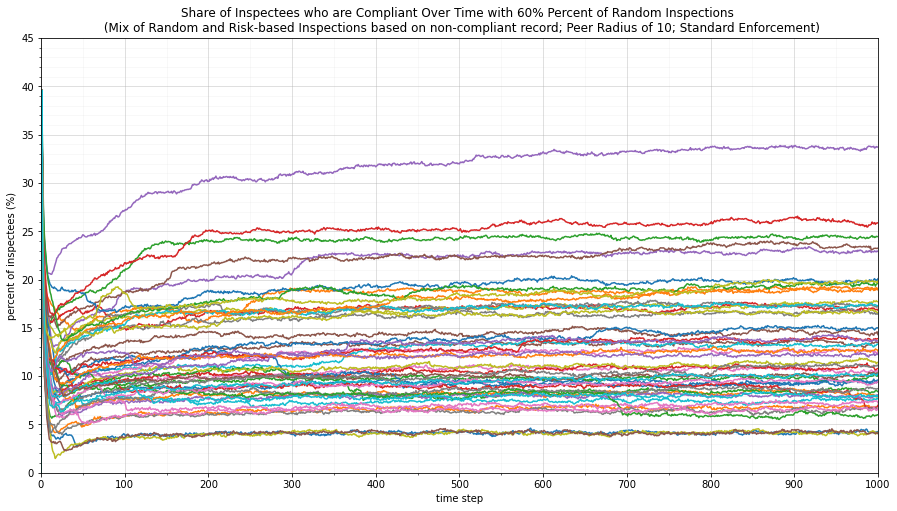

<Figure size 432x288 with 0 Axes>

In [91]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_60_1['step'],mixnoncomp_standard_sharerandinsp_60_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_2['step'],mixnoncomp_standard_sharerandinsp_60_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_3['step'],mixnoncomp_standard_sharerandinsp_60_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_4['step'],mixnoncomp_standard_sharerandinsp_60_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_5['step'],mixnoncomp_standard_sharerandinsp_60_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_6['step'],mixnoncomp_standard_sharerandinsp_60_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_7['step'],mixnoncomp_standard_sharerandinsp_60_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_8['step'],mixnoncomp_standard_sharerandinsp_60_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_9['step'],mixnoncomp_standard_sharerandinsp_60_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_10['step'],mixnoncomp_standard_sharerandinsp_60_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_11['step'],mixnoncomp_standard_sharerandinsp_60_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_12['step'],mixnoncomp_standard_sharerandinsp_60_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_13['step'],mixnoncomp_standard_sharerandinsp_60_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_14['step'],mixnoncomp_standard_sharerandinsp_60_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_15['step'],mixnoncomp_standard_sharerandinsp_60_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_16['step'],mixnoncomp_standard_sharerandinsp_60_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_17['step'],mixnoncomp_standard_sharerandinsp_60_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_18['step'],mixnoncomp_standard_sharerandinsp_60_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_19['step'],mixnoncomp_standard_sharerandinsp_60_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_20['step'],mixnoncomp_standard_sharerandinsp_60_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_21['step'],mixnoncomp_standard_sharerandinsp_60_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_22['step'],mixnoncomp_standard_sharerandinsp_60_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_23['step'],mixnoncomp_standard_sharerandinsp_60_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_24['step'],mixnoncomp_standard_sharerandinsp_60_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_25['step'],mixnoncomp_standard_sharerandinsp_60_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_26['step'],mixnoncomp_standard_sharerandinsp_60_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_27['step'],mixnoncomp_standard_sharerandinsp_60_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_28['step'],mixnoncomp_standard_sharerandinsp_60_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_29['step'],mixnoncomp_standard_sharerandinsp_60_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_30['step'],mixnoncomp_standard_sharerandinsp_60_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_31['step'],mixnoncomp_standard_sharerandinsp_60_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_32['step'],mixnoncomp_standard_sharerandinsp_60_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_33['step'],mixnoncomp_standard_sharerandinsp_60_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_34['step'],mixnoncomp_standard_sharerandinsp_60_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_35['step'],mixnoncomp_standard_sharerandinsp_60_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_36['step'],mixnoncomp_standard_sharerandinsp_60_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_37['step'],mixnoncomp_standard_sharerandinsp_60_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_38['step'],mixnoncomp_standard_sharerandinsp_60_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_39['step'],mixnoncomp_standard_sharerandinsp_60_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_40['step'],mixnoncomp_standard_sharerandinsp_60_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_41['step'],mixnoncomp_standard_sharerandinsp_60_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_42['step'],mixnoncomp_standard_sharerandinsp_60_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_43['step'],mixnoncomp_standard_sharerandinsp_60_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_44['step'],mixnoncomp_standard_sharerandinsp_60_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_45['step'],mixnoncomp_standard_sharerandinsp_60_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_46['step'],mixnoncomp_standard_sharerandinsp_60_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_47['step'],mixnoncomp_standard_sharerandinsp_60_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_48['step'],mixnoncomp_standard_sharerandinsp_60_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_49['step'],mixnoncomp_standard_sharerandinsp_60_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_60_50['step'],mixnoncomp_standard_sharerandinsp_60_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 60% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections60_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

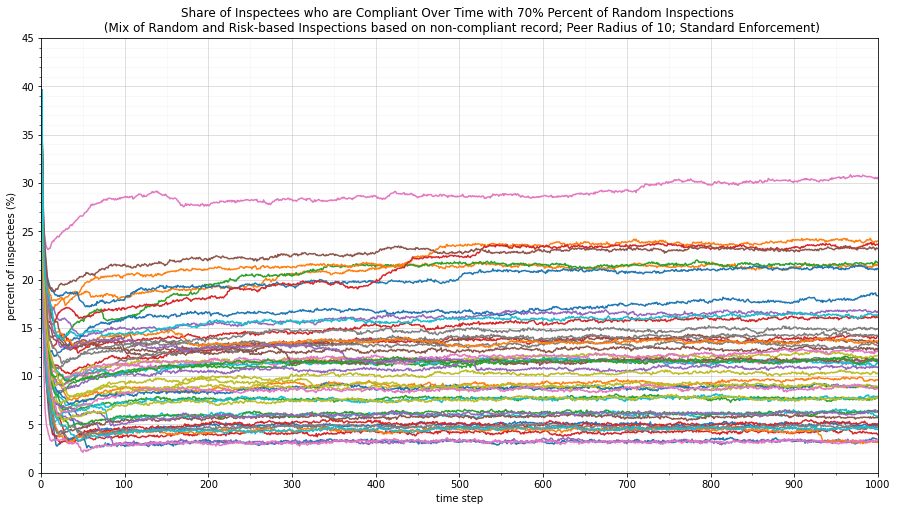

<Figure size 432x288 with 0 Axes>

In [90]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_70_1['step'],mixnoncomp_standard_sharerandinsp_70_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_2['step'],mixnoncomp_standard_sharerandinsp_70_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_3['step'],mixnoncomp_standard_sharerandinsp_70_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_4['step'],mixnoncomp_standard_sharerandinsp_70_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_5['step'],mixnoncomp_standard_sharerandinsp_70_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_6['step'],mixnoncomp_standard_sharerandinsp_70_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_7['step'],mixnoncomp_standard_sharerandinsp_70_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_8['step'],mixnoncomp_standard_sharerandinsp_70_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_9['step'],mixnoncomp_standard_sharerandinsp_70_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_10['step'],mixnoncomp_standard_sharerandinsp_70_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_11['step'],mixnoncomp_standard_sharerandinsp_70_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_12['step'],mixnoncomp_standard_sharerandinsp_70_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_13['step'],mixnoncomp_standard_sharerandinsp_70_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_14['step'],mixnoncomp_standard_sharerandinsp_70_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_15['step'],mixnoncomp_standard_sharerandinsp_70_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_16['step'],mixnoncomp_standard_sharerandinsp_70_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_17['step'],mixnoncomp_standard_sharerandinsp_70_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_18['step'],mixnoncomp_standard_sharerandinsp_70_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_19['step'],mixnoncomp_standard_sharerandinsp_70_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_20['step'],mixnoncomp_standard_sharerandinsp_70_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_21['step'],mixnoncomp_standard_sharerandinsp_70_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_22['step'],mixnoncomp_standard_sharerandinsp_70_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_23['step'],mixnoncomp_standard_sharerandinsp_70_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_24['step'],mixnoncomp_standard_sharerandinsp_70_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_25['step'],mixnoncomp_standard_sharerandinsp_70_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_26['step'],mixnoncomp_standard_sharerandinsp_70_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_27['step'],mixnoncomp_standard_sharerandinsp_70_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_28['step'],mixnoncomp_standard_sharerandinsp_70_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_29['step'],mixnoncomp_standard_sharerandinsp_70_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_30['step'],mixnoncomp_standard_sharerandinsp_70_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_31['step'],mixnoncomp_standard_sharerandinsp_70_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_32['step'],mixnoncomp_standard_sharerandinsp_70_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_33['step'],mixnoncomp_standard_sharerandinsp_70_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_34['step'],mixnoncomp_standard_sharerandinsp_70_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_35['step'],mixnoncomp_standard_sharerandinsp_70_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_36['step'],mixnoncomp_standard_sharerandinsp_70_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_37['step'],mixnoncomp_standard_sharerandinsp_70_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_38['step'],mixnoncomp_standard_sharerandinsp_70_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_39['step'],mixnoncomp_standard_sharerandinsp_70_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_40['step'],mixnoncomp_standard_sharerandinsp_70_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_41['step'],mixnoncomp_standard_sharerandinsp_70_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_42['step'],mixnoncomp_standard_sharerandinsp_70_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_43['step'],mixnoncomp_standard_sharerandinsp_70_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_44['step'],mixnoncomp_standard_sharerandinsp_70_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_45['step'],mixnoncomp_standard_sharerandinsp_70_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_46['step'],mixnoncomp_standard_sharerandinsp_70_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_47['step'],mixnoncomp_standard_sharerandinsp_70_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_48['step'],mixnoncomp_standard_sharerandinsp_70_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_49['step'],mixnoncomp_standard_sharerandinsp_70_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_70_50['step'],mixnoncomp_standard_sharerandinsp_70_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 70% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections70_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

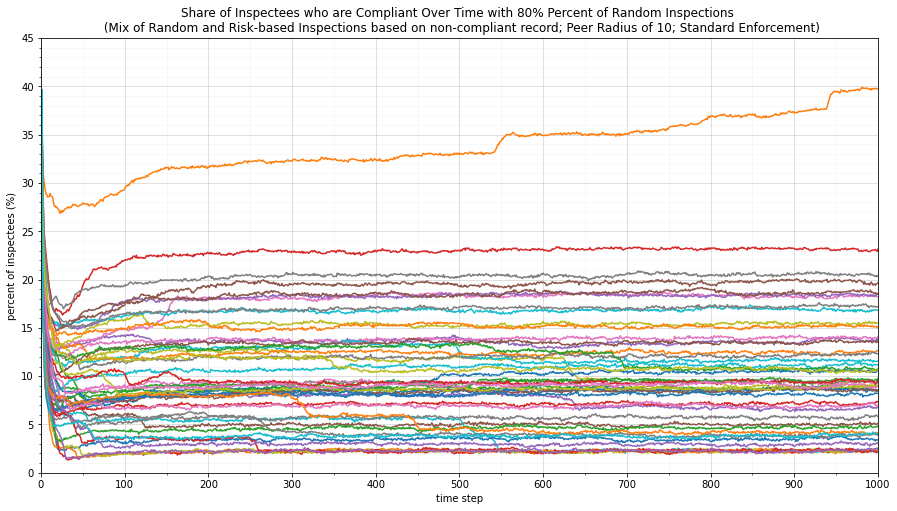

<Figure size 432x288 with 0 Axes>

In [92]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_80_1['step'],mixnoncomp_standard_sharerandinsp_80_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_2['step'],mixnoncomp_standard_sharerandinsp_80_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_3['step'],mixnoncomp_standard_sharerandinsp_80_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_4['step'],mixnoncomp_standard_sharerandinsp_80_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_5['step'],mixnoncomp_standard_sharerandinsp_80_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_6['step'],mixnoncomp_standard_sharerandinsp_80_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_7['step'],mixnoncomp_standard_sharerandinsp_80_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_8['step'],mixnoncomp_standard_sharerandinsp_80_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_9['step'],mixnoncomp_standard_sharerandinsp_80_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_10['step'],mixnoncomp_standard_sharerandinsp_80_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_11['step'],mixnoncomp_standard_sharerandinsp_80_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_12['step'],mixnoncomp_standard_sharerandinsp_80_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_13['step'],mixnoncomp_standard_sharerandinsp_80_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_14['step'],mixnoncomp_standard_sharerandinsp_80_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_15['step'],mixnoncomp_standard_sharerandinsp_80_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_16['step'],mixnoncomp_standard_sharerandinsp_80_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_17['step'],mixnoncomp_standard_sharerandinsp_80_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_18['step'],mixnoncomp_standard_sharerandinsp_80_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_19['step'],mixnoncomp_standard_sharerandinsp_80_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_20['step'],mixnoncomp_standard_sharerandinsp_80_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_21['step'],mixnoncomp_standard_sharerandinsp_80_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_22['step'],mixnoncomp_standard_sharerandinsp_80_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_23['step'],mixnoncomp_standard_sharerandinsp_80_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_24['step'],mixnoncomp_standard_sharerandinsp_80_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_25['step'],mixnoncomp_standard_sharerandinsp_80_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_26['step'],mixnoncomp_standard_sharerandinsp_80_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_27['step'],mixnoncomp_standard_sharerandinsp_80_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_28['step'],mixnoncomp_standard_sharerandinsp_80_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_29['step'],mixnoncomp_standard_sharerandinsp_80_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_30['step'],mixnoncomp_standard_sharerandinsp_80_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_31['step'],mixnoncomp_standard_sharerandinsp_80_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_32['step'],mixnoncomp_standard_sharerandinsp_80_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_33['step'],mixnoncomp_standard_sharerandinsp_80_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_34['step'],mixnoncomp_standard_sharerandinsp_80_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_35['step'],mixnoncomp_standard_sharerandinsp_80_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_36['step'],mixnoncomp_standard_sharerandinsp_80_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_37['step'],mixnoncomp_standard_sharerandinsp_80_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_38['step'],mixnoncomp_standard_sharerandinsp_80_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_39['step'],mixnoncomp_standard_sharerandinsp_80_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_40['step'],mixnoncomp_standard_sharerandinsp_80_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_41['step'],mixnoncomp_standard_sharerandinsp_80_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_42['step'],mixnoncomp_standard_sharerandinsp_80_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_43['step'],mixnoncomp_standard_sharerandinsp_80_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_44['step'],mixnoncomp_standard_sharerandinsp_80_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_45['step'],mixnoncomp_standard_sharerandinsp_80_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_46['step'],mixnoncomp_standard_sharerandinsp_80_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_47['step'],mixnoncomp_standard_sharerandinsp_80_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_48['step'],mixnoncomp_standard_sharerandinsp_80_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_49['step'],mixnoncomp_standard_sharerandinsp_80_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_80_50['step'],mixnoncomp_standard_sharerandinsp_80_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 80% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections80_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

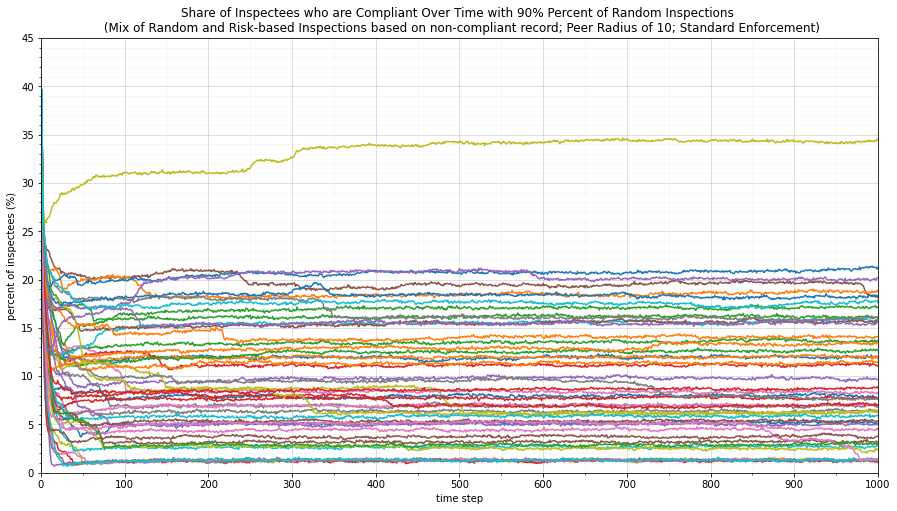

<Figure size 432x288 with 0 Axes>

In [93]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,45.1,5))
ax.set_yticks(np.arange(0,45.1,1), minor=True)

plt.plot(mixnoncomp_standard_sharerandinsp_90_1['step'],mixnoncomp_standard_sharerandinsp_90_1['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_2['step'],mixnoncomp_standard_sharerandinsp_90_2['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_3['step'],mixnoncomp_standard_sharerandinsp_90_3['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_4['step'],mixnoncomp_standard_sharerandinsp_90_4['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_5['step'],mixnoncomp_standard_sharerandinsp_90_5['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_6['step'],mixnoncomp_standard_sharerandinsp_90_6['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_7['step'],mixnoncomp_standard_sharerandinsp_90_7['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_8['step'],mixnoncomp_standard_sharerandinsp_90_8['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_9['step'],mixnoncomp_standard_sharerandinsp_90_9['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_10['step'],mixnoncomp_standard_sharerandinsp_90_10['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_11['step'],mixnoncomp_standard_sharerandinsp_90_11['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_12['step'],mixnoncomp_standard_sharerandinsp_90_12['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_13['step'],mixnoncomp_standard_sharerandinsp_90_13['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_14['step'],mixnoncomp_standard_sharerandinsp_90_14['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_15['step'],mixnoncomp_standard_sharerandinsp_90_15['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_16['step'],mixnoncomp_standard_sharerandinsp_90_16['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_17['step'],mixnoncomp_standard_sharerandinsp_90_17['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_18['step'],mixnoncomp_standard_sharerandinsp_90_18['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_19['step'],mixnoncomp_standard_sharerandinsp_90_19['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_20['step'],mixnoncomp_standard_sharerandinsp_90_20['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_21['step'],mixnoncomp_standard_sharerandinsp_90_21['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_22['step'],mixnoncomp_standard_sharerandinsp_90_22['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_23['step'],mixnoncomp_standard_sharerandinsp_90_23['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_24['step'],mixnoncomp_standard_sharerandinsp_90_24['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_25['step'],mixnoncomp_standard_sharerandinsp_90_25['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_26['step'],mixnoncomp_standard_sharerandinsp_90_26['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_27['step'],mixnoncomp_standard_sharerandinsp_90_27['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_28['step'],mixnoncomp_standard_sharerandinsp_90_28['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_29['step'],mixnoncomp_standard_sharerandinsp_90_29['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_30['step'],mixnoncomp_standard_sharerandinsp_90_30['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_31['step'],mixnoncomp_standard_sharerandinsp_90_31['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_32['step'],mixnoncomp_standard_sharerandinsp_90_32['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_33['step'],mixnoncomp_standard_sharerandinsp_90_33['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_34['step'],mixnoncomp_standard_sharerandinsp_90_34['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_35['step'],mixnoncomp_standard_sharerandinsp_90_35['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_36['step'],mixnoncomp_standard_sharerandinsp_90_36['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_37['step'],mixnoncomp_standard_sharerandinsp_90_37['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_38['step'],mixnoncomp_standard_sharerandinsp_90_38['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_39['step'],mixnoncomp_standard_sharerandinsp_90_39['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_40['step'],mixnoncomp_standard_sharerandinsp_90_40['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_41['step'],mixnoncomp_standard_sharerandinsp_90_41['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_42['step'],mixnoncomp_standard_sharerandinsp_90_42['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_43['step'],mixnoncomp_standard_sharerandinsp_90_43['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_44['step'],mixnoncomp_standard_sharerandinsp_90_44['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_45['step'],mixnoncomp_standard_sharerandinsp_90_45['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_46['step'],mixnoncomp_standard_sharerandinsp_90_46['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_47['step'],mixnoncomp_standard_sharerandinsp_90_47['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_48['step'],mixnoncomp_standard_sharerandinsp_90_48['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_49['step'],mixnoncomp_standard_sharerandinsp_90_49['perc-compliant'])
plt.plot(mixnoncomp_standard_sharerandinsp_90_50['step'],mixnoncomp_standard_sharerandinsp_90_50['perc-compliant'])


plt.title("Share of Inspectees who are Compliant Over Time with 90% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Standard Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,45.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections90_ Time vs Compliant All Runs (Mix non-compliant, Standard, Radius 10).png', dpi=300, bbox_inches='tight')

### Responsive enforcement

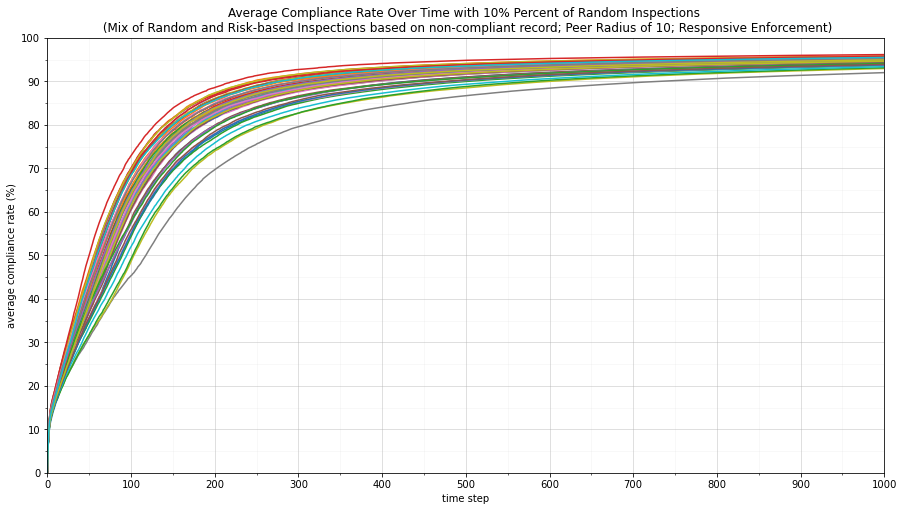

<Figure size 432x288 with 0 Axes>

In [98]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_1['step'],mixnoncomp_resp_sharerandinsp_10_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_2['step'],mixnoncomp_resp_sharerandinsp_10_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_3['step'],mixnoncomp_resp_sharerandinsp_10_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_4['step'],mixnoncomp_resp_sharerandinsp_10_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_5['step'],mixnoncomp_resp_sharerandinsp_10_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_6['step'],mixnoncomp_resp_sharerandinsp_10_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_7['step'],mixnoncomp_resp_sharerandinsp_10_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_8['step'],mixnoncomp_resp_sharerandinsp_10_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_9['step'],mixnoncomp_resp_sharerandinsp_10_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_10['step'],mixnoncomp_resp_sharerandinsp_10_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_11['step'],mixnoncomp_resp_sharerandinsp_10_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_12['step'],mixnoncomp_resp_sharerandinsp_10_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_13['step'],mixnoncomp_resp_sharerandinsp_10_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_14['step'],mixnoncomp_resp_sharerandinsp_10_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_15['step'],mixnoncomp_resp_sharerandinsp_10_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_16['step'],mixnoncomp_resp_sharerandinsp_10_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_17['step'],mixnoncomp_resp_sharerandinsp_10_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_18['step'],mixnoncomp_resp_sharerandinsp_10_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_19['step'],mixnoncomp_resp_sharerandinsp_10_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_20['step'],mixnoncomp_resp_sharerandinsp_10_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_21['step'],mixnoncomp_resp_sharerandinsp_10_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_22['step'],mixnoncomp_resp_sharerandinsp_10_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_23['step'],mixnoncomp_resp_sharerandinsp_10_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_24['step'],mixnoncomp_resp_sharerandinsp_10_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_25['step'],mixnoncomp_resp_sharerandinsp_10_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_26['step'],mixnoncomp_resp_sharerandinsp_10_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_27['step'],mixnoncomp_resp_sharerandinsp_10_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_28['step'],mixnoncomp_resp_sharerandinsp_10_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_29['step'],mixnoncomp_resp_sharerandinsp_10_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_30['step'],mixnoncomp_resp_sharerandinsp_10_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_31['step'],mixnoncomp_resp_sharerandinsp_10_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_32['step'],mixnoncomp_resp_sharerandinsp_10_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_33['step'],mixnoncomp_resp_sharerandinsp_10_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_34['step'],mixnoncomp_resp_sharerandinsp_10_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_35['step'],mixnoncomp_resp_sharerandinsp_10_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_36['step'],mixnoncomp_resp_sharerandinsp_10_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_37['step'],mixnoncomp_resp_sharerandinsp_10_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_38['step'],mixnoncomp_resp_sharerandinsp_10_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_39['step'],mixnoncomp_resp_sharerandinsp_10_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_40['step'],mixnoncomp_resp_sharerandinsp_10_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_41['step'],mixnoncomp_resp_sharerandinsp_10_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_42['step'],mixnoncomp_resp_sharerandinsp_10_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_43['step'],mixnoncomp_resp_sharerandinsp_10_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_44['step'],mixnoncomp_resp_sharerandinsp_10_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_45['step'],mixnoncomp_resp_sharerandinsp_10_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_46['step'],mixnoncomp_resp_sharerandinsp_10_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_47['step'],mixnoncomp_resp_sharerandinsp_10_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_48['step'],mixnoncomp_resp_sharerandinsp_10_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_49['step'],mixnoncomp_resp_sharerandinsp_10_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_50['step'],mixnoncomp_resp_sharerandinsp_10_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 10% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections10- Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

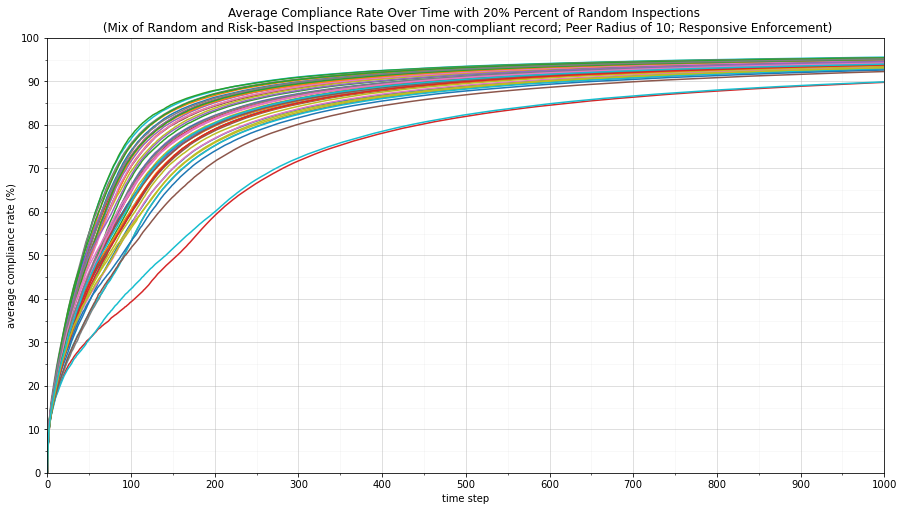

<Figure size 432x288 with 0 Axes>

In [99]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_20_1['step'],mixnoncomp_resp_sharerandinsp_20_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_2['step'],mixnoncomp_resp_sharerandinsp_20_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_3['step'],mixnoncomp_resp_sharerandinsp_20_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_4['step'],mixnoncomp_resp_sharerandinsp_20_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_5['step'],mixnoncomp_resp_sharerandinsp_20_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_6['step'],mixnoncomp_resp_sharerandinsp_20_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_7['step'],mixnoncomp_resp_sharerandinsp_20_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_8['step'],mixnoncomp_resp_sharerandinsp_20_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_9['step'],mixnoncomp_resp_sharerandinsp_20_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_10['step'],mixnoncomp_resp_sharerandinsp_20_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_11['step'],mixnoncomp_resp_sharerandinsp_20_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_12['step'],mixnoncomp_resp_sharerandinsp_20_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_13['step'],mixnoncomp_resp_sharerandinsp_20_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_14['step'],mixnoncomp_resp_sharerandinsp_20_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_15['step'],mixnoncomp_resp_sharerandinsp_20_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_16['step'],mixnoncomp_resp_sharerandinsp_20_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_17['step'],mixnoncomp_resp_sharerandinsp_20_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_18['step'],mixnoncomp_resp_sharerandinsp_20_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_19['step'],mixnoncomp_resp_sharerandinsp_20_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_20['step'],mixnoncomp_resp_sharerandinsp_20_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_21['step'],mixnoncomp_resp_sharerandinsp_20_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_22['step'],mixnoncomp_resp_sharerandinsp_20_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_23['step'],mixnoncomp_resp_sharerandinsp_20_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_24['step'],mixnoncomp_resp_sharerandinsp_20_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_25['step'],mixnoncomp_resp_sharerandinsp_20_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_26['step'],mixnoncomp_resp_sharerandinsp_20_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_27['step'],mixnoncomp_resp_sharerandinsp_20_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_28['step'],mixnoncomp_resp_sharerandinsp_20_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_29['step'],mixnoncomp_resp_sharerandinsp_20_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_30['step'],mixnoncomp_resp_sharerandinsp_20_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_31['step'],mixnoncomp_resp_sharerandinsp_20_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_32['step'],mixnoncomp_resp_sharerandinsp_20_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_33['step'],mixnoncomp_resp_sharerandinsp_20_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_34['step'],mixnoncomp_resp_sharerandinsp_20_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_35['step'],mixnoncomp_resp_sharerandinsp_20_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_36['step'],mixnoncomp_resp_sharerandinsp_20_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_37['step'],mixnoncomp_resp_sharerandinsp_20_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_38['step'],mixnoncomp_resp_sharerandinsp_20_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_39['step'],mixnoncomp_resp_sharerandinsp_20_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_40['step'],mixnoncomp_resp_sharerandinsp_20_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_41['step'],mixnoncomp_resp_sharerandinsp_20_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_42['step'],mixnoncomp_resp_sharerandinsp_20_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_43['step'],mixnoncomp_resp_sharerandinsp_20_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_44['step'],mixnoncomp_resp_sharerandinsp_20_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_45['step'],mixnoncomp_resp_sharerandinsp_20_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_46['step'],mixnoncomp_resp_sharerandinsp_20_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_47['step'],mixnoncomp_resp_sharerandinsp_20_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_48['step'],mixnoncomp_resp_sharerandinsp_20_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_49['step'],mixnoncomp_resp_sharerandinsp_20_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_50['step'],mixnoncomp_resp_sharerandinsp_20_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 20% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections20_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

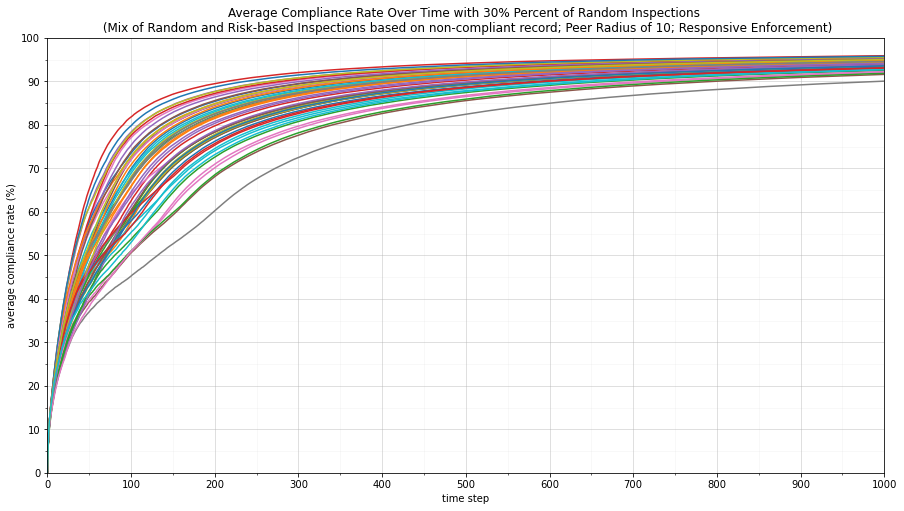

<Figure size 432x288 with 0 Axes>

In [101]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_30_1['step'],mixnoncomp_resp_sharerandinsp_30_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_2['step'],mixnoncomp_resp_sharerandinsp_30_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_3['step'],mixnoncomp_resp_sharerandinsp_30_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_4['step'],mixnoncomp_resp_sharerandinsp_30_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_5['step'],mixnoncomp_resp_sharerandinsp_30_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_6['step'],mixnoncomp_resp_sharerandinsp_30_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_7['step'],mixnoncomp_resp_sharerandinsp_30_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_8['step'],mixnoncomp_resp_sharerandinsp_30_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_9['step'],mixnoncomp_resp_sharerandinsp_30_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_10['step'],mixnoncomp_resp_sharerandinsp_30_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_11['step'],mixnoncomp_resp_sharerandinsp_30_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_12['step'],mixnoncomp_resp_sharerandinsp_30_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_13['step'],mixnoncomp_resp_sharerandinsp_30_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_14['step'],mixnoncomp_resp_sharerandinsp_30_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_15['step'],mixnoncomp_resp_sharerandinsp_30_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_16['step'],mixnoncomp_resp_sharerandinsp_30_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_17['step'],mixnoncomp_resp_sharerandinsp_30_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_18['step'],mixnoncomp_resp_sharerandinsp_30_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_19['step'],mixnoncomp_resp_sharerandinsp_30_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_20['step'],mixnoncomp_resp_sharerandinsp_30_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_21['step'],mixnoncomp_resp_sharerandinsp_30_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_22['step'],mixnoncomp_resp_sharerandinsp_30_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_23['step'],mixnoncomp_resp_sharerandinsp_30_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_24['step'],mixnoncomp_resp_sharerandinsp_30_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_25['step'],mixnoncomp_resp_sharerandinsp_30_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_26['step'],mixnoncomp_resp_sharerandinsp_30_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_27['step'],mixnoncomp_resp_sharerandinsp_30_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_28['step'],mixnoncomp_resp_sharerandinsp_30_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_29['step'],mixnoncomp_resp_sharerandinsp_30_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_30['step'],mixnoncomp_resp_sharerandinsp_30_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_31['step'],mixnoncomp_resp_sharerandinsp_30_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_32['step'],mixnoncomp_resp_sharerandinsp_30_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_33['step'],mixnoncomp_resp_sharerandinsp_30_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_34['step'],mixnoncomp_resp_sharerandinsp_30_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_35['step'],mixnoncomp_resp_sharerandinsp_30_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_36['step'],mixnoncomp_resp_sharerandinsp_30_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_37['step'],mixnoncomp_resp_sharerandinsp_30_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_38['step'],mixnoncomp_resp_sharerandinsp_30_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_39['step'],mixnoncomp_resp_sharerandinsp_30_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_40['step'],mixnoncomp_resp_sharerandinsp_30_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_41['step'],mixnoncomp_resp_sharerandinsp_30_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_42['step'],mixnoncomp_resp_sharerandinsp_30_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_43['step'],mixnoncomp_resp_sharerandinsp_30_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_44['step'],mixnoncomp_resp_sharerandinsp_30_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_45['step'],mixnoncomp_resp_sharerandinsp_30_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_46['step'],mixnoncomp_resp_sharerandinsp_30_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_47['step'],mixnoncomp_resp_sharerandinsp_30_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_48['step'],mixnoncomp_resp_sharerandinsp_30_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_49['step'],mixnoncomp_resp_sharerandinsp_30_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_50['step'],mixnoncomp_resp_sharerandinsp_30_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 30% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections30_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

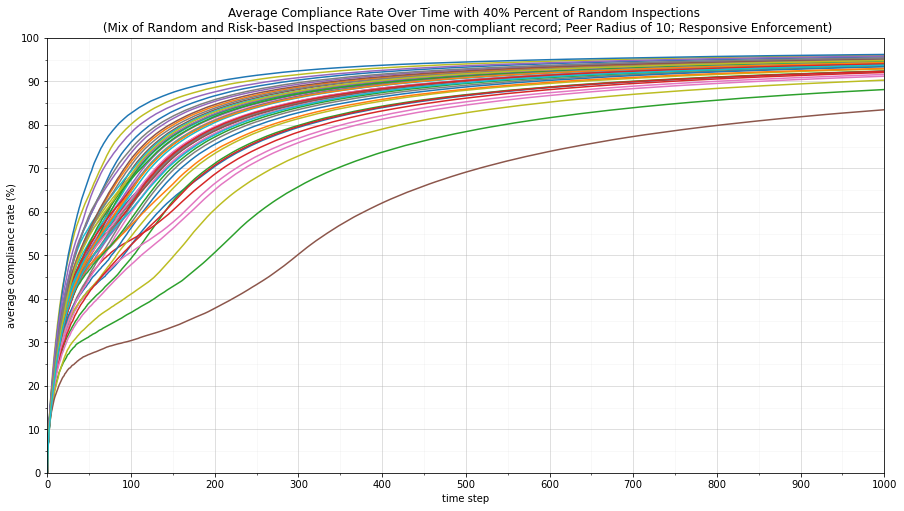

<Figure size 432x288 with 0 Axes>

In [102]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_40_1['step'],mixnoncomp_resp_sharerandinsp_40_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_2['step'],mixnoncomp_resp_sharerandinsp_40_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_3['step'],mixnoncomp_resp_sharerandinsp_40_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_4['step'],mixnoncomp_resp_sharerandinsp_40_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_5['step'],mixnoncomp_resp_sharerandinsp_40_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_6['step'],mixnoncomp_resp_sharerandinsp_40_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_7['step'],mixnoncomp_resp_sharerandinsp_40_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_8['step'],mixnoncomp_resp_sharerandinsp_40_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_9['step'],mixnoncomp_resp_sharerandinsp_40_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_10['step'],mixnoncomp_resp_sharerandinsp_40_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_11['step'],mixnoncomp_resp_sharerandinsp_40_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_12['step'],mixnoncomp_resp_sharerandinsp_40_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_13['step'],mixnoncomp_resp_sharerandinsp_40_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_14['step'],mixnoncomp_resp_sharerandinsp_40_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_15['step'],mixnoncomp_resp_sharerandinsp_40_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_16['step'],mixnoncomp_resp_sharerandinsp_40_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_17['step'],mixnoncomp_resp_sharerandinsp_40_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_18['step'],mixnoncomp_resp_sharerandinsp_40_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_19['step'],mixnoncomp_resp_sharerandinsp_40_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_20['step'],mixnoncomp_resp_sharerandinsp_40_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_21['step'],mixnoncomp_resp_sharerandinsp_40_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_22['step'],mixnoncomp_resp_sharerandinsp_40_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_23['step'],mixnoncomp_resp_sharerandinsp_40_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_24['step'],mixnoncomp_resp_sharerandinsp_40_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_25['step'],mixnoncomp_resp_sharerandinsp_40_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_26['step'],mixnoncomp_resp_sharerandinsp_40_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_27['step'],mixnoncomp_resp_sharerandinsp_40_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_28['step'],mixnoncomp_resp_sharerandinsp_40_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_29['step'],mixnoncomp_resp_sharerandinsp_40_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_30['step'],mixnoncomp_resp_sharerandinsp_40_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_31['step'],mixnoncomp_resp_sharerandinsp_40_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_32['step'],mixnoncomp_resp_sharerandinsp_40_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_33['step'],mixnoncomp_resp_sharerandinsp_40_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_34['step'],mixnoncomp_resp_sharerandinsp_40_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_35['step'],mixnoncomp_resp_sharerandinsp_40_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_36['step'],mixnoncomp_resp_sharerandinsp_40_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_37['step'],mixnoncomp_resp_sharerandinsp_40_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_38['step'],mixnoncomp_resp_sharerandinsp_40_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_39['step'],mixnoncomp_resp_sharerandinsp_40_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_40['step'],mixnoncomp_resp_sharerandinsp_40_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_41['step'],mixnoncomp_resp_sharerandinsp_40_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_42['step'],mixnoncomp_resp_sharerandinsp_40_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_43['step'],mixnoncomp_resp_sharerandinsp_40_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_44['step'],mixnoncomp_resp_sharerandinsp_40_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_45['step'],mixnoncomp_resp_sharerandinsp_40_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_46['step'],mixnoncomp_resp_sharerandinsp_40_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_47['step'],mixnoncomp_resp_sharerandinsp_40_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_48['step'],mixnoncomp_resp_sharerandinsp_40_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_49['step'],mixnoncomp_resp_sharerandinsp_40_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_50['step'],mixnoncomp_resp_sharerandinsp_40_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 40% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections40_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

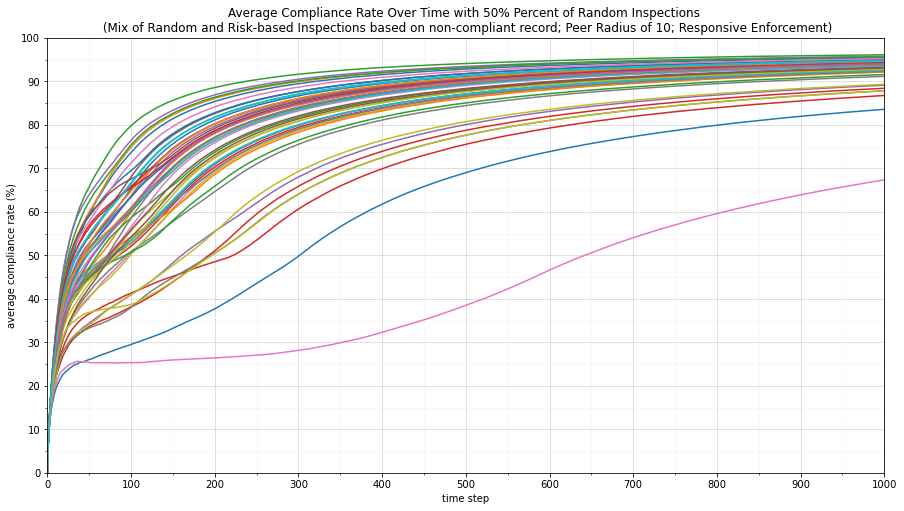

<Figure size 432x288 with 0 Axes>

In [103]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_50_1['step'],mixnoncomp_resp_sharerandinsp_50_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_2['step'],mixnoncomp_resp_sharerandinsp_50_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_3['step'],mixnoncomp_resp_sharerandinsp_50_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_4['step'],mixnoncomp_resp_sharerandinsp_50_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_5['step'],mixnoncomp_resp_sharerandinsp_50_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_6['step'],mixnoncomp_resp_sharerandinsp_50_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_7['step'],mixnoncomp_resp_sharerandinsp_50_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_8['step'],mixnoncomp_resp_sharerandinsp_50_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_9['step'],mixnoncomp_resp_sharerandinsp_50_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_10['step'],mixnoncomp_resp_sharerandinsp_50_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_11['step'],mixnoncomp_resp_sharerandinsp_50_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_12['step'],mixnoncomp_resp_sharerandinsp_50_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_13['step'],mixnoncomp_resp_sharerandinsp_50_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_14['step'],mixnoncomp_resp_sharerandinsp_50_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_15['step'],mixnoncomp_resp_sharerandinsp_50_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_16['step'],mixnoncomp_resp_sharerandinsp_50_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_17['step'],mixnoncomp_resp_sharerandinsp_50_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_18['step'],mixnoncomp_resp_sharerandinsp_50_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_19['step'],mixnoncomp_resp_sharerandinsp_50_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_20['step'],mixnoncomp_resp_sharerandinsp_50_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_21['step'],mixnoncomp_resp_sharerandinsp_50_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_22['step'],mixnoncomp_resp_sharerandinsp_50_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_23['step'],mixnoncomp_resp_sharerandinsp_50_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_24['step'],mixnoncomp_resp_sharerandinsp_50_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_25['step'],mixnoncomp_resp_sharerandinsp_50_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_26['step'],mixnoncomp_resp_sharerandinsp_50_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_27['step'],mixnoncomp_resp_sharerandinsp_50_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_28['step'],mixnoncomp_resp_sharerandinsp_50_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_29['step'],mixnoncomp_resp_sharerandinsp_50_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_30['step'],mixnoncomp_resp_sharerandinsp_50_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_31['step'],mixnoncomp_resp_sharerandinsp_50_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_32['step'],mixnoncomp_resp_sharerandinsp_50_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_33['step'],mixnoncomp_resp_sharerandinsp_50_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_34['step'],mixnoncomp_resp_sharerandinsp_50_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_35['step'],mixnoncomp_resp_sharerandinsp_50_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_36['step'],mixnoncomp_resp_sharerandinsp_50_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_37['step'],mixnoncomp_resp_sharerandinsp_50_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_38['step'],mixnoncomp_resp_sharerandinsp_50_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_39['step'],mixnoncomp_resp_sharerandinsp_50_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_40['step'],mixnoncomp_resp_sharerandinsp_50_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_41['step'],mixnoncomp_resp_sharerandinsp_50_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_42['step'],mixnoncomp_resp_sharerandinsp_50_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_43['step'],mixnoncomp_resp_sharerandinsp_50_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_44['step'],mixnoncomp_resp_sharerandinsp_50_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_45['step'],mixnoncomp_resp_sharerandinsp_50_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_46['step'],mixnoncomp_resp_sharerandinsp_50_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_47['step'],mixnoncomp_resp_sharerandinsp_50_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_48['step'],mixnoncomp_resp_sharerandinsp_50_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_49['step'],mixnoncomp_resp_sharerandinsp_50_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_50['step'],mixnoncomp_resp_sharerandinsp_50_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 50% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections50_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

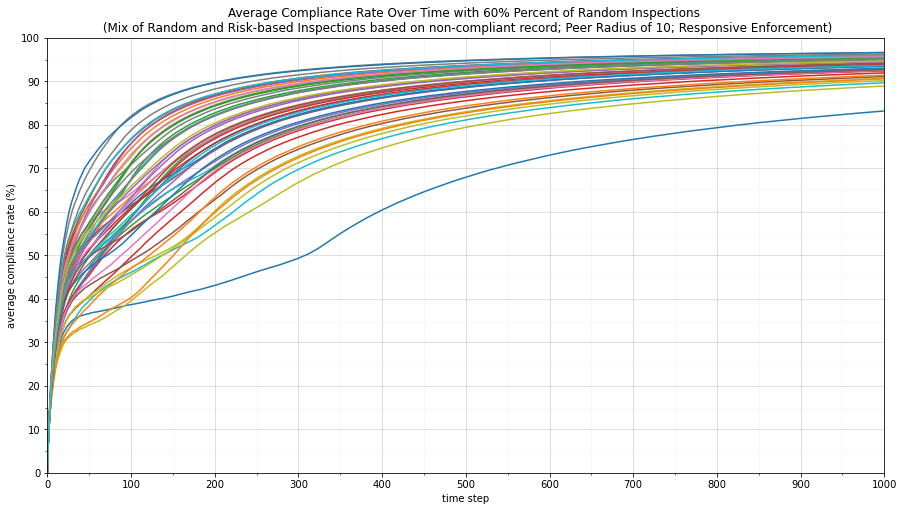

<Figure size 432x288 with 0 Axes>

In [104]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_60_1['step'],mixnoncomp_resp_sharerandinsp_60_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_2['step'],mixnoncomp_resp_sharerandinsp_60_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_3['step'],mixnoncomp_resp_sharerandinsp_60_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_4['step'],mixnoncomp_resp_sharerandinsp_60_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_5['step'],mixnoncomp_resp_sharerandinsp_60_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_6['step'],mixnoncomp_resp_sharerandinsp_60_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_7['step'],mixnoncomp_resp_sharerandinsp_60_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_8['step'],mixnoncomp_resp_sharerandinsp_60_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_9['step'],mixnoncomp_resp_sharerandinsp_60_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_10['step'],mixnoncomp_resp_sharerandinsp_60_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_11['step'],mixnoncomp_resp_sharerandinsp_60_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_12['step'],mixnoncomp_resp_sharerandinsp_60_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_13['step'],mixnoncomp_resp_sharerandinsp_60_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_14['step'],mixnoncomp_resp_sharerandinsp_60_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_15['step'],mixnoncomp_resp_sharerandinsp_60_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_16['step'],mixnoncomp_resp_sharerandinsp_60_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_17['step'],mixnoncomp_resp_sharerandinsp_60_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_18['step'],mixnoncomp_resp_sharerandinsp_60_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_19['step'],mixnoncomp_resp_sharerandinsp_60_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_20['step'],mixnoncomp_resp_sharerandinsp_60_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_21['step'],mixnoncomp_resp_sharerandinsp_60_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_22['step'],mixnoncomp_resp_sharerandinsp_60_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_23['step'],mixnoncomp_resp_sharerandinsp_60_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_24['step'],mixnoncomp_resp_sharerandinsp_60_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_25['step'],mixnoncomp_resp_sharerandinsp_60_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_26['step'],mixnoncomp_resp_sharerandinsp_60_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_27['step'],mixnoncomp_resp_sharerandinsp_60_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_28['step'],mixnoncomp_resp_sharerandinsp_60_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_29['step'],mixnoncomp_resp_sharerandinsp_60_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_30['step'],mixnoncomp_resp_sharerandinsp_60_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_31['step'],mixnoncomp_resp_sharerandinsp_60_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_32['step'],mixnoncomp_resp_sharerandinsp_60_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_33['step'],mixnoncomp_resp_sharerandinsp_60_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_34['step'],mixnoncomp_resp_sharerandinsp_60_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_35['step'],mixnoncomp_resp_sharerandinsp_60_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_36['step'],mixnoncomp_resp_sharerandinsp_60_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_37['step'],mixnoncomp_resp_sharerandinsp_60_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_38['step'],mixnoncomp_resp_sharerandinsp_60_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_39['step'],mixnoncomp_resp_sharerandinsp_60_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_40['step'],mixnoncomp_resp_sharerandinsp_60_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_41['step'],mixnoncomp_resp_sharerandinsp_60_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_42['step'],mixnoncomp_resp_sharerandinsp_60_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_43['step'],mixnoncomp_resp_sharerandinsp_60_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_44['step'],mixnoncomp_resp_sharerandinsp_60_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_45['step'],mixnoncomp_resp_sharerandinsp_60_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_46['step'],mixnoncomp_resp_sharerandinsp_60_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_47['step'],mixnoncomp_resp_sharerandinsp_60_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_48['step'],mixnoncomp_resp_sharerandinsp_60_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_49['step'],mixnoncomp_resp_sharerandinsp_60_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_50['step'],mixnoncomp_resp_sharerandinsp_60_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 60% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections60_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

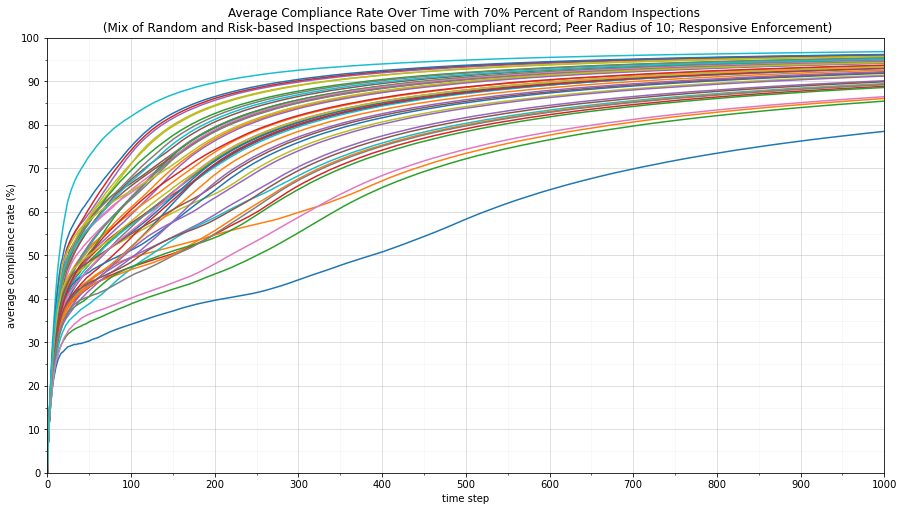

<Figure size 432x288 with 0 Axes>

In [106]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_70_1['step'],mixnoncomp_resp_sharerandinsp_70_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_2['step'],mixnoncomp_resp_sharerandinsp_70_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_3['step'],mixnoncomp_resp_sharerandinsp_70_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_4['step'],mixnoncomp_resp_sharerandinsp_70_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_5['step'],mixnoncomp_resp_sharerandinsp_70_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_6['step'],mixnoncomp_resp_sharerandinsp_70_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_7['step'],mixnoncomp_resp_sharerandinsp_70_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_8['step'],mixnoncomp_resp_sharerandinsp_70_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_9['step'],mixnoncomp_resp_sharerandinsp_70_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_10['step'],mixnoncomp_resp_sharerandinsp_70_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_11['step'],mixnoncomp_resp_sharerandinsp_70_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_12['step'],mixnoncomp_resp_sharerandinsp_70_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_13['step'],mixnoncomp_resp_sharerandinsp_70_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_14['step'],mixnoncomp_resp_sharerandinsp_70_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_15['step'],mixnoncomp_resp_sharerandinsp_70_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_16['step'],mixnoncomp_resp_sharerandinsp_70_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_17['step'],mixnoncomp_resp_sharerandinsp_70_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_18['step'],mixnoncomp_resp_sharerandinsp_70_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_19['step'],mixnoncomp_resp_sharerandinsp_70_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_20['step'],mixnoncomp_resp_sharerandinsp_70_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_21['step'],mixnoncomp_resp_sharerandinsp_70_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_22['step'],mixnoncomp_resp_sharerandinsp_70_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_23['step'],mixnoncomp_resp_sharerandinsp_70_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_24['step'],mixnoncomp_resp_sharerandinsp_70_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_25['step'],mixnoncomp_resp_sharerandinsp_70_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_26['step'],mixnoncomp_resp_sharerandinsp_70_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_27['step'],mixnoncomp_resp_sharerandinsp_70_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_28['step'],mixnoncomp_resp_sharerandinsp_70_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_29['step'],mixnoncomp_resp_sharerandinsp_70_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_30['step'],mixnoncomp_resp_sharerandinsp_70_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_31['step'],mixnoncomp_resp_sharerandinsp_70_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_32['step'],mixnoncomp_resp_sharerandinsp_70_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_33['step'],mixnoncomp_resp_sharerandinsp_70_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_34['step'],mixnoncomp_resp_sharerandinsp_70_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_35['step'],mixnoncomp_resp_sharerandinsp_70_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_36['step'],mixnoncomp_resp_sharerandinsp_70_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_37['step'],mixnoncomp_resp_sharerandinsp_70_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_38['step'],mixnoncomp_resp_sharerandinsp_70_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_39['step'],mixnoncomp_resp_sharerandinsp_70_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_40['step'],mixnoncomp_resp_sharerandinsp_70_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_41['step'],mixnoncomp_resp_sharerandinsp_70_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_42['step'],mixnoncomp_resp_sharerandinsp_70_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_43['step'],mixnoncomp_resp_sharerandinsp_70_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_44['step'],mixnoncomp_resp_sharerandinsp_70_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_45['step'],mixnoncomp_resp_sharerandinsp_70_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_46['step'],mixnoncomp_resp_sharerandinsp_70_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_47['step'],mixnoncomp_resp_sharerandinsp_70_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_48['step'],mixnoncomp_resp_sharerandinsp_70_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_49['step'],mixnoncomp_resp_sharerandinsp_70_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_50['step'],mixnoncomp_resp_sharerandinsp_70_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 70% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections70_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

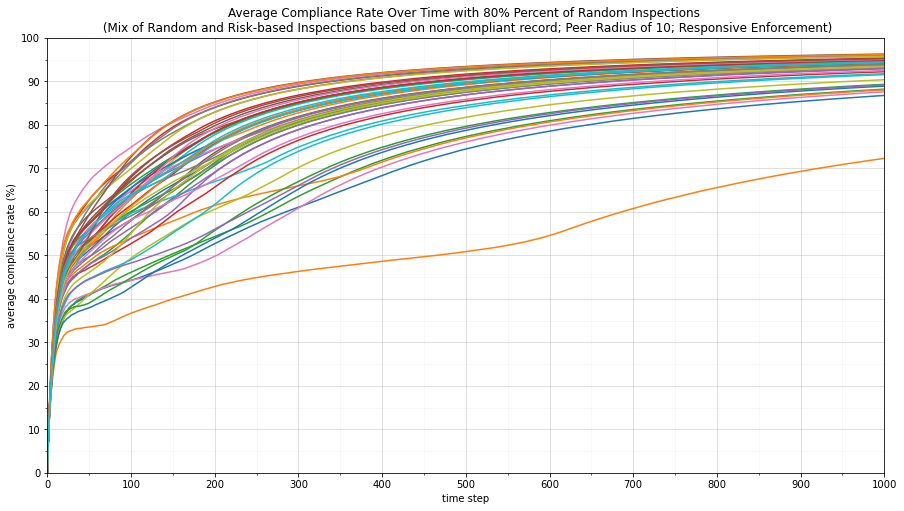

<Figure size 432x288 with 0 Axes>

In [107]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_80_1['step'],mixnoncomp_resp_sharerandinsp_80_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_2['step'],mixnoncomp_resp_sharerandinsp_80_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_3['step'],mixnoncomp_resp_sharerandinsp_80_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_4['step'],mixnoncomp_resp_sharerandinsp_80_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_5['step'],mixnoncomp_resp_sharerandinsp_80_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_6['step'],mixnoncomp_resp_sharerandinsp_80_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_7['step'],mixnoncomp_resp_sharerandinsp_80_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_8['step'],mixnoncomp_resp_sharerandinsp_80_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_9['step'],mixnoncomp_resp_sharerandinsp_80_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_10['step'],mixnoncomp_resp_sharerandinsp_80_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_11['step'],mixnoncomp_resp_sharerandinsp_80_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_12['step'],mixnoncomp_resp_sharerandinsp_80_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_13['step'],mixnoncomp_resp_sharerandinsp_80_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_14['step'],mixnoncomp_resp_sharerandinsp_80_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_15['step'],mixnoncomp_resp_sharerandinsp_80_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_16['step'],mixnoncomp_resp_sharerandinsp_80_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_17['step'],mixnoncomp_resp_sharerandinsp_80_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_18['step'],mixnoncomp_resp_sharerandinsp_80_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_19['step'],mixnoncomp_resp_sharerandinsp_80_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_20['step'],mixnoncomp_resp_sharerandinsp_80_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_21['step'],mixnoncomp_resp_sharerandinsp_80_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_22['step'],mixnoncomp_resp_sharerandinsp_80_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_23['step'],mixnoncomp_resp_sharerandinsp_80_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_24['step'],mixnoncomp_resp_sharerandinsp_80_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_25['step'],mixnoncomp_resp_sharerandinsp_80_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_26['step'],mixnoncomp_resp_sharerandinsp_80_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_27['step'],mixnoncomp_resp_sharerandinsp_80_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_28['step'],mixnoncomp_resp_sharerandinsp_80_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_29['step'],mixnoncomp_resp_sharerandinsp_80_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_30['step'],mixnoncomp_resp_sharerandinsp_80_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_31['step'],mixnoncomp_resp_sharerandinsp_80_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_32['step'],mixnoncomp_resp_sharerandinsp_80_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_33['step'],mixnoncomp_resp_sharerandinsp_80_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_34['step'],mixnoncomp_resp_sharerandinsp_80_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_35['step'],mixnoncomp_resp_sharerandinsp_80_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_36['step'],mixnoncomp_resp_sharerandinsp_80_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_37['step'],mixnoncomp_resp_sharerandinsp_80_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_38['step'],mixnoncomp_resp_sharerandinsp_80_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_39['step'],mixnoncomp_resp_sharerandinsp_80_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_40['step'],mixnoncomp_resp_sharerandinsp_80_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_41['step'],mixnoncomp_resp_sharerandinsp_80_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_42['step'],mixnoncomp_resp_sharerandinsp_80_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_43['step'],mixnoncomp_resp_sharerandinsp_80_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_44['step'],mixnoncomp_resp_sharerandinsp_80_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_45['step'],mixnoncomp_resp_sharerandinsp_80_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_46['step'],mixnoncomp_resp_sharerandinsp_80_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_47['step'],mixnoncomp_resp_sharerandinsp_80_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_48['step'],mixnoncomp_resp_sharerandinsp_80_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_49['step'],mixnoncomp_resp_sharerandinsp_80_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_50['step'],mixnoncomp_resp_sharerandinsp_80_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 80% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections80_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

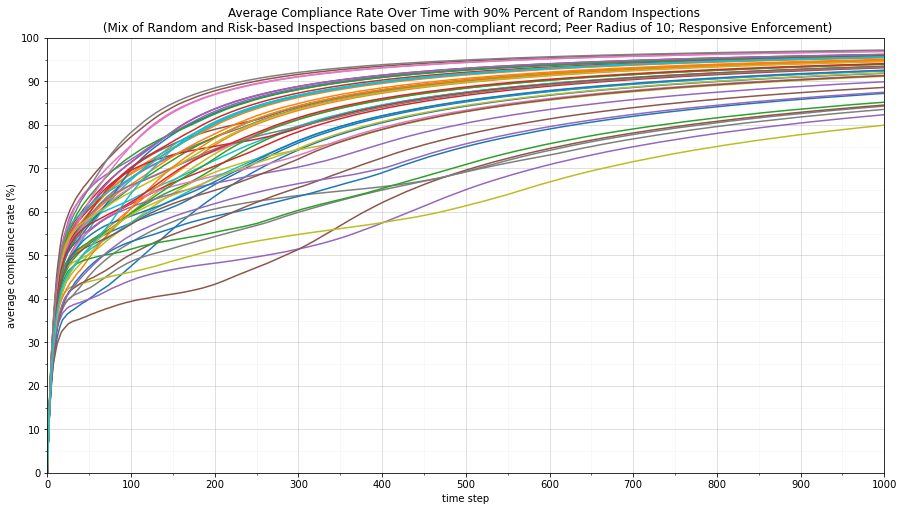

<Figure size 432x288 with 0 Axes>

In [108]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_90_1['step'],mixnoncomp_resp_sharerandinsp_90_1['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_2['step'],mixnoncomp_resp_sharerandinsp_90_2['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_3['step'],mixnoncomp_resp_sharerandinsp_90_3['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_4['step'],mixnoncomp_resp_sharerandinsp_90_4['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_5['step'],mixnoncomp_resp_sharerandinsp_90_5['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_6['step'],mixnoncomp_resp_sharerandinsp_90_6['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_7['step'],mixnoncomp_resp_sharerandinsp_90_7['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_8['step'],mixnoncomp_resp_sharerandinsp_90_8['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_9['step'],mixnoncomp_resp_sharerandinsp_90_9['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_10['step'],mixnoncomp_resp_sharerandinsp_90_10['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_11['step'],mixnoncomp_resp_sharerandinsp_90_11['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_12['step'],mixnoncomp_resp_sharerandinsp_90_12['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_13['step'],mixnoncomp_resp_sharerandinsp_90_13['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_14['step'],mixnoncomp_resp_sharerandinsp_90_14['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_15['step'],mixnoncomp_resp_sharerandinsp_90_15['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_16['step'],mixnoncomp_resp_sharerandinsp_90_16['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_17['step'],mixnoncomp_resp_sharerandinsp_90_17['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_18['step'],mixnoncomp_resp_sharerandinsp_90_18['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_19['step'],mixnoncomp_resp_sharerandinsp_90_19['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_20['step'],mixnoncomp_resp_sharerandinsp_90_20['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_21['step'],mixnoncomp_resp_sharerandinsp_90_21['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_22['step'],mixnoncomp_resp_sharerandinsp_90_22['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_23['step'],mixnoncomp_resp_sharerandinsp_90_23['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_24['step'],mixnoncomp_resp_sharerandinsp_90_24['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_25['step'],mixnoncomp_resp_sharerandinsp_90_25['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_26['step'],mixnoncomp_resp_sharerandinsp_90_26['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_27['step'],mixnoncomp_resp_sharerandinsp_90_27['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_28['step'],mixnoncomp_resp_sharerandinsp_90_28['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_29['step'],mixnoncomp_resp_sharerandinsp_90_29['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_30['step'],mixnoncomp_resp_sharerandinsp_90_30['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_31['step'],mixnoncomp_resp_sharerandinsp_90_31['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_32['step'],mixnoncomp_resp_sharerandinsp_90_32['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_33['step'],mixnoncomp_resp_sharerandinsp_90_33['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_34['step'],mixnoncomp_resp_sharerandinsp_90_34['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_35['step'],mixnoncomp_resp_sharerandinsp_90_35['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_36['step'],mixnoncomp_resp_sharerandinsp_90_36['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_37['step'],mixnoncomp_resp_sharerandinsp_90_37['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_38['step'],mixnoncomp_resp_sharerandinsp_90_38['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_39['step'],mixnoncomp_resp_sharerandinsp_90_39['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_40['step'],mixnoncomp_resp_sharerandinsp_90_40['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_41['step'],mixnoncomp_resp_sharerandinsp_90_41['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_42['step'],mixnoncomp_resp_sharerandinsp_90_42['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_43['step'],mixnoncomp_resp_sharerandinsp_90_43['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_44['step'],mixnoncomp_resp_sharerandinsp_90_44['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_45['step'],mixnoncomp_resp_sharerandinsp_90_45['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_46['step'],mixnoncomp_resp_sharerandinsp_90_46['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_47['step'],mixnoncomp_resp_sharerandinsp_90_47['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_48['step'],mixnoncomp_resp_sharerandinsp_90_48['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_49['step'],mixnoncomp_resp_sharerandinsp_90_49['avg-compliance-rate'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_50['step'],mixnoncomp_resp_sharerandinsp_90_50['avg-compliance-rate'])


plt.title("Average Compliance Rate Over Time with 90% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('average compliance rate (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections90_ Time vs Avg Compliance All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

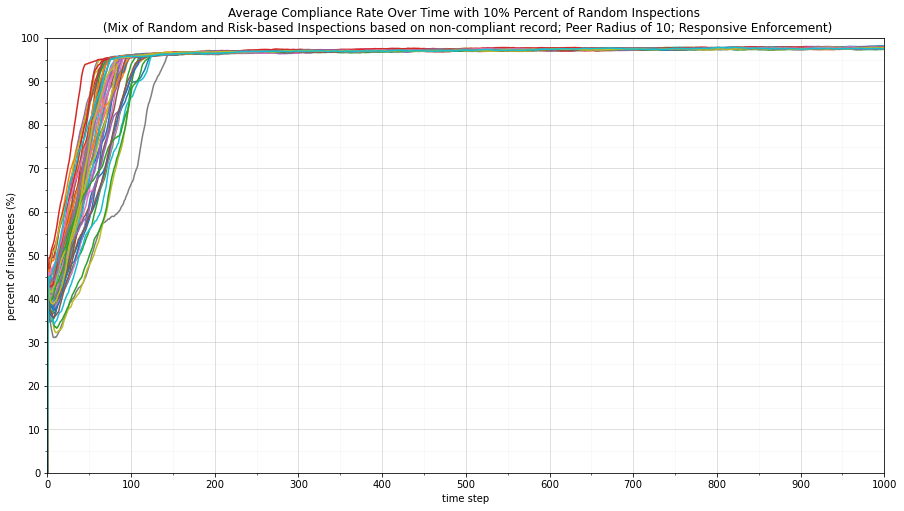

<Figure size 432x288 with 0 Axes>

In [109]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_10_1['step'],mixnoncomp_resp_sharerandinsp_10_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_2['step'],mixnoncomp_resp_sharerandinsp_10_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_3['step'],mixnoncomp_resp_sharerandinsp_10_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_4['step'],mixnoncomp_resp_sharerandinsp_10_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_5['step'],mixnoncomp_resp_sharerandinsp_10_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_6['step'],mixnoncomp_resp_sharerandinsp_10_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_7['step'],mixnoncomp_resp_sharerandinsp_10_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_8['step'],mixnoncomp_resp_sharerandinsp_10_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_9['step'],mixnoncomp_resp_sharerandinsp_10_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_10['step'],mixnoncomp_resp_sharerandinsp_10_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_11['step'],mixnoncomp_resp_sharerandinsp_10_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_12['step'],mixnoncomp_resp_sharerandinsp_10_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_13['step'],mixnoncomp_resp_sharerandinsp_10_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_14['step'],mixnoncomp_resp_sharerandinsp_10_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_15['step'],mixnoncomp_resp_sharerandinsp_10_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_16['step'],mixnoncomp_resp_sharerandinsp_10_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_17['step'],mixnoncomp_resp_sharerandinsp_10_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_18['step'],mixnoncomp_resp_sharerandinsp_10_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_19['step'],mixnoncomp_resp_sharerandinsp_10_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_20['step'],mixnoncomp_resp_sharerandinsp_10_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_21['step'],mixnoncomp_resp_sharerandinsp_10_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_22['step'],mixnoncomp_resp_sharerandinsp_10_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_23['step'],mixnoncomp_resp_sharerandinsp_10_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_24['step'],mixnoncomp_resp_sharerandinsp_10_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_25['step'],mixnoncomp_resp_sharerandinsp_10_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_26['step'],mixnoncomp_resp_sharerandinsp_10_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_27['step'],mixnoncomp_resp_sharerandinsp_10_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_28['step'],mixnoncomp_resp_sharerandinsp_10_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_29['step'],mixnoncomp_resp_sharerandinsp_10_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_30['step'],mixnoncomp_resp_sharerandinsp_10_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_31['step'],mixnoncomp_resp_sharerandinsp_10_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_32['step'],mixnoncomp_resp_sharerandinsp_10_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_33['step'],mixnoncomp_resp_sharerandinsp_10_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_34['step'],mixnoncomp_resp_sharerandinsp_10_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_35['step'],mixnoncomp_resp_sharerandinsp_10_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_36['step'],mixnoncomp_resp_sharerandinsp_10_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_37['step'],mixnoncomp_resp_sharerandinsp_10_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_38['step'],mixnoncomp_resp_sharerandinsp_10_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_39['step'],mixnoncomp_resp_sharerandinsp_10_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_40['step'],mixnoncomp_resp_sharerandinsp_10_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_41['step'],mixnoncomp_resp_sharerandinsp_10_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_42['step'],mixnoncomp_resp_sharerandinsp_10_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_43['step'],mixnoncomp_resp_sharerandinsp_10_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_44['step'],mixnoncomp_resp_sharerandinsp_10_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_45['step'],mixnoncomp_resp_sharerandinsp_10_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_46['step'],mixnoncomp_resp_sharerandinsp_10_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_47['step'],mixnoncomp_resp_sharerandinsp_10_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_48['step'],mixnoncomp_resp_sharerandinsp_10_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_49['step'],mixnoncomp_resp_sharerandinsp_10_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_10_50['step'],mixnoncomp_resp_sharerandinsp_10_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 10% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections10- Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

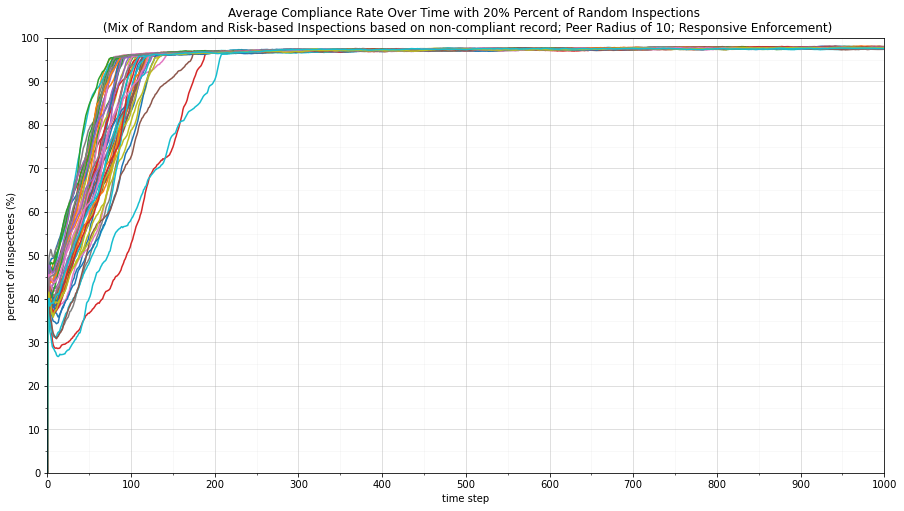

<Figure size 432x288 with 0 Axes>

In [110]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_20_1['step'],mixnoncomp_resp_sharerandinsp_20_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_2['step'],mixnoncomp_resp_sharerandinsp_20_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_3['step'],mixnoncomp_resp_sharerandinsp_20_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_4['step'],mixnoncomp_resp_sharerandinsp_20_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_5['step'],mixnoncomp_resp_sharerandinsp_20_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_6['step'],mixnoncomp_resp_sharerandinsp_20_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_7['step'],mixnoncomp_resp_sharerandinsp_20_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_8['step'],mixnoncomp_resp_sharerandinsp_20_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_9['step'],mixnoncomp_resp_sharerandinsp_20_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_10['step'],mixnoncomp_resp_sharerandinsp_20_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_11['step'],mixnoncomp_resp_sharerandinsp_20_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_12['step'],mixnoncomp_resp_sharerandinsp_20_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_13['step'],mixnoncomp_resp_sharerandinsp_20_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_14['step'],mixnoncomp_resp_sharerandinsp_20_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_15['step'],mixnoncomp_resp_sharerandinsp_20_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_16['step'],mixnoncomp_resp_sharerandinsp_20_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_17['step'],mixnoncomp_resp_sharerandinsp_20_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_18['step'],mixnoncomp_resp_sharerandinsp_20_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_19['step'],mixnoncomp_resp_sharerandinsp_20_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_20['step'],mixnoncomp_resp_sharerandinsp_20_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_21['step'],mixnoncomp_resp_sharerandinsp_20_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_22['step'],mixnoncomp_resp_sharerandinsp_20_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_23['step'],mixnoncomp_resp_sharerandinsp_20_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_24['step'],mixnoncomp_resp_sharerandinsp_20_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_25['step'],mixnoncomp_resp_sharerandinsp_20_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_26['step'],mixnoncomp_resp_sharerandinsp_20_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_27['step'],mixnoncomp_resp_sharerandinsp_20_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_28['step'],mixnoncomp_resp_sharerandinsp_20_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_29['step'],mixnoncomp_resp_sharerandinsp_20_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_30['step'],mixnoncomp_resp_sharerandinsp_20_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_31['step'],mixnoncomp_resp_sharerandinsp_20_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_32['step'],mixnoncomp_resp_sharerandinsp_20_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_33['step'],mixnoncomp_resp_sharerandinsp_20_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_34['step'],mixnoncomp_resp_sharerandinsp_20_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_35['step'],mixnoncomp_resp_sharerandinsp_20_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_36['step'],mixnoncomp_resp_sharerandinsp_20_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_37['step'],mixnoncomp_resp_sharerandinsp_20_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_38['step'],mixnoncomp_resp_sharerandinsp_20_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_39['step'],mixnoncomp_resp_sharerandinsp_20_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_40['step'],mixnoncomp_resp_sharerandinsp_20_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_41['step'],mixnoncomp_resp_sharerandinsp_20_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_42['step'],mixnoncomp_resp_sharerandinsp_20_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_43['step'],mixnoncomp_resp_sharerandinsp_20_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_44['step'],mixnoncomp_resp_sharerandinsp_20_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_45['step'],mixnoncomp_resp_sharerandinsp_20_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_46['step'],mixnoncomp_resp_sharerandinsp_20_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_47['step'],mixnoncomp_resp_sharerandinsp_20_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_48['step'],mixnoncomp_resp_sharerandinsp_20_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_49['step'],mixnoncomp_resp_sharerandinsp_20_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_20_50['step'],mixnoncomp_resp_sharerandinsp_20_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 20% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections20_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

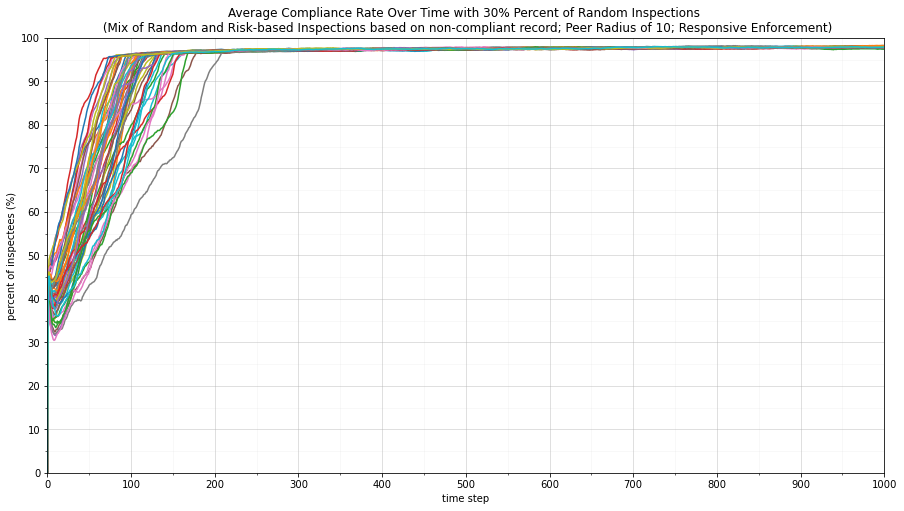

<Figure size 432x288 with 0 Axes>

In [111]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_30_1['step'],mixnoncomp_resp_sharerandinsp_30_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_2['step'],mixnoncomp_resp_sharerandinsp_30_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_3['step'],mixnoncomp_resp_sharerandinsp_30_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_4['step'],mixnoncomp_resp_sharerandinsp_30_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_5['step'],mixnoncomp_resp_sharerandinsp_30_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_6['step'],mixnoncomp_resp_sharerandinsp_30_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_7['step'],mixnoncomp_resp_sharerandinsp_30_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_8['step'],mixnoncomp_resp_sharerandinsp_30_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_9['step'],mixnoncomp_resp_sharerandinsp_30_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_10['step'],mixnoncomp_resp_sharerandinsp_30_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_11['step'],mixnoncomp_resp_sharerandinsp_30_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_12['step'],mixnoncomp_resp_sharerandinsp_30_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_13['step'],mixnoncomp_resp_sharerandinsp_30_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_14['step'],mixnoncomp_resp_sharerandinsp_30_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_15['step'],mixnoncomp_resp_sharerandinsp_30_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_16['step'],mixnoncomp_resp_sharerandinsp_30_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_17['step'],mixnoncomp_resp_sharerandinsp_30_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_18['step'],mixnoncomp_resp_sharerandinsp_30_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_19['step'],mixnoncomp_resp_sharerandinsp_30_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_20['step'],mixnoncomp_resp_sharerandinsp_30_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_21['step'],mixnoncomp_resp_sharerandinsp_30_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_22['step'],mixnoncomp_resp_sharerandinsp_30_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_23['step'],mixnoncomp_resp_sharerandinsp_30_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_24['step'],mixnoncomp_resp_sharerandinsp_30_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_25['step'],mixnoncomp_resp_sharerandinsp_30_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_26['step'],mixnoncomp_resp_sharerandinsp_30_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_27['step'],mixnoncomp_resp_sharerandinsp_30_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_28['step'],mixnoncomp_resp_sharerandinsp_30_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_29['step'],mixnoncomp_resp_sharerandinsp_30_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_30['step'],mixnoncomp_resp_sharerandinsp_30_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_31['step'],mixnoncomp_resp_sharerandinsp_30_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_32['step'],mixnoncomp_resp_sharerandinsp_30_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_33['step'],mixnoncomp_resp_sharerandinsp_30_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_34['step'],mixnoncomp_resp_sharerandinsp_30_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_35['step'],mixnoncomp_resp_sharerandinsp_30_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_36['step'],mixnoncomp_resp_sharerandinsp_30_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_37['step'],mixnoncomp_resp_sharerandinsp_30_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_38['step'],mixnoncomp_resp_sharerandinsp_30_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_39['step'],mixnoncomp_resp_sharerandinsp_30_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_40['step'],mixnoncomp_resp_sharerandinsp_30_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_41['step'],mixnoncomp_resp_sharerandinsp_30_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_42['step'],mixnoncomp_resp_sharerandinsp_30_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_43['step'],mixnoncomp_resp_sharerandinsp_30_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_44['step'],mixnoncomp_resp_sharerandinsp_30_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_45['step'],mixnoncomp_resp_sharerandinsp_30_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_46['step'],mixnoncomp_resp_sharerandinsp_30_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_47['step'],mixnoncomp_resp_sharerandinsp_30_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_48['step'],mixnoncomp_resp_sharerandinsp_30_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_49['step'],mixnoncomp_resp_sharerandinsp_30_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_30_50['step'],mixnoncomp_resp_sharerandinsp_30_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 30% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections30_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

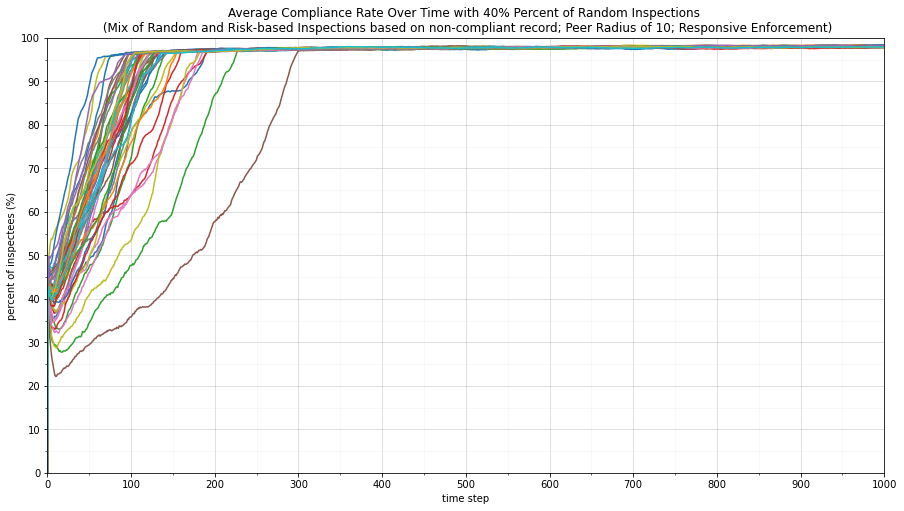

<Figure size 432x288 with 0 Axes>

In [112]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_40_1['step'],mixnoncomp_resp_sharerandinsp_40_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_2['step'],mixnoncomp_resp_sharerandinsp_40_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_3['step'],mixnoncomp_resp_sharerandinsp_40_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_4['step'],mixnoncomp_resp_sharerandinsp_40_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_5['step'],mixnoncomp_resp_sharerandinsp_40_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_6['step'],mixnoncomp_resp_sharerandinsp_40_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_7['step'],mixnoncomp_resp_sharerandinsp_40_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_8['step'],mixnoncomp_resp_sharerandinsp_40_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_9['step'],mixnoncomp_resp_sharerandinsp_40_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_10['step'],mixnoncomp_resp_sharerandinsp_40_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_11['step'],mixnoncomp_resp_sharerandinsp_40_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_12['step'],mixnoncomp_resp_sharerandinsp_40_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_13['step'],mixnoncomp_resp_sharerandinsp_40_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_14['step'],mixnoncomp_resp_sharerandinsp_40_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_15['step'],mixnoncomp_resp_sharerandinsp_40_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_16['step'],mixnoncomp_resp_sharerandinsp_40_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_17['step'],mixnoncomp_resp_sharerandinsp_40_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_18['step'],mixnoncomp_resp_sharerandinsp_40_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_19['step'],mixnoncomp_resp_sharerandinsp_40_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_20['step'],mixnoncomp_resp_sharerandinsp_40_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_21['step'],mixnoncomp_resp_sharerandinsp_40_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_22['step'],mixnoncomp_resp_sharerandinsp_40_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_23['step'],mixnoncomp_resp_sharerandinsp_40_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_24['step'],mixnoncomp_resp_sharerandinsp_40_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_25['step'],mixnoncomp_resp_sharerandinsp_40_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_26['step'],mixnoncomp_resp_sharerandinsp_40_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_27['step'],mixnoncomp_resp_sharerandinsp_40_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_28['step'],mixnoncomp_resp_sharerandinsp_40_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_29['step'],mixnoncomp_resp_sharerandinsp_40_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_30['step'],mixnoncomp_resp_sharerandinsp_40_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_31['step'],mixnoncomp_resp_sharerandinsp_40_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_32['step'],mixnoncomp_resp_sharerandinsp_40_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_33['step'],mixnoncomp_resp_sharerandinsp_40_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_34['step'],mixnoncomp_resp_sharerandinsp_40_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_35['step'],mixnoncomp_resp_sharerandinsp_40_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_36['step'],mixnoncomp_resp_sharerandinsp_40_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_37['step'],mixnoncomp_resp_sharerandinsp_40_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_38['step'],mixnoncomp_resp_sharerandinsp_40_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_39['step'],mixnoncomp_resp_sharerandinsp_40_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_40['step'],mixnoncomp_resp_sharerandinsp_40_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_41['step'],mixnoncomp_resp_sharerandinsp_40_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_42['step'],mixnoncomp_resp_sharerandinsp_40_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_43['step'],mixnoncomp_resp_sharerandinsp_40_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_44['step'],mixnoncomp_resp_sharerandinsp_40_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_45['step'],mixnoncomp_resp_sharerandinsp_40_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_46['step'],mixnoncomp_resp_sharerandinsp_40_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_47['step'],mixnoncomp_resp_sharerandinsp_40_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_48['step'],mixnoncomp_resp_sharerandinsp_40_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_49['step'],mixnoncomp_resp_sharerandinsp_40_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_40_50['step'],mixnoncomp_resp_sharerandinsp_40_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 40% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections40_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

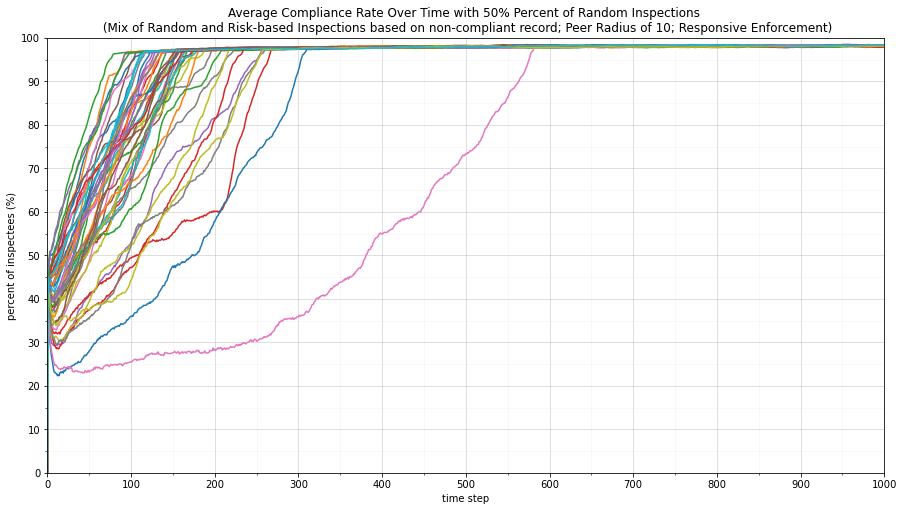

<Figure size 432x288 with 0 Axes>

In [113]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_50_1['step'],mixnoncomp_resp_sharerandinsp_50_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_2['step'],mixnoncomp_resp_sharerandinsp_50_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_3['step'],mixnoncomp_resp_sharerandinsp_50_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_4['step'],mixnoncomp_resp_sharerandinsp_50_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_5['step'],mixnoncomp_resp_sharerandinsp_50_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_6['step'],mixnoncomp_resp_sharerandinsp_50_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_7['step'],mixnoncomp_resp_sharerandinsp_50_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_8['step'],mixnoncomp_resp_sharerandinsp_50_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_9['step'],mixnoncomp_resp_sharerandinsp_50_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_10['step'],mixnoncomp_resp_sharerandinsp_50_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_11['step'],mixnoncomp_resp_sharerandinsp_50_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_12['step'],mixnoncomp_resp_sharerandinsp_50_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_13['step'],mixnoncomp_resp_sharerandinsp_50_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_14['step'],mixnoncomp_resp_sharerandinsp_50_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_15['step'],mixnoncomp_resp_sharerandinsp_50_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_16['step'],mixnoncomp_resp_sharerandinsp_50_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_17['step'],mixnoncomp_resp_sharerandinsp_50_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_18['step'],mixnoncomp_resp_sharerandinsp_50_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_19['step'],mixnoncomp_resp_sharerandinsp_50_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_20['step'],mixnoncomp_resp_sharerandinsp_50_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_21['step'],mixnoncomp_resp_sharerandinsp_50_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_22['step'],mixnoncomp_resp_sharerandinsp_50_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_23['step'],mixnoncomp_resp_sharerandinsp_50_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_24['step'],mixnoncomp_resp_sharerandinsp_50_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_25['step'],mixnoncomp_resp_sharerandinsp_50_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_26['step'],mixnoncomp_resp_sharerandinsp_50_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_27['step'],mixnoncomp_resp_sharerandinsp_50_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_28['step'],mixnoncomp_resp_sharerandinsp_50_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_29['step'],mixnoncomp_resp_sharerandinsp_50_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_30['step'],mixnoncomp_resp_sharerandinsp_50_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_31['step'],mixnoncomp_resp_sharerandinsp_50_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_32['step'],mixnoncomp_resp_sharerandinsp_50_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_33['step'],mixnoncomp_resp_sharerandinsp_50_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_34['step'],mixnoncomp_resp_sharerandinsp_50_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_35['step'],mixnoncomp_resp_sharerandinsp_50_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_36['step'],mixnoncomp_resp_sharerandinsp_50_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_37['step'],mixnoncomp_resp_sharerandinsp_50_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_38['step'],mixnoncomp_resp_sharerandinsp_50_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_39['step'],mixnoncomp_resp_sharerandinsp_50_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_40['step'],mixnoncomp_resp_sharerandinsp_50_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_41['step'],mixnoncomp_resp_sharerandinsp_50_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_42['step'],mixnoncomp_resp_sharerandinsp_50_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_43['step'],mixnoncomp_resp_sharerandinsp_50_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_44['step'],mixnoncomp_resp_sharerandinsp_50_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_45['step'],mixnoncomp_resp_sharerandinsp_50_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_46['step'],mixnoncomp_resp_sharerandinsp_50_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_47['step'],mixnoncomp_resp_sharerandinsp_50_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_48['step'],mixnoncomp_resp_sharerandinsp_50_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_49['step'],mixnoncomp_resp_sharerandinsp_50_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_50_50['step'],mixnoncomp_resp_sharerandinsp_50_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 50% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections50_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

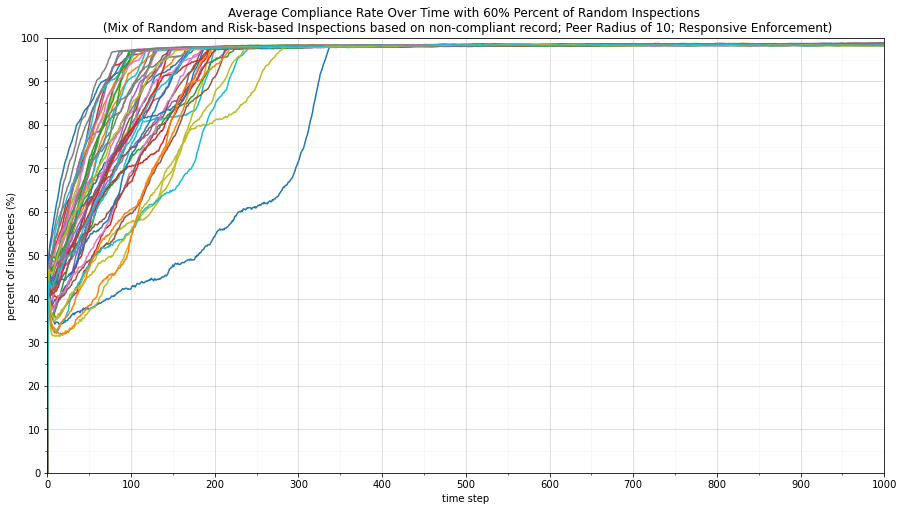

<Figure size 432x288 with 0 Axes>

In [114]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_60_1['step'],mixnoncomp_resp_sharerandinsp_60_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_2['step'],mixnoncomp_resp_sharerandinsp_60_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_3['step'],mixnoncomp_resp_sharerandinsp_60_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_4['step'],mixnoncomp_resp_sharerandinsp_60_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_5['step'],mixnoncomp_resp_sharerandinsp_60_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_6['step'],mixnoncomp_resp_sharerandinsp_60_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_7['step'],mixnoncomp_resp_sharerandinsp_60_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_8['step'],mixnoncomp_resp_sharerandinsp_60_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_9['step'],mixnoncomp_resp_sharerandinsp_60_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_10['step'],mixnoncomp_resp_sharerandinsp_60_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_11['step'],mixnoncomp_resp_sharerandinsp_60_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_12['step'],mixnoncomp_resp_sharerandinsp_60_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_13['step'],mixnoncomp_resp_sharerandinsp_60_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_14['step'],mixnoncomp_resp_sharerandinsp_60_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_15['step'],mixnoncomp_resp_sharerandinsp_60_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_16['step'],mixnoncomp_resp_sharerandinsp_60_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_17['step'],mixnoncomp_resp_sharerandinsp_60_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_18['step'],mixnoncomp_resp_sharerandinsp_60_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_19['step'],mixnoncomp_resp_sharerandinsp_60_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_20['step'],mixnoncomp_resp_sharerandinsp_60_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_21['step'],mixnoncomp_resp_sharerandinsp_60_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_22['step'],mixnoncomp_resp_sharerandinsp_60_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_23['step'],mixnoncomp_resp_sharerandinsp_60_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_24['step'],mixnoncomp_resp_sharerandinsp_60_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_25['step'],mixnoncomp_resp_sharerandinsp_60_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_26['step'],mixnoncomp_resp_sharerandinsp_60_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_27['step'],mixnoncomp_resp_sharerandinsp_60_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_28['step'],mixnoncomp_resp_sharerandinsp_60_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_29['step'],mixnoncomp_resp_sharerandinsp_60_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_30['step'],mixnoncomp_resp_sharerandinsp_60_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_31['step'],mixnoncomp_resp_sharerandinsp_60_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_32['step'],mixnoncomp_resp_sharerandinsp_60_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_33['step'],mixnoncomp_resp_sharerandinsp_60_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_34['step'],mixnoncomp_resp_sharerandinsp_60_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_35['step'],mixnoncomp_resp_sharerandinsp_60_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_36['step'],mixnoncomp_resp_sharerandinsp_60_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_37['step'],mixnoncomp_resp_sharerandinsp_60_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_38['step'],mixnoncomp_resp_sharerandinsp_60_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_39['step'],mixnoncomp_resp_sharerandinsp_60_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_40['step'],mixnoncomp_resp_sharerandinsp_60_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_41['step'],mixnoncomp_resp_sharerandinsp_60_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_42['step'],mixnoncomp_resp_sharerandinsp_60_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_43['step'],mixnoncomp_resp_sharerandinsp_60_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_44['step'],mixnoncomp_resp_sharerandinsp_60_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_45['step'],mixnoncomp_resp_sharerandinsp_60_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_46['step'],mixnoncomp_resp_sharerandinsp_60_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_47['step'],mixnoncomp_resp_sharerandinsp_60_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_48['step'],mixnoncomp_resp_sharerandinsp_60_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_49['step'],mixnoncomp_resp_sharerandinsp_60_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_60_50['step'],mixnoncomp_resp_sharerandinsp_60_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 60% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections60_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

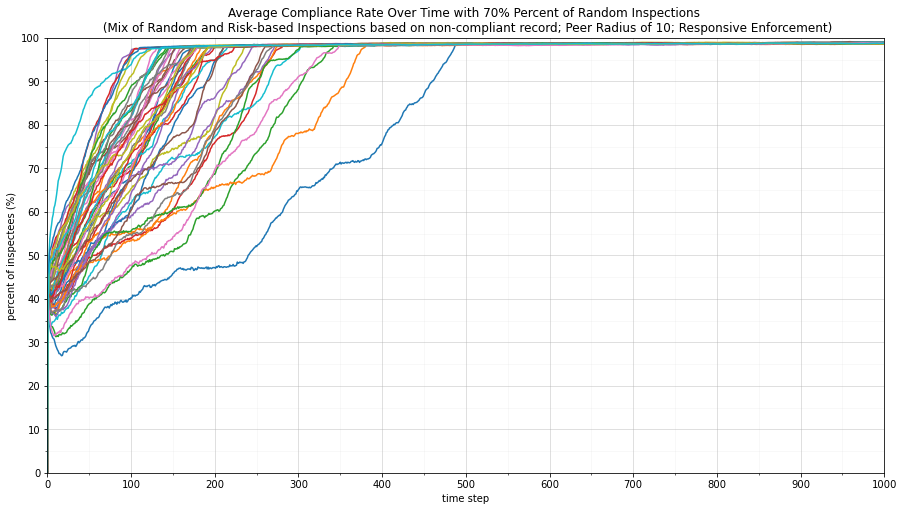

<Figure size 432x288 with 0 Axes>

In [115]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_70_1['step'],mixnoncomp_resp_sharerandinsp_70_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_2['step'],mixnoncomp_resp_sharerandinsp_70_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_3['step'],mixnoncomp_resp_sharerandinsp_70_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_4['step'],mixnoncomp_resp_sharerandinsp_70_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_5['step'],mixnoncomp_resp_sharerandinsp_70_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_6['step'],mixnoncomp_resp_sharerandinsp_70_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_7['step'],mixnoncomp_resp_sharerandinsp_70_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_8['step'],mixnoncomp_resp_sharerandinsp_70_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_9['step'],mixnoncomp_resp_sharerandinsp_70_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_10['step'],mixnoncomp_resp_sharerandinsp_70_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_11['step'],mixnoncomp_resp_sharerandinsp_70_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_12['step'],mixnoncomp_resp_sharerandinsp_70_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_13['step'],mixnoncomp_resp_sharerandinsp_70_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_14['step'],mixnoncomp_resp_sharerandinsp_70_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_15['step'],mixnoncomp_resp_sharerandinsp_70_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_16['step'],mixnoncomp_resp_sharerandinsp_70_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_17['step'],mixnoncomp_resp_sharerandinsp_70_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_18['step'],mixnoncomp_resp_sharerandinsp_70_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_19['step'],mixnoncomp_resp_sharerandinsp_70_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_20['step'],mixnoncomp_resp_sharerandinsp_70_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_21['step'],mixnoncomp_resp_sharerandinsp_70_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_22['step'],mixnoncomp_resp_sharerandinsp_70_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_23['step'],mixnoncomp_resp_sharerandinsp_70_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_24['step'],mixnoncomp_resp_sharerandinsp_70_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_25['step'],mixnoncomp_resp_sharerandinsp_70_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_26['step'],mixnoncomp_resp_sharerandinsp_70_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_27['step'],mixnoncomp_resp_sharerandinsp_70_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_28['step'],mixnoncomp_resp_sharerandinsp_70_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_29['step'],mixnoncomp_resp_sharerandinsp_70_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_30['step'],mixnoncomp_resp_sharerandinsp_70_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_31['step'],mixnoncomp_resp_sharerandinsp_70_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_32['step'],mixnoncomp_resp_sharerandinsp_70_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_33['step'],mixnoncomp_resp_sharerandinsp_70_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_34['step'],mixnoncomp_resp_sharerandinsp_70_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_35['step'],mixnoncomp_resp_sharerandinsp_70_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_36['step'],mixnoncomp_resp_sharerandinsp_70_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_37['step'],mixnoncomp_resp_sharerandinsp_70_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_38['step'],mixnoncomp_resp_sharerandinsp_70_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_39['step'],mixnoncomp_resp_sharerandinsp_70_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_40['step'],mixnoncomp_resp_sharerandinsp_70_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_41['step'],mixnoncomp_resp_sharerandinsp_70_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_42['step'],mixnoncomp_resp_sharerandinsp_70_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_43['step'],mixnoncomp_resp_sharerandinsp_70_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_44['step'],mixnoncomp_resp_sharerandinsp_70_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_45['step'],mixnoncomp_resp_sharerandinsp_70_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_46['step'],mixnoncomp_resp_sharerandinsp_70_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_47['step'],mixnoncomp_resp_sharerandinsp_70_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_48['step'],mixnoncomp_resp_sharerandinsp_70_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_49['step'],mixnoncomp_resp_sharerandinsp_70_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_70_50['step'],mixnoncomp_resp_sharerandinsp_70_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 70% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections70_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

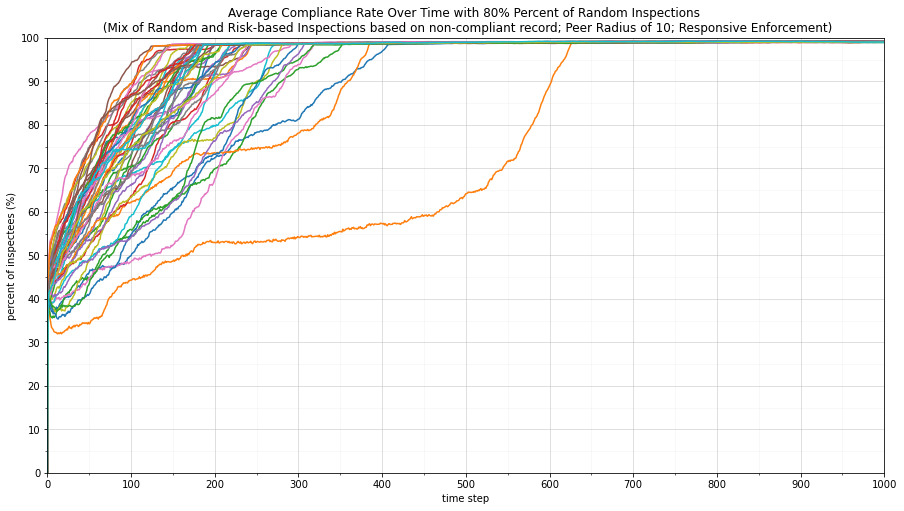

<Figure size 432x288 with 0 Axes>

In [116]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_80_1['step'],mixnoncomp_resp_sharerandinsp_80_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_2['step'],mixnoncomp_resp_sharerandinsp_80_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_3['step'],mixnoncomp_resp_sharerandinsp_80_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_4['step'],mixnoncomp_resp_sharerandinsp_80_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_5['step'],mixnoncomp_resp_sharerandinsp_80_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_6['step'],mixnoncomp_resp_sharerandinsp_80_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_7['step'],mixnoncomp_resp_sharerandinsp_80_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_8['step'],mixnoncomp_resp_sharerandinsp_80_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_9['step'],mixnoncomp_resp_sharerandinsp_80_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_10['step'],mixnoncomp_resp_sharerandinsp_80_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_11['step'],mixnoncomp_resp_sharerandinsp_80_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_12['step'],mixnoncomp_resp_sharerandinsp_80_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_13['step'],mixnoncomp_resp_sharerandinsp_80_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_14['step'],mixnoncomp_resp_sharerandinsp_80_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_15['step'],mixnoncomp_resp_sharerandinsp_80_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_16['step'],mixnoncomp_resp_sharerandinsp_80_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_17['step'],mixnoncomp_resp_sharerandinsp_80_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_18['step'],mixnoncomp_resp_sharerandinsp_80_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_19['step'],mixnoncomp_resp_sharerandinsp_80_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_20['step'],mixnoncomp_resp_sharerandinsp_80_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_21['step'],mixnoncomp_resp_sharerandinsp_80_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_22['step'],mixnoncomp_resp_sharerandinsp_80_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_23['step'],mixnoncomp_resp_sharerandinsp_80_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_24['step'],mixnoncomp_resp_sharerandinsp_80_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_25['step'],mixnoncomp_resp_sharerandinsp_80_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_26['step'],mixnoncomp_resp_sharerandinsp_80_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_27['step'],mixnoncomp_resp_sharerandinsp_80_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_28['step'],mixnoncomp_resp_sharerandinsp_80_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_29['step'],mixnoncomp_resp_sharerandinsp_80_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_30['step'],mixnoncomp_resp_sharerandinsp_80_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_31['step'],mixnoncomp_resp_sharerandinsp_80_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_32['step'],mixnoncomp_resp_sharerandinsp_80_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_33['step'],mixnoncomp_resp_sharerandinsp_80_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_34['step'],mixnoncomp_resp_sharerandinsp_80_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_35['step'],mixnoncomp_resp_sharerandinsp_80_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_36['step'],mixnoncomp_resp_sharerandinsp_80_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_37['step'],mixnoncomp_resp_sharerandinsp_80_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_38['step'],mixnoncomp_resp_sharerandinsp_80_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_39['step'],mixnoncomp_resp_sharerandinsp_80_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_40['step'],mixnoncomp_resp_sharerandinsp_80_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_41['step'],mixnoncomp_resp_sharerandinsp_80_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_42['step'],mixnoncomp_resp_sharerandinsp_80_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_43['step'],mixnoncomp_resp_sharerandinsp_80_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_44['step'],mixnoncomp_resp_sharerandinsp_80_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_45['step'],mixnoncomp_resp_sharerandinsp_80_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_46['step'],mixnoncomp_resp_sharerandinsp_80_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_47['step'],mixnoncomp_resp_sharerandinsp_80_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_48['step'],mixnoncomp_resp_sharerandinsp_80_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_49['step'],mixnoncomp_resp_sharerandinsp_80_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_80_50['step'],mixnoncomp_resp_sharerandinsp_80_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 80% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections80_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')

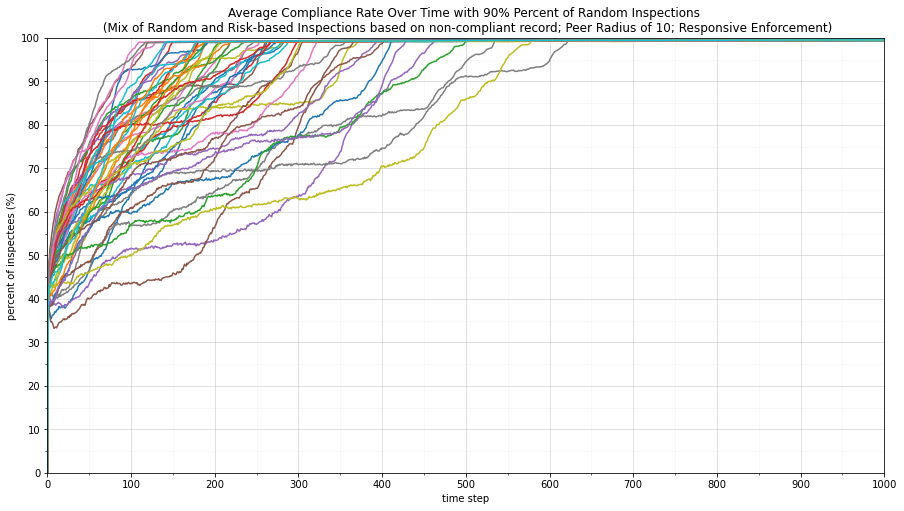

<Figure size 432x288 with 0 Axes>

In [117]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(1, 1, 1)

ax.set_xticks(np.arange(0, 1000.1, 100))
ax.set_xticks(np.arange(0, 1000.1, 50), minor=True)
ax.set_yticks(np.arange(0,100.1,10))
ax.set_yticks(np.arange(0,100.1,5), minor=True)

plt.plot(mixnoncomp_resp_sharerandinsp_90_1['step'],mixnoncomp_resp_sharerandinsp_90_1['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_2['step'],mixnoncomp_resp_sharerandinsp_90_2['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_3['step'],mixnoncomp_resp_sharerandinsp_90_3['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_4['step'],mixnoncomp_resp_sharerandinsp_90_4['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_5['step'],mixnoncomp_resp_sharerandinsp_90_5['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_6['step'],mixnoncomp_resp_sharerandinsp_90_6['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_7['step'],mixnoncomp_resp_sharerandinsp_90_7['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_8['step'],mixnoncomp_resp_sharerandinsp_90_8['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_9['step'],mixnoncomp_resp_sharerandinsp_90_9['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_10['step'],mixnoncomp_resp_sharerandinsp_90_10['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_11['step'],mixnoncomp_resp_sharerandinsp_90_11['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_12['step'],mixnoncomp_resp_sharerandinsp_90_12['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_13['step'],mixnoncomp_resp_sharerandinsp_90_13['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_14['step'],mixnoncomp_resp_sharerandinsp_90_14['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_15['step'],mixnoncomp_resp_sharerandinsp_90_15['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_16['step'],mixnoncomp_resp_sharerandinsp_90_16['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_17['step'],mixnoncomp_resp_sharerandinsp_90_17['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_18['step'],mixnoncomp_resp_sharerandinsp_90_18['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_19['step'],mixnoncomp_resp_sharerandinsp_90_19['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_20['step'],mixnoncomp_resp_sharerandinsp_90_20['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_21['step'],mixnoncomp_resp_sharerandinsp_90_21['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_22['step'],mixnoncomp_resp_sharerandinsp_90_22['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_23['step'],mixnoncomp_resp_sharerandinsp_90_23['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_24['step'],mixnoncomp_resp_sharerandinsp_90_24['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_25['step'],mixnoncomp_resp_sharerandinsp_90_25['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_26['step'],mixnoncomp_resp_sharerandinsp_90_26['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_27['step'],mixnoncomp_resp_sharerandinsp_90_27['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_28['step'],mixnoncomp_resp_sharerandinsp_90_28['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_29['step'],mixnoncomp_resp_sharerandinsp_90_29['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_30['step'],mixnoncomp_resp_sharerandinsp_90_30['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_31['step'],mixnoncomp_resp_sharerandinsp_90_31['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_32['step'],mixnoncomp_resp_sharerandinsp_90_32['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_33['step'],mixnoncomp_resp_sharerandinsp_90_33['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_34['step'],mixnoncomp_resp_sharerandinsp_90_34['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_35['step'],mixnoncomp_resp_sharerandinsp_90_35['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_36['step'],mixnoncomp_resp_sharerandinsp_90_36['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_37['step'],mixnoncomp_resp_sharerandinsp_90_37['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_38['step'],mixnoncomp_resp_sharerandinsp_90_38['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_39['step'],mixnoncomp_resp_sharerandinsp_90_39['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_40['step'],mixnoncomp_resp_sharerandinsp_90_40['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_41['step'],mixnoncomp_resp_sharerandinsp_90_41['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_42['step'],mixnoncomp_resp_sharerandinsp_90_42['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_43['step'],mixnoncomp_resp_sharerandinsp_90_43['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_44['step'],mixnoncomp_resp_sharerandinsp_90_44['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_45['step'],mixnoncomp_resp_sharerandinsp_90_45['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_46['step'],mixnoncomp_resp_sharerandinsp_90_46['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_47['step'],mixnoncomp_resp_sharerandinsp_90_47['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_48['step'],mixnoncomp_resp_sharerandinsp_90_48['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_49['step'],mixnoncomp_resp_sharerandinsp_90_49['perc-compliant'])
plt.plot(mixnoncomp_resp_sharerandinsp_90_50['step'],mixnoncomp_resp_sharerandinsp_90_50['perc-compliant'])


plt.title("Average Compliance Rate Over Time with 90% Percent of Random Inspections \n (Mix of Random and Risk-based Inspections based on non-compliant record; Peer Radius of 10; Responsive Enforcement)")
plt.xlabel('time step')
plt.ylabel('percent of inspectees (%)')
plt.xlim(0,1000)
plt.ylim(0,100.01)
ax.grid(which='minor', alpha=0.1)
ax.grid(which='major', alpha=0.5)
plt.show()
plt.savefig('Percent Random Inspections90_ Time vs Compliant All Runs (Mix non-compliant, Responsive, Radius 10).png', dpi=300, bbox_inches='tight')